In [1]:
import mne
import numpy as np
import os
import json

from functions import ephy_plotting, utils, analysis

# 1. Load datasets

In [2]:
working_path = os.path.dirname(os.getcwd())
results_path = os.path.join(working_path, "results")
behav_results_saving_path = os.path.join(results_path, "behav_results")
# read the json file containing the included and excluded subjects, based on the behavioral results
included_excluded_file = os.path.join(behav_results_saving_path, 'final_included_subjects.json')
with open(included_excluded_file, 'r') as file:
    included_subjects = json.load(file)

# keep only subjects starting with "sub":
# included_subjects = [subj for subj in included_subjects if subj.startswith('sub')]
print(f'Included_subjects: {included_subjects}')
onedrive_path = utils._get_onedrive_path()

#  Set saving path
freq_wide = 'all frequencies'
fmax = 80
saving_path_group = os.path.join(results_path, 'group_level', 'eeg_perc_sig_change', freq_wide)
os.makedirs(saving_path_group, exist_ok=True)  # Create the directory if it doesn't exist
saving_path_on_off = os.path.join(results_path, 'ON_vs_OFF', 'EEG', freq_wide)
os.makedirs(saving_path_on_off, exist_ok=True)

# Set source path for epochs
epochs_path = os.path.join(results_path, 'eeg_epochs')

sub_dict_epochs = {}  #  Stores the epochs for each subject/session


FileNotFoundError: [Errno 2] No such file or directory: 'c:\\Users\\Juliette\\Research\\Projects\\analysis_mSST\\results\\behav_results\\final_included_subjects.json'

In [3]:
# included_subjects.remove('sub006 DBS OFF mSST')
# included_subjects.remove('sub006 DBS ON mSST')
# included_subjects.remove('sub028 DBS OFF mSST')
included_subjects.remove('sub033 DBS OFF mSST') # head tremor artifacts, EEG recording bad
included_subjects.remove('sub033 DBS ON mSST')  # head tremor artifacts, EEG recording bad
included_subjects.remove('C003 mSST')  # EEG recording bad
included_subjects.remove('C010 mSST')  # EEG recording not yet preprocessed
included_subjects.remove('C011 mSST')  # EEG recording not yet preprocessed
included_subjects.remove('C012 mSST') # EEG recording not yet preprocessed


In [4]:
ROIs = {
    'preSMA': ['Fz', 'Cz' #'FC1', 'FC2', ', 'FC5', 'FC6'
               ],
    'r_IFG': ['F8', 'FC6', 'F4'],
    'l_IFG': ['F7', 'FC5', 'F3'],
    'l_M1': ['C3', 'FC5', 'CP1'],
    'r_M1': ['C4', 'FC6', 'CP2'],
    'r_DLPFC': ['F4', 'FC2'],
    'l_DLPFC': ['F3', 'FC1'],
    'occipital': ['O1', 'O2', 'Oz'],
    'central': ['Cz'],
    'C3': ['C3'],
}

In [3]:
for session_ID in included_subjects:
    epochs = mne.read_epochs(os.path.join(epochs_path, f"{session_ID}_EEG_cleaned-long-epo.fif"), preload=True)
    epochs.resample(250, npad='auto')
    sub_dict_epochs[session_ID] = epochs

NameError: name 'included_subjects' is not defined

In [6]:
sub_dict_epochs['sub032 DBS OFF mSST']

<EpochsFIF | 445 events (all good), -3.5 – 3.5 s (baseline off), ~1.62 GB, data loaded, with metadata,
 'GC': 55
 'GF': 56
 'GO': 170
 'GS': 56
 'continue': 54
 'stop': 54>

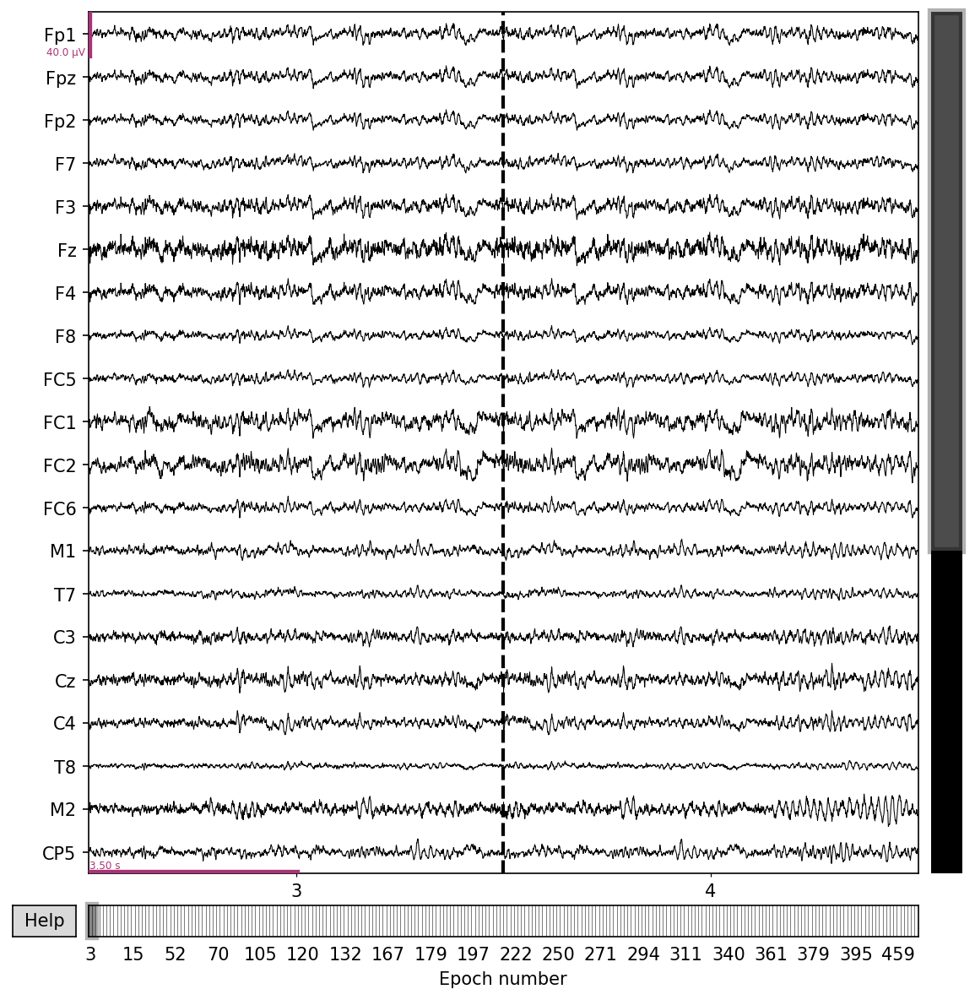

Dropped 0 epochs: 
The following epochs were marked as bad and are dropped:
[]
Channels marked as bad:
none
Dropped 0 epochs: 
The following epochs were marked as bad and are dropped:
[]
Channels marked as bad:
none


In [17]:
%matplotlib qt
sub_dict_epochs['sub023 DBS ON mSST'].plot(n_epochs=2)

# 2. Work with epochs #

## 2.1. Set the parameters for TFR plots ##

In [16]:
######################
### TFR PARAMETERS ###
######################

# decim = 1 
# freqs = np.arange(1, 40, 1) 
# n_cycles = np.minimum(np.maximum(freqs / 2.0, 3), 20)
# tfr_args = dict(
#     method="morlet",
#     freqs=freqs,
#     n_cycles=n_cycles,
#     decim=decim,
#     return_itc=False,
#     average=False
# )        

# tmin_tmax = [-500, 1500]
# vmin_vmax = [-70, 70]

######################
### TFR PARAMETERS ###
######################

decim = 1 
fmax=80
freqs = np.arange(1, fmax, 1) 
# For 500ms time resolution at 1 Hz: n_cycles = 1 * 0.5 = 0.5
# For 50ms time resolution at 40 Hz: n_cycles = 40 * 0.05 = 2
# Linear interpolation between these points
#n_cycles = 0.5 + (freqs - 1) * (2 - 0.5) / (40 - 1)
#n_cycles = freqs / 2.0
n_cycles = np.minimum(np.maximum(freqs / 2.0, 2), 20)

tfr_args = dict(
    method="morlet",
    freqs=freqs,
    n_cycles=n_cycles,
    decim=decim,
    return_itc=False,
    average=False
)        
baseline_correction_method = 'group_average'  # 'single_trial' or 'group_average'
tmin_tmax = [0, 1500]
vmin_vmax = [-70, 70] if baseline_correction_method == 'group_average' else [-5, 5]

sub_nums = []  #  List to store unique subject numbers

for sub in included_subjects:
    sub = sub[:6]
    if sub not in sub_nums:  # Check if sub is already in sub_nums
        sub_nums.append(sub)

In [7]:
tfr_dict = {
    'DBS OFF': {},
    'DBS ON': {},
    'controls': {}
}

In [37]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib


# from functions.analysis import get_tfr_decomposition
# from functions.ephy_plotting import plot_tfr_result

import mne
import pandas as pd
import os
import scipy 
from functions.analysis import identify_significant_clusters


def plot_tfr_result_contrast_groups(
        groups,
        tfr_dict,
        epochs_cond,
        roi,
        tfr_args,
        tmin_tmax,
        vmin_vmax,
        baseline_correction,
        baseline_correction_method,
        sub_num,
        saving_path
        ):
    
    add_rt = False
    add_ssd = False
    dependent_measures = False  # by default, measures are treatet as independent

    contrast = groups[0] + ' - ' + groups[1]

    title_prefix = "Power change" if baseline_correction else "Power"
    bc_note = "" if baseline_correction else ", no baseline correction"
    subject_info = f"nSub = {sub_num}" #if sub_num > 1 else sub
    cond_type, outcome = epochs_cond.split('_')[:2]
    # cond_type2, outcome2 = epochs_cond[1].split('_')[:2]

    # Set the x label based on what the epochs are centered on:
    aligned_on = epochs_cond.split('_')[-1] # both conditions should always be centered on the same cue

    if aligned_on == 'response':
        xlabel = 'Time from RESPONSE (s)'
    elif aligned_on == 'feedback':
        xlabel = 'Time from FEEDBACK (s)'
    elif aligned_on == 'square':
        xlabel = 'Time from GO cue (s)'
        add_rt = True if (
        (cond_type in ('lmGO', 'GO', 'GF', 'GC') and outcome == 'successful') or
        (cond_type == 'GS' and outcome == 'unsuccessful')
        ) else False
        add_ssd = True if any(x in epochs_cond for x in ('GS', 'GC')) else False
    elif aligned_on == 'triangle':
        xlabel = 'Time from STOP/CONTINUE cue (s)'
        add_rt = True if (cond_type == 'GS' and outcome == 'unsuccessful') or (cond_type == 'GC' and outcome == 'successful') else False

    # check that time dimensions are the same for both groups, if not crop to the minimum length
    shape0 = tfr_dict[groups[0]][epochs_cond]['all_percentage_change'].shape
    shape1 = tfr_dict[groups[1]][epochs_cond]['all_percentage_change'].shape
    if shape0[2] != shape1[2]:
        print(f"The two groups have different time dimensions: {shape0[2]} vs {shape1[2]}. Cropping to the minimum length for contrast.")
    min_len = min(shape0[2], shape1[2])
    times = tfr_dict[groups[0]][epochs_cond]['times']
    tfr_dict[groups[0]][epochs_cond]['all_percentage_change'] = tfr_dict[groups[0]][epochs_cond]['all_percentage_change'][:, :, :min_len]
    tfr_dict[groups[1]][epochs_cond]['all_percentage_change'] = tfr_dict[groups[1]][epochs_cond]['all_percentage_change'][:, :, :min_len]
    times = times[:min_len]

    if 'DBS' in groups[0] and 'DBS' in groups[1]:
        # if both groups are DBS groups then measures are dependent because they come from the same subjects
        dependent_measures = True

        # tfr_dict[coi]['times'] = times
        contrast_percentage_change = tfr_dict[groups[0]][epochs_cond]['all_percentage_change'] - tfr_dict[groups[1]][epochs_cond]['all_percentage_change']
        tfr_dict[epochs_cond] = {}
        tfr_dict[epochs_cond]['contrast_groups'] = {
            'all_percentage_change': contrast_percentage_change,
            'times': times,
            'freqs': freqs}
        all_percentage_change = tfr_dict[epochs_cond]['contrast_groups']['all_percentage_change']

    else:
        # independent measures, at least one group is controls
        all_percentage_change = [tfr_dict[groups[0]][epochs_cond]['all_percentage_change'], 
                                      tfr_dict[groups[1]][epochs_cond]['all_percentage_change']]      

    mean_rt_all1 = tfr_dict[groups[0]][epochs_cond]['mean_rt_all']
    mean_rt_all2 = tfr_dict[groups[1]][epochs_cond]['mean_rt_all']
    mean_ssd_all1 = tfr_dict[groups[0]][epochs_cond]['mean_ssd_all']
    mean_ssd_all2 = tfr_dict[groups[1]][epochs_cond]['mean_ssd_all']
    # n_obs = all_percentage_change.shape[0]
    # # print(n_obs)
    pval = 0.05
    # df = n_obs - 1
    # threshold = scipy.stats.t.ppf(1-pval / 2, df) # two-tailed distribution
    threshold = None
    n_permutations = 1000

    # Compute permutation cluster test 
    if dependent_measures:
        T_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_1samp_test(
        all_percentage_change, n_permutations=n_permutations,
        threshold=threshold, tail=0,
        out_type= "mask", seed=11111, verbose=True)

    else:
        # F_observed, clusters, cluster_p_values, H0 for independent samples
        T_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_test(
        all_percentage_change, n_permutations=n_permutations,
        threshold=threshold, tail=0,
        out_type= "mask", seed=11111, verbose=True)
    print(f"p_values: {cluster_p_values}")
    print(f"P_values shape: {cluster_p_values.shape}")
    
    condition = epochs_cond + '_' + contrast
    identify_significant_clusters(
        cluster_p_values, 
        clusters,
        tfr_dict[epochs_cond]['contrast_groups']['times'],
        T_obs,
        pval,
        tfr_args,
        condition = condition,
        roi = roi,
        saving_path = saving_path
        )

    # Compute grand averages
    avg_percentage_change = np.nanmean(all_percentage_change, axis=0)     
    assert T_obs.shape == avg_percentage_change.shape  

    # Compute min and max along the frequency axis
    if not baseline_correction:
        min_values = np.min(avg_percentage_change)  # Shape: (n_subjects, n_times)
        max_values = np.max(avg_percentage_change)
        
    # Plot
    # plt.figure(figsize=(4, 6))
    fig, ax = plt.subplots(figsize=(4, 6), constrained_layout=True)
    vmin, vmax = (vmin_vmax if baseline_correction else (min_values, max_values))
    times = tfr_dict[epochs_cond]['contrast_groups']['times'] 
    print(f'vmin: {vmin}, vmax: {vmax}')
    ax.imshow(avg_percentage_change, aspect='auto', origin='lower', 
                            # extent=[tmin_tmax[0]*1000, tmin_tmax[1]*1000, tfr_args["freqs"][0], tfr_args["freqs"][-1]], 
                            extent = [times[0], times[-1], freqs[0], freqs[-1]],
                            cmap='jet', vmin=vmin, vmax=vmax)
    ax.set_xlabel(xlabel)
    ax.set_ylabel('Frequency (Hz)')
    title_text = f"{title_prefix} \n {epochs_cond} \n {contrast} \n {roi} \n {subject_info}{bc_note}"
    fig.suptitle(title_text, fontsize=10)
    # ax.set_title(f"{title_prefix} \n {contrast} \n {roi} \n {subject_info}{bc_note}")
        
    if baseline_correction:
        if baseline_correction_method == 'single_trial':
            colorbar_label = 'Change from baseline (dB)'
        else:
            colorbar_label = 'Percent change from baseline (%)'
    else:
        colorbar_label = 'Mean Power (µV²)'
    fig.colorbar(ax.images[0], label=colorbar_label)   
    
    # add significant clusters on the plot if group-level analysis:
    if sub_num > 1:
        for c, p_val in zip(clusters, cluster_p_values):
            if p_val <= pval:
                mask = np.zeros_like(T_obs, dtype=bool)  # Explicitly match dimensions
                mask[c] = True
                ax.contour(mask, levels=[0.5], colors='black', linewidths=1.5,
                            extent=[tmin_tmax[0]*1000, tmin_tmax[1]*1000, tfr_args["freqs"][0], tfr_args["freqs"][-1]])

    if add_rt:
        avg_rt1 = np.nanmean(mean_rt_all1)*1000
        avg_rt2 = np.nanmean(mean_rt_all2)*1000
        if aligned_on == 'triangle':
            avg_rt1 -= np.nanmean(mean_ssd_all1)*1000
            avg_rt2 -= np.nanmean(mean_ssd_all2)*1000
        ax.axvline(x=avg_rt1, color='black', linestyle='-', label=f'Mean RT {epochs_cond} {groups[0]}')
        ax.axvline(x=avg_rt2, color='gray', linestyle='-', label=f'Mean RT {epochs_cond} {groups[1]}')

    if add_ssd :
        if mean_ssd_all1 is not None:
            avg_ssd1 = np.nanmean(mean_ssd_all1)*1000
            ax.axvline(x=avg_ssd1, color='k', linestyle='--', label=f'Mean SSD {groups[0]}')
        if mean_ssd_all2 is not None:
            avg_ssd2 = np.nanmean(mean_ssd_all2)*1000
            ax.axvline(x=avg_ssd2, color='k', linestyle='--', label=f'Mean SSD {groups[1]}')
    
    fig.savefig(os.path.join(saving_path, f"{epochs_cond}_{contrast}_{roi}_nSub{str(sub_num)}.png"))


def plot_tfr_result_contrast(
        group,
        tfr_dict,
        epochs_cond,
        roi,
        tfr_args,
        tmin_tmax,
        vmin_vmax,
        baseline_correction,
        baseline_correction_method,
        sub_num,
        saving_path,
        save_as = 'png'
        ):
    add_rt1 = False
    add_rt2 = False
    add_ssd1 = False
    add_ssd2 = False

    contrast = epochs_cond[0] + ' - ' + epochs_cond[1]

    title_prefix = "Power change" if baseline_correction else "Power"
    bc_note = "" if baseline_correction else ", no baseline correction"
    subject_info = f"nSub = {sub_num}" #if sub_num > 1 else sub
    cond_type1, outcome1 = epochs_cond[0].split('_')[:2]
    cond_type2, outcome2 = epochs_cond[1].split('_')[:2]

    # Set the x label based on what the epochs are centered on:
    aligned_on = epochs_cond[0].split('_')[-1] # both conditions should always be centered on the same cue

    if aligned_on == 'response':
        xlabel = 'Time from RESPONSE (s)'
    elif aligned_on == 'feedback':
        xlabel = 'Time from FEEDBACK (s)'
    elif aligned_on == 'square':
        xlabel = 'Time from GO cue (s)'
        add_rt1 = True if (
        (cond_type1 in ('lmGO', 'GO', 'GF', 'GC') and outcome1 == 'successful') or
        (cond_type1 == 'GS' and outcome1 == 'unsuccessful')
        ) else False
        add_rt2 = True if (
        (cond_type2 in ('lmGO', 'GO', 'GF', 'GC') and outcome2 == 'successful') or
        (cond_type2 == 'GS' and outcome2 == 'unsuccessful')
        ) else False
        add_ssd1 = True if any(x in epochs_cond[0] for x in ('GS', 'GC')) else False
        add_ssd2 = True if any(x in epochs_cond[1] for x in ('GS', 'GC')) else False
    elif aligned_on == 'triangle':
        xlabel = 'Time from STOP/CONTINUE cue (s)'
        add_rt1 = True if (cond_type1 == 'GS' and outcome1 == 'unsuccessful') or (cond_type1 == 'GC' and outcome1 == 'successful') else False
        add_rt2 = True if (cond_type2 == 'GS' and outcome2 == 'unsuccessful') or (cond_type2 == 'GC' and outcome2 == 'successful') else False

    all_percentage_change = tfr_dict[group]['contrast']['all_percentage_change']
    mean_rt_all1 = tfr_dict[group][epochs_cond[0]]['mean_rt_all']
    mean_rt_all2 = tfr_dict[group][epochs_cond[1]]['mean_rt_all']
    mean_ssd_all1 = tfr_dict[group][epochs_cond[0]]['mean_ssd_all']
    mean_ssd_all2 = tfr_dict[group][epochs_cond[1]]['mean_ssd_all']
    n_obs = all_percentage_change.shape[0]
    print(n_obs)
    pval = 0.05
    df = n_obs - 1
    threshold = scipy.stats.t.ppf(1-pval / 2, df) # two-tailed distribution
    #threshold = None
    n_permutations = 1000

    # Compute permutation cluster test for the left stn
    T_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_1samp_test(
    all_percentage_change, n_permutations=n_permutations,
    threshold=threshold, tail=0,
    out_type= "mask", seed=11111, verbose=True)
    print(f"p_values: {cluster_p_values}")
    print(f"P_values shape: {cluster_p_values.shape}")
    
    condition = group + '_' + contrast
    identify_significant_clusters(
        cluster_p_values, 
        clusters,
        tfr_dict[group]['contrast']['times'],
        T_obs,
        pval,
        tfr_args,
        condition = condition,
        roi = roi,
        saving_path = saving_path
        )

    # Compute grand averages
    avg_percentage_change = np.nanmean(all_percentage_change, axis=0)     
    assert T_obs.shape == avg_percentage_change.shape  

    # Compute min and max along the frequency axis
    if not baseline_correction:
        min_values = np.min(avg_percentage_change)  # Shape: (n_subjects, n_times)
        max_values = np.max(avg_percentage_change)
        
    # Plot
    # plt.figure(figsize=(4, 6))
    fig, ax = plt.subplots(figsize=(4, 6), constrained_layout=True)
    vmin, vmax = (vmin_vmax if baseline_correction else (min_values, max_values))
    times = tfr_dict[group]['contrast']['times'] 
    print(f'vmin: {vmin}, vmax: {vmax}')
    ax.imshow(avg_percentage_change, aspect='auto', origin='lower', 
                            # extent=[tmin_tmax[0]*1000, tmin_tmax[1]*1000, tfr_args["freqs"][0], tfr_args["freqs"][-1]], 
                            extent = [times[0], times[-1], freqs[0], freqs[-1]],
                            cmap='jet', vmin=vmin, vmax=vmax)
    ax.set_xlabel(xlabel)
    ax.set_ylabel('Frequency (Hz)')
    title_text = f"{title_prefix} \n {group} \n {contrast} \n {roi} \n {subject_info}{bc_note}"
    fig.suptitle(title_text, fontsize=10)
    # ax.set_title(f"{title_prefix} \n {contrast} \n {roi} \n {subject_info}{bc_note}")
        
    if baseline_correction:
        if baseline_correction_method == 'single_trial':
            colorbar_label = 'Change from baseline (dB)'
        else:
            colorbar_label = 'Percent change from baseline (%)'
    else:
        colorbar_label = 'Mean Power (µV²)'
    fig.colorbar(ax.images[0], label=colorbar_label)   
    
    # add significant clusters on the plot if group-level analysis:
    if sub_num > 1:
        for c, p_val in zip(clusters, cluster_p_values):
            if p_val <= 0.1:
                mask = np.zeros_like(T_obs, dtype=bool)  # Explicitly match dimensions
                mask[c] = True
                ax.contour(mask, levels=[0.5], colors='black', linewidths=1.5,
                            extent=[tmin_tmax[0]*1000, tmin_tmax[1]*1000, tfr_args["freqs"][0], tfr_args["freqs"][-1]])

    if add_rt1:
        avg_rt1 = np.nanmean(mean_rt_all1)*1000
        if aligned_on == 'triangle':
            avg_rt1 -= np.nanmean(mean_ssd_all1)*1000
        ax.axvline(x=avg_rt1, color='black', linestyle='-', label=f'Mean RT {epochs_cond[0]}')
    if add_rt2:
        avg_rt2 = np.nanmean(mean_rt_all2)*1000
        if aligned_on == 'triangle':
            avg_rt2 -= np.nanmean(mean_ssd_all2)*1000
        ax.axvline(x=avg_rt2, color='gray', linestyle='-', label=f'Mean RT {epochs_cond[1]}')
    if add_ssd1 and mean_ssd_all1 is not None:
        avg_ssd1 = np.nanmean(mean_ssd_all1)*1000
        ax.axvline(x=avg_ssd1, color='k', linestyle='--', label='Mean SSD')
    if add_ssd2 and mean_ssd_all2 is not None:
        avg_ssd2 = np.nanmean(mean_ssd_all2)*1000
        ax.axvline(x=avg_ssd2, color='k', linestyle='--', label='Mean SSD')
    fig.savefig(os.path.join(saving_path, f"{group}_{contrast}_{roi}_nSub{str(sub_num)}.{save_as}"))
     



def plot_tfr_result(
        group,
        all_percentage_change,
        times,
        epochs_cond,
        roi,
        tfr_args,
        tmin_tmax,
        vmin_vmax,
        baseline_correction,
        baseline_correction_method,
        sub_num,
        sub = None,
        mean_rt_all = None,
        mean_ssd_all = None,
        saving_path = None,
        save_as = 'png'
        ):
    add_rt = False
    add_ssd = False

    title_prefix = "Power change" if baseline_correction else "Power"
    bc_note = "" if baseline_correction else ", no baseline correction"
    subject_info = f"nSub = {sub_num}" if sub_num > 1 else sub
    cond_type, outcome = epochs_cond.split('_')[:2]

    # Set the x label based on what the epochs are centered on:
    aligned_on = epochs_cond.split('_')[-1]
    if aligned_on == 'response':
        xlabel = 'Time from RESPONSE (s)'
    elif aligned_on == 'feedback':
        xlabel = 'Time from FEEDBACK (s)'
    elif aligned_on == 'square':
        xlabel = 'Time from GO cue (s)'
        add_rt = True if (
        (cond_type in ('lmGO', 'GO', 'GF', 'GC') and outcome == 'successful') or
        (cond_type == 'GS' and outcome == 'unsuccessful')
        ) else False
        add_ssd = True if any(x in epochs_cond for x in ('GS', 'GC')) else False
    elif aligned_on == 'triangle':
        xlabel = 'Time from STOP/CONTINUE cue (s)'
        add_rt = True if (cond_type == 'GS' and outcome == 'unsuccessful') or (cond_type == 'GC' and outcome == 'successful') else False

    # Compute grand averages
    avg_percentage_change = np.nanmean(all_percentage_change, axis=0)       

    # Compute min and max along the frequency axis
    if not baseline_correction:
        min_values = np.min(avg_percentage_change)  # Shape: (n_subjects, n_times)
        max_values = np.max(avg_percentage_change)
        
    # Plot Left STN
    # plt.figure(figsize=(4, 6))
    fig, ax = plt.subplots(figsize=(4, 6), constrained_layout=True)
    vmin, vmax = (vmin_vmax if baseline_correction else (min_values, max_values))
    ax.imshow(avg_percentage_change, aspect='auto', origin='lower', 
                            extent=[times[0], times[-1], tfr_args["freqs"][0], tfr_args["freqs"][-1]], 
                            cmap='jet', vmin=vmin, vmax=vmax)
    ax.set_xlabel(xlabel)
    ax.set_ylabel('Frequency (Hz)')
    title_text = f"{title_prefix} \n {group} \n {epochs_cond} \n {roi} \n {subject_info}{bc_note}"
    fig.suptitle(title_text, fontsize=10)
    # ax.set_title(f"{title_prefix} \n {group} \n {epochs_cond} \n {roi} \n {subject_info}{bc_note}")
    if add_rt:
        avg_rt = np.nanmean(mean_rt_all)*1000
        if aligned_on == 'triangle':
            avg_rt -= np.nanmean(mean_ssd_all)*1000
        ax.axvline(x=avg_rt, color='black', linestyle='-', label='Mean RT')
    if add_ssd and mean_ssd_all is not None:
        avg_ssd = np.nanmean(mean_ssd_all)*1000
        ax.axvline(x=avg_ssd, color='k', linestyle='--', label='Mean SSD')
        
    if baseline_correction:
        if baseline_correction_method == 'single_trial':
            colorbar_label = 'Change from baseline (dB)'
        else:
            colorbar_label = 'Percent change from baseline (%)'
    else:
        colorbar_label = 'Mean Power (µV²)'
    fig.colorbar(ax.images[0], label=colorbar_label)    
    fig.savefig(os.path.join(saving_path, f"{group}_{epochs_cond}_{roi}_{subject_info}.{save_as}"))



def get_tfr_decomposition(
        epochs, 
        cond_of_interest, 
        ch_names, 
        tfr_args, 
        baseline_correction, 
        baseline_correction_method, 
        tmin_tmax
        ):
    latency_matched = False
    mean_rt = None
    mean_ssd = None
    
    if cond_of_interest.split('_')[0] == 'lmGO':
        latency_matched = True
        epoch_type = 'GO'
    else:
        # Parse epoch condition
        epoch_type = cond_of_interest.split('_')[0]

    outcome_str, aligned_str = cond_of_interest.split('_')[1], cond_of_interest.split('_')[2]
    outcome = 1.0 if outcome_str == "successful" else 0.0     

    # Select the appropriate epochs
    type_mask = epochs.metadata["event"] == epoch_type
    outcome_mask = epochs.metadata["key_resp_experiment.corr"] == outcome
    data = epochs[type_mask & outcome_mask]    

    if latency_matched:
        rt = np.asarray(data.metadata['key_resp_experiment.rt'])
        threshold = np.percentile(rt, 50)
        slow_mask = rt >= threshold
        data = data[slow_mask] 

    # get RTs and SSDs for later plotting:
    rt = np.asarray(data.metadata['key_resp_experiment.rt'])
    if np.any(~np.isnan(rt)):        # at least one value that is not nan
        mean_rt = np.nanmean(rt)
    else:
        mean_rt = None

    ssd = None
    if epoch_type == 'GS':
        ssd = np.asarray(data.metadata['stop_signal_time'])
    elif epoch_type == 'GC':
        ssd = np.asarray(data.metadata['continue_signal_time'])
    mean_ssd = np.nanmean(ssd) if ssd is not None else None

    # Select only desired channels
    epochs = data.copy().pick(ch_names)

    # Compute TFR
    power = epochs.compute_tfr(**tfr_args)  # shape: (n_epochs, n_channels, n_freqs, n_times)      
    power.data *= 1e12  # V² → (µV)²
    
    # Average across channels if multiple channels are specified
    if len(ch_names) > 1:
        power_mean = np.nanmean(power.data, axis=1)  # (n_epochs, n_freqs, n_times)
    else:
        power_mean = power.data[:, 0, :, :]  # (n_epochs, n_freqs, n_times)

    times = power.times * 1000
    dt_ms = 1000/round(epochs.info['sfreq'])
    #n_times_new = int(np.round(((tmin_tmax[1]- tmin_tmax[0])*1000) / dt_ms))
    freqs = power.freqs

    # crop to keep only times of interest               
    # determine t0 et t1 indices based on tmin_tmax and aligned_str
    if aligned_str != 'square':
        if aligned_str == 'response':
            t0_per_trial = np.array(data.metadata['key_resp_experiment.rt']) * 1000  # convert to ms
        elif aligned_str == 'feedback':
            if epoch_type == 'GS' and outcome_str == 'successful':
                t0_per_trial = (np.array(data.metadata['stop_signal_time']) + 1.5) * 1000  # feedback is at 1000 ms after response
            else:
                t0_per_trial = (np.array(data.metadata['key_resp_experiment.rt']) + 0.5) * 1000  # feedback is at 500 ms after response
        elif aligned_str == 'triangle':
            if epoch_type == 'GS': 
                ssd_column = 'stop_signal_time'
            elif epoch_type == 'GC':
                ssd_column = 'continue_signal_time'                        
            t0_per_trial = np.array(data.metadata[ssd_column]) * 1000
    
        new_epochs = []
        if baseline_correction and baseline_correction_method == 'group_average':
            # baseline_power = np.empty((power_mean.shape[0], power_mean.shape[1], 1))  # (n_trials, n_freqs, 1)
            mean_power = np.nanmean(power_mean, axis=0)  # (n_freqs, n_times)
            # Define baseline period for change calculation
            baseline_indices = (times >= -500) & (times <= -200)
            baseline_power = np.nanmean(mean_power[:, baseline_indices], axis=1, keepdims=True)  # shape: (n_freqs, 1 time)            
        
        for i in range(power_mean.shape[0]):
            t0_idx = t0_per_trial[i] + tmin_tmax[0]*1000
            t1_idx = t0_per_trial[i] + tmin_tmax[1]*1000
            time_idx = (times >= t0_idx) & (times <= t1_idx)
            new_epochs.append(power_mean[i][:, time_idx])  # shape: (n_freqs, n_times_new)

        min_len = min(e.shape[1] for e in new_epochs)
        new_epochs = [e[:, :min_len] for e in new_epochs]
        new_epochs = np.stack(new_epochs, axis=0)  # shape: (n_epochs, n_freqs, n_times_new)
        new_times = np.arange(tmin_tmax[0]*1000, tmin_tmax[1]*1000, dt_ms)
        mean_power = np.nanmean(new_epochs, axis=0)
        times = new_times
        change = (mean_power - baseline_power) / baseline_power * 100  # percent change  # shape: (n_freqs, n_times)
        # mean_power = change

    else:
        mean_power = np.nanmean(power_mean, axis=0)  # (n_freqs, n_times)

        if baseline_correction and baseline_correction_method == 'group_average':
            # Define baseline period for change calculation
            baseline_indices = (times >= -500) & (times <= -200)
            baseline_power = np.nanmean(mean_power[:, baseline_indices], axis=1, keepdims=True)  # shape: (n_freqs, 1 time)
            change = (mean_power - baseline_power) / baseline_power * 100  # percent change  # shape: (n_freqs, n_times)
            # mean_power = change
        
        time_idx = (times >= tmin_tmax[0]*1000) & (times <= tmin_tmax[1]*1000)
        change = change[:, time_idx]
        times = times[time_idx]

    return change, times, freqs, mean_rt, mean_ssd        


def meta_function_tfr_intra_group(
        tfr_dict, # store tfr results
        sub_group, # specify which group to analyze (e.g. 'DBS OFF', 'DBS ON', 'controls')
        sub_dict_epochs, # dictionary containing all subjects' data
        single_sub, # True or False, whether to plot single subject TFRs or group averages
        epochs_cond, # what condition(s) to analyse (e.g. ['GO_successful_square'], ['GO_successful_square', 'GS_successful_square'])
        roi, # region of interest (e.g. ['LEFT_STN'], ['RIGHT_STN'], ['LEFT_STN', 'RIGHT_STN']). A list creates an average of all channels in the list.
        tfr_args, # dictionary containing tfr parameters (e.g. frequencies of interest, number of cycles, etc.)
        tmin_tmax = [0, 1.5], # time window of interest for plotting (e.g. [-0.5, 1.5])
        plot_contrast = False, # True or False, whether to plot contrasts between two conditions
        plot_single_condition = True, # True or False, whether to plot single conditions
        vmin_vmax = [-70, 70], # min and max values for color scale (e.g. [-70, 70] if in percentage change)
        baseline_correction = True, # True or False, whether to apply baseline correction
        baseline_correction_method = 'group_average', # method for baseline correction (e.g. 'group_average' or 'single_trial')
        saving_path = "C:\\Users\\Juliette\\Research\\Projects\\analysis_mSST\\results", # path to save the figures
        save_as = 'png', # format to save the figures (e.g. 'png', 'pdf')
):
    """
    epochs_cond can be a list of one condition (e.g. ['GO_successful_square']) or a 
    list of two conditions to compare (e.g. ['GO_successful_square', 'GS_successful_square']). 
    The structure should always be 'condition_outcome_(cue to align on)'.
    For example:
    GS_successful_square means Stop Trials, successful trials, aligned to Go cue.
    GS_successful_triangle means Stop Trials, successful trials, aligned to Stop cue.
    GS_unsuccessful_feedback means Stop Trials, unsuccessful trials, aligned to feedback.
    GO_successful_response means Go Trials, successful trials, aligned to response.
    """

    # First, extract information about what the user wants to plot/analyze:
    # single_condition = True if len(epochs_cond) == 1 else False
    # coi = epochs_cond[0] if single_condition else epochs_cond[0] + ' - ' + epochs_cond[1]

    # Validate epochs_cond format
    assert all(epochs_cond[i].split('_')[0] in ['lmGO', 'GO', 'GS', 'GF', 'GC'] for i in range(len(epochs_cond))), "Condition should start with 'lmGO', 'GO', 'GF', 'GC' or 'GS'" 

    if plot_contrast:
        if len(epochs_cond) == 2:
            suffix0 = epochs_cond[0].split('_')[-1]
            suffix1 = epochs_cond[1].split('_')[-1]
            if not (suffix0 == suffix1 or {suffix0, suffix1} == {"stop", "continue"}):
                raise ValueError("Both conditions should be aligned to the same cue for comparison (or be stop/continue)")
    # Validate plot_contrast parameter:
    if plot_contrast and len(epochs_cond) != 2:
        raise ValueError("To plot contrasts, exactly two conditions must be provided in epochs_cond.")


    # for group in sub_groups:
    for coi in epochs_cond:
        all_percentage_change = []
        subs_included = []

        # Then, extract the relevant epochs decompositions from sub_dict based on the specified conditions and ROIs.
        # sub-select epochs/subjects based on sub_groups
        group_key = sub_group if 'DBS' in sub_group else 'C'
        selected_sub_dict_epochs = {key: value for key, value in sub_dict_epochs.items() if group_key in key}
        mean_rt_all = []
        mean_ssd_all = []

        for sub, epochs in selected_sub_dict_epochs.items():        
            if single_sub: 
                all_percentage_change = []
                sub_num = 1

            mean_power, times, freqs, mean_rt, mean_ssd = get_tfr_decomposition(
                epochs = epochs, 
                cond_of_interest = coi, 
                ch_names = roi, 
                tfr_args = tfr_args, 
                baseline_correction= baseline_correction,
                baseline_correction_method= baseline_correction_method,
                tmin_tmax = tmin_tmax
            )
            all_percentage_change.append(mean_power)
            subs_included.append(sub)
            mean_rt_all.append(mean_rt)
            mean_ssd_all.append(mean_ssd)

            # Then plot the average TFR if requested
            if single_sub : 
                sub_num = 1
                if plot_single_condition:
                    plot_tfr_result(
                        group = sub_group,
                        all_percentage_change = all_percentage_change,
                        times = times,
                        epochs_cond = coi,
                        roi = roi,
                        tfr_args = tfr_args,
                        tmin_tmax = tmin_tmax,
                        vmin_vmax = vmin_vmax,
                        baseline_correction = baseline_correction,
                        baseline_correction_method = baseline_correction_method,
                        sub_num = sub_num,
                        sub = sub,
                        mean_rt_all = mean_rt,
                        mean_ssd_all = mean_ssd,
                        saving_path = saving_path,
                        save_as = save_as
                        )
        # print(len(all_percentage_change))
        if not single_sub:
            sub_num = len(subs_included)
            # Convert to array (shape: (n_subs, n_freqs, n_times))
            min_len = min(e.shape[1] for e in all_percentage_change)
            all_percentage_change = [e[:, :min_len] for e in all_percentage_change]
            all_percentage_change = np.stack(all_percentage_change, axis=0)

            if plot_single_condition:
                plot_tfr_result(
                    group = sub_group,
                    all_percentage_change = all_percentage_change,
                    times = times,
                    epochs_cond = coi,
                    roi = roi,
                    tfr_args = tfr_args,
                    tmin_tmax = tmin_tmax,
                    vmin_vmax = vmin_vmax,
                    baseline_correction = baseline_correction,
                    baseline_correction_method = baseline_correction_method,
                    sub_num = sub_num,
                    sub = None,
                    mean_rt_all = mean_rt_all,
                    mean_ssd_all = mean_ssd_all,
                    saving_path = saving_path,
                    save_as = save_as
                    )     

            # if len(roi) > 1:
            tfr_dict[sub_group][coi] = {
                'all_percentage_change': all_percentage_change,
                'mean_rt_all': mean_rt_all,
                'mean_ssd_all': mean_ssd_all,
                'times': times,
                'freqs': freqs} 
            # else:
            #     tfr_dict[sub_group][coi] = {
            #         'all_percentage_change': all_percentage_change,
            #         roi[0]: all_percentage_change,
            #         'mean_rt_all': mean_rt_all,
            #         'mean_ssd_all': mean_ssd_all,
            #         'times': times,
            #         'freqs': freqs}                 


# If needed, add statistical tests between conditions and add to the plot.
    if plot_contrast:
        # subtract the percentage changes of the two conditions
        # check that the two conditions have the same shape
        # correct shape if needed:
        shape0 = tfr_dict[sub_group][epochs_cond[0]]['all_percentage_change'].shape
        shape1 = tfr_dict[sub_group][epochs_cond[1]]['all_percentage_change'].shape
        if shape0[2] != shape1[2]:
            print(f"The two conditions have different time dimensions: {shape0[2]} vs {shape1[2]}. Cropping to the minimum length for contrast.")
        min_len = min(shape0[2], shape1[2])
        tfr_dict[sub_group][epochs_cond[0]]['all_percentage_change'] = tfr_dict[sub_group][epochs_cond[0]]['all_percentage_change'][:, :, :min_len]
        tfr_dict[sub_group][epochs_cond[1]]['all_percentage_change'] = tfr_dict[sub_group][epochs_cond[1]]['all_percentage_change'][:, :, :min_len]
        times = times[:min_len]
        tfr_dict[sub_group][coi]['times'] = times
        
        contrast_percentage_change = tfr_dict[sub_group][epochs_cond[0]]['all_percentage_change'] - tfr_dict[sub_group][epochs_cond[1]]['all_percentage_change']
        tfr_dict[sub_group]['contrast'] = {
            'all_percentage_change': contrast_percentage_change,
            'times': times,
            'freqs': freqs}
        
        plot_tfr_result_contrast(
            group = sub_group,
            tfr_dict = tfr_dict,
            epochs_cond = epochs_cond,
            roi = roi,
            tfr_args = tfr_args,
            tmin_tmax = tmin_tmax,
            vmin_vmax = vmin_vmax,
            baseline_correction = baseline_correction,
            baseline_correction_method = baseline_correction_method,
            sub_num = sub_num,
            saving_path = saving_path,
            save_as = save_as            
            )    
    
    return tfr_dict


# def meta_function_tfr_intra_group(
#         tfr_dict, # store tfr results
#         sub_group, # specify which group to analyze (e.g. 'DBS OFF', 'DBS ON', 'controls')
#         sub_dict_epochs, # dictionary containing all subjects' data
#         single_sub, # True or False, whether to plot single subject TFRs or group averages
#         epochs_cond, # what condition(s) to analyse (e.g. ['GO_successful_square'], ['GO_successful_square', 'GS_successful_square'])
#         roi, # region of interest (e.g. ['LEFT_STN'], ['RIGHT_STN'], ['LEFT_STN', 'RIGHT_STN']). A list creates an average of all channels in the list.
#         tfr_args, # dictionary containing tfr parameters (e.g. frequencies of interest, number of cycles, etc.)
#         tmin_tmax = [0, 1.5], # time window of interest for plotting (e.g. [-0.5, 1.5])
#         plot_contrast = False, # True or False, whether to plot contrasts between two conditions
#         plot_single_condition = True, # True or False, whether to plot single conditions
#         vmin_vmax = [-70, 70], # min and max values for color scale (e.g. [-70, 70] if in percentage change)
#         baseline_correction = True, # True or False, whether to apply baseline correction
#         baseline_correction_method = 'group_average', # method for baseline correction (e.g. 'group_average' or 'single_trial')
#         saving_path = "C:\\Users\\Juliette\\Research\\Projects\\analysis_mSST\\results", # path to save the figures
#         save_as = 'png', # format to save the figures (e.g. 'png', 'pdf')
# ):
#     """
#     epochs_cond can be a list of one condition (e.g. ['GO_successful_square']) or a 
#     list of two conditions to compare (e.g. ['GO_successful_square', 'GS_successful_square']). 
#     The structure should always be 'condition_outcome_(cue to align on)'.
#     For example:
#     GS_successful_square means Stop Trials, successful trials, aligned to Go cue.
#     GS_successful_triangle means Stop Trials, successful trials, aligned to Stop cue.
#     GS_unsuccessful_feedback means Stop Trials, unsuccessful trials, aligned to feedback.
#     GO_successful_response means Go Trials, successful trials, aligned to response.
#     """

#     # First, extract information about what the user wants to plot/analyze:
#     # single_condition = True if len(epochs_cond) == 1 else False
#     # coi = epochs_cond[0] if single_condition else epochs_cond[0] + ' - ' + epochs_cond[1]

#     # Validate epochs_cond format
#     assert all(epochs_cond[i].split('_')[0] in ['lmGO', 'GO', 'GS', 'GF', 'GC'] for i in range(len(epochs_cond))), "Condition should start with 'lmGO', 'GO', 'GF', 'GC' or 'GS'" 

#     if plot_contrast:
#         if len(epochs_cond) == 2:
#             suffix0 = epochs_cond[0].split('_')[-1]
#             suffix1 = epochs_cond[1].split('_')[-1]
#             if not (suffix0 == suffix1 or {suffix0, suffix1} == {"stop", "continue"}):
#                 raise ValueError("Both conditions should be aligned to the same cue for comparison (or be stop/continue)")
#     # Validate plot_contrast parameter:
#     if plot_contrast and len(epochs_cond) != 2:
#         raise ValueError("To plot contrasts, exactly two conditions must be provided in epochs_cond.")


#     # for group in sub_groups:
#     for coi in epochs_cond:
#         all_percentage_change = []
#         subs_included = []

#         # Then, extract the relevant epochs decompositions from sub_dict based on the specified conditions and ROIs.
#         # sub-select epochs/subjects based on sub_groups
#         group_key = sub_group if 'DBS' in sub_group else 'C'
#         selected_sub_dict_epochs = {key: value for key, value in sub_dict_epochs.items() if group_key in key}
#         mean_rt_all = []
#         mean_ssd_all = []

#         for sub, epochs in selected_sub_dict_epochs.items():        
#             if single_sub: 
#                 all_percentage_change = []
#                 sub_num = 1

#             mean_power, times, freqs, mean_rt, mean_ssd = get_tfr_decomposition(
#                 epochs = epochs, 
#                 cond_of_interest = coi, 
#                 ch_names = roi, 
#                 tfr_args = tfr_args, 
#                 baseline_correction= baseline_correction,
#                 baseline_correction_method= baseline_correction_method,
#                 tmin_tmax = tmin_tmax
#             )
#             all_percentage_change.append(mean_power)
#             subs_included.append(sub)
#             mean_rt_all.append(mean_rt)
#             mean_ssd_all.append(mean_ssd)

#             # Then plot the average TFR if requested
#             if single_sub : 
#                 sub_num = 1
#                 if plot_single_condition:
#                     plot_tfr_result(
#                         group = sub_group,
#                         all_percentage_change = all_percentage_change,
#                         times = times,
#                         epochs_cond = coi,
#                         roi = roi,
#                         tfr_args = tfr_args,
#                         tmin_tmax = tmin_tmax,
#                         vmin_vmax = vmin_vmax,
#                         baseline_correction = baseline_correction,
#                         baseline_correction_method = baseline_correction_method,
#                         sub_num = sub_num,
#                         sub = sub,
#                         mean_rt_all = mean_rt,
#                         mean_ssd_all = mean_ssd,
#                         saving_path = saving_path
#                         )

#         if not single_sub:
#             sub_num = len(subs_included)
#             # Convert to array (shape: (n_subs, n_freqs, n_times))
#             min_len = min(e.shape[1] for e in all_percentage_change)
#             all_percentage_change = [e[:, :min_len] for e in all_percentage_change]
#             all_percentage_change = np.stack(all_percentage_change, axis=0)

#             if plot_single_condition:
#                 plot_tfr_result(
#                     group = sub_group,
#                     all_percentage_change = all_percentage_change,
#                     times = times,
#                     epochs_cond = coi,
#                     roi = roi,
#                     tfr_args = tfr_args,
#                     tmin_tmax = tmin_tmax,
#                     vmin_vmax = vmin_vmax,
#                     baseline_correction = baseline_correction,
#                     baseline_correction_method = baseline_correction_method,
#                     sub_num = sub_num,
#                     sub = None,
#                     mean_rt_all = mean_rt_all,
#                     mean_ssd_all = mean_ssd_all,
#                     saving_path = saving_path
#                     )     

#             tfr_dict[sub_group][coi] = {
#                 'all_percentage_change': all_percentage_change,
#                 'mean_rt_all': mean_rt_all,
#                 'mean_ssd_all': mean_ssd_all,
#                 'times': times,
#                 'freqs': freqs} 


# # If needed, add statistical tests between conditions and add to the plot.
#     if plot_contrast:
#         # subtract the percentage changes of the two conditions
#         # check that the two conditions have the same shape
#         # correct shape if needed:
#         shape0 = tfr_dict[sub_group][epochs_cond[0]]['all_percentage_change'].shape
#         shape1 = tfr_dict[sub_group][epochs_cond[1]]['all_percentage_change'].shape
#         if shape0[2] != shape1[2]:
#             print(f"The two conditions have different time dimensions: {shape0[2]} vs {shape1[2]}. Cropping to the minimum length for contrast.")
#         min_len = min(shape0[2], shape1[2])
#         tfr_dict[sub_group][epochs_cond[0]]['all_percentage_change'] = tfr_dict[sub_group][epochs_cond[0]]['all_percentage_change'][:, :, :min_len]
#         tfr_dict[sub_group][epochs_cond[1]]['all_percentage_change'] = tfr_dict[sub_group][epochs_cond[1]]['all_percentage_change'][:, :, :min_len]
#         times = times[:min_len]
#         tfr_dict[sub_group][coi]['times'] = times
        
#         contrast_percentage_change = tfr_dict[sub_group][epochs_cond[0]]['all_percentage_change'] - tfr_dict[sub_group][epochs_cond[1]]['all_percentage_change']
#         tfr_dict[sub_group]['contrast'] = {
#             'all_percentage_change': contrast_percentage_change,
#             'times': times,
#             'freqs': freqs}
        
#         plot_tfr_result_contrast(
#             group = sub_group,
#             tfr_dict = tfr_dict,
#             epochs_cond = epochs_cond,
#             roi = roi,
#             tfr_args = tfr_args,
#             tmin_tmax = tmin_tmax,
#             vmin_vmax = vmin_vmax,
#             baseline_correction = baseline_correction,
#             baseline_correction_method = baseline_correction_method,
#             sub_num = sub_num,
#             saving_path = saving_path            
#             )    
    
#     return tfr_dict


def meta_function_tfr_inter_groups(
        tfr_dict, # store tfr results
        groups, # specify which groups to compare (e.g. ['DBS OFF', 'DBS ON'], ['DBS OFF', 'controls'])
        sub_dict_epochs, # dictionary containing all subjects' data
        single_sub, # True or False, whether to plot single subject TFRs or group averages
        epochs_cond, # what condition(s) to analyse (e.g. ['GO_successful_square'], ['GO_successful_square', 'GS_successful_square'])
        roi, # region of interest (e.g. ['LEFT_STN'], ['RIGHT_STN'], ['LEFT_STN', 'RIGHT_STN']). A list of multiple channels will return an average of all channels in the list.
        tfr_args, # dictionary containing tfr parameters (e.g. frequencies of interest, number of cycles, etc.)
        tmin_tmax = [0, 1.5], # time window of interest for plotting (e.g. [-0.5, 1.5])
        plot_contrast_groups = True, # True or False, whether to plot contrasts between two groups
        plot_contrast_cond_group = False, # True or False, whether to plot contrasts between conditions and between two groups
        plot_single_condition = True, # True or False, whether to plot single conditions
        vmin_vmax = [-70, 70], # min and max values for color scale (e.g. [-70, 70] if in percentage change)
        baseline_correction = True, # True or False, whether to apply baseline correction
        baseline_correction_method = 'group_average', # method for baseline correction (e.g. 'group_average' or 'single_trial')
        saving_path = "C:\\Users\\Juliette\\Research\\Projects\\analysis_mSST\\results", # path to save the figures
        save_as = 'png', # format to save the figures (e.g. 'png', 'pdf')
):
    """
    epochs_cond can be a list of one condition (e.g. ['GO_successful_square']) or a 
    list of two conditions to compare (e.g. ['GO_successful_square', 'GS_successful_square']). 
    The structure should always be 'condition_outcome_(cue to align on)'.
    For example:
    GS_successful_square means Stop Trials, successful trials, aligned to Go cue.
    GS_successful_triangle means Stop Trials, successful trials, aligned to Stop cue.
    GS_unsuccessful_feedback means Stop Trials, unsuccessful trials, aligned to feedback.
    GO_successful_response means Go Trials, successful trials, aligned to response.
    """
    
    # Validate epochs_cond format
    assert all(epochs_cond[i].split('_')[0] in ['lmGO', 'GO', 'GS', 'GF', 'GC'] for i in range(len(epochs_cond))), "Condition should start with 'lmGO', 'GO', 'GF', 'GC' or 'GS'" 

    if plot_contrast_cond_group:
        if len(epochs_cond) == 2:
            suffix0 = epochs_cond[0].split('_')[-1]
            suffix1 = epochs_cond[1].split('_')[-1]
            if not (suffix0 == suffix1 or {suffix0, suffix1} == {"stop", "continue"}):
                raise ValueError("Both conditions should be aligned to the same cue for comparison (or be stop/continue)")
    # Validate plot_contrast parameter:
    if plot_contrast_cond_group and len(epochs_cond) != 2:
        raise ValueError("To plot contrasts, exactly two conditions must be provided in epochs_cond.")

    if len(groups) != 2:
        raise ValueError("To compare groups, exactly two groups must be provided in groups.")

    # for group in sub_groups:
    for coi in epochs_cond:
        for sub_group in groups:
            all_percentage_change = []
            subs_included = []

            # Then, extract the relevant epochs decompositions from sub_dict based on the specified conditions and ROIs.
            # sub-select epochs/subjects based on sub_groups
            group_key = sub_group if 'DBS' in sub_group else 'C'
            selected_sub_dict_epochs = {key: value for key, value in sub_dict_epochs.items() if group_key in key}
            # selected_sub_dict_epochs = {key: value for key, value in sub_dict_epochs.items() if sub_group in key}
            mean_rt_all = []
            mean_ssd_all = []

            for sub, epochs in selected_sub_dict_epochs.items():        
                if single_sub: 
                    all_percentage_change = []
                    sub_num = 1

                mean_power, times, freqs, mean_rt, mean_ssd = get_tfr_decomposition(
                    epochs = epochs, 
                    cond_of_interest = coi, 
                    ch_names = roi, 
                    tfr_args = tfr_args, 
                    baseline_correction= baseline_correction,
                    baseline_correction_method= baseline_correction_method,
                    tmin_tmax = tmin_tmax
                )
                all_percentage_change.append(mean_power)
                subs_included.append(sub)
                mean_rt_all.append(mean_rt)
                mean_ssd_all.append(mean_ssd)

                # Then plot the average TFR if requested
                if single_sub : 
                    sub_num = 1
                    if plot_single_condition:
                        plot_tfr_result(
                            group = sub_group,
                            all_percentage_change = all_percentage_change,
                            times = times,
                            epochs_cond = coi,
                            roi = roi,
                            tfr_args = tfr_args,
                            tmin_tmax = tmin_tmax,
                            vmin_vmax = vmin_vmax,
                            baseline_correction = baseline_correction,
                            baseline_correction_method = baseline_correction_method,
                            sub_num = sub_num,
                            sub = sub,
                            mean_rt_all = mean_rt,
                            mean_ssd_all = mean_ssd,
                            saving_path = saving_path
                            )

            if not single_sub:
                sub_num = len(subs_included)
                # Convert to array (shape: (n_subs, n_freqs, n_times))
                min_len = min(e.shape[1] for e in all_percentage_change)
                all_percentage_change = [e[:, :min_len] for e in all_percentage_change]
                all_percentage_change = np.stack(all_percentage_change, axis=0)

                if plot_single_condition:
                    plot_tfr_result(
                        group = sub_group,
                        all_percentage_change = all_percentage_change,
                        times = times,
                        epochs_cond = coi,
                        roi = roi,
                        tfr_args = tfr_args,
                        tmin_tmax = tmin_tmax,
                        vmin_vmax = vmin_vmax,
                        baseline_correction = baseline_correction,
                        baseline_correction_method = baseline_correction_method,
                        sub_num = sub_num,
                        sub = None,
                        mean_rt_all = mean_rt_all,
                        mean_ssd_all = mean_ssd_all,
                        saving_path = saving_path
                        )     

                tfr_dict[sub_group][coi] = {
                    'all_percentage_change': all_percentage_change,
                    'mean_rt_all': mean_rt_all,
                    'mean_ssd_all': mean_ssd_all,
                    'times': times,
                    'freqs': freqs} 

        if plot_contrast_groups:
            # shape0 = tfr_dict[groups[0]][coi]['all_percentage_change'].shape
            # shape1 = tfr_dict[groups[1]][coi]['all_percentage_change'].shape
            # if shape0[2] != shape1[2]:
            #     print(f"The two groups have different time dimensions: {shape0[2]} vs {shape1[2]}. Cropping to the minimum length for contrast.")
            # min_len = min(shape0[2], shape1[2])
            # tfr_dict[groups[0]][coi]['all_percentage_change'] = tfr_dict[groups[0]][coi]['all_percentage_change'][:, :, :min_len]
            # tfr_dict[groups[1]][coi]['all_percentage_change'] = tfr_dict[groups[1]][coi]['all_percentage_change'][:, :, :min_len]
            # times = times[:min_len]
            # # tfr_dict[coi]['times'] = times
            # contrast_percentage_change = tfr_dict[groups[0]][coi]['all_percentage_change'] - tfr_dict[groups[1]][coi]['all_percentage_change']
            # tfr_dict[coi] = {}
            # tfr_dict[coi]['contrast_groups'] = {
            #     'all_percentage_change': contrast_percentage_change,
            #     'times': times,
            #     'freqs': freqs}
            
            plot_tfr_result_contrast_groups(
                groups = groups,
                tfr_dict = tfr_dict,
                epochs_cond = coi,
                roi = roi,
                tfr_args = tfr_args,
                tmin_tmax = tmin_tmax,
                vmin_vmax = vmin_vmax,
                baseline_correction = baseline_correction,
                baseline_correction_method = baseline_correction_method,
                sub_num = sub_num,
                saving_path = saving_path            
                )

    # If needed, add statistical tests between conditions and add to the plot.
    if plot_contrast_cond_group:
        # subtract the percentage changes of the two conditions
        # check that the two conditions have the same shape
        # correct shape if needed:
        # shape0 = tfr_dict[sub_group][epochs_cond[0]]['all_percentage_change'].shape
        # shape1 = tfr_dict[sub_group][epochs_cond[1]]['all_percentage_change'].shape
        # if shape0[2] != shape1[2]:
        #     print(f"The two conditions have different time dimensions: {shape0[2]} vs {shape1[2]}. Cropping to the minimum length for contrast.")
        # min_len = min(shape0[2], shape1[2])
        # tfr_dict[sub_group][epochs_cond[0]]['all_percentage_change'] = tfr_dict[sub_group][epochs_cond[0]]['all_percentage_change'][:, :, :min_len]
        # tfr_dict[sub_group][epochs_cond[1]]['all_percentage_change'] = tfr_dict[sub_group][epochs_cond[1]]['all_percentage_change'][:, :, :min_len]
        # times = times[:min_len]
        # tfr_dict[sub_group][coi]['times'] = times
        
        # contrast_percentage_change = tfr_dict[sub_group][epochs_cond[0]]['all_percentage_change'] - tfr_dict[sub_group][epochs_cond[1]]['all_percentage_change']
        # tfr_dict[sub_group]['contrast'] = {
        #     'all_percentage_change': contrast_percentage_change,
        #     'times': times,
        #     'freqs': freqs}
        
        plot_tfr_result_contrast(
            group = sub_group,
            tfr_dict = tfr_dict,
            epochs_cond = epochs_cond,
            roi = roi,
            tfr_args = tfr_args,
            tmin_tmax = tmin_tmax,
            vmin_vmax = vmin_vmax,
            baseline_correction = baseline_correction,
            baseline_correction_method = baseline_correction_method,
            sub_num = sub_num,
            saving_path = saving_path            
            )    
        
    return tfr_dict

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    4.2s finished
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    4.2s finished
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    4.5s finished
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    4.6s finished
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    6.2s finished
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    3.9s finished
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    3.7s finished
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    3.6s finished
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    4.2s finished
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    3.0s finished
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    2.9s finished
[Parallel(n_jobs=1)]

Using a threshold of 4.667193
stat_fun(H1): min=3.145179579576457e-11 max=69.86730554392912
Running initial clustering …
Found 47 clusters


C:\Users\Juliette\AppData\Local\Temp\ipykernel_14916\1293784861.py:109: RuntimeWarning: Ignoring argument "tail", performing 1-tailed F-test
  T_obs, clusters, cluster_p_values, H0 = mne.stats.permutation_cluster_test(


  0%|          | Permuting : 0/999 [00:00<?,       ?it/s]

p_values: [0.003 1.    0.529 0.718 1.    0.933 1.    1.    1.    0.999 0.244 1.
 0.2   0.938 0.622 0.846 1.    1.    1.    1.    1.    1.    0.996 0.961
 1.    1.    1.    1.    1.    1.    1.    1.    0.947 1.    1.    1.
 1.    1.    1.    1.    1.    1.    1.    1.    1.    1.    1.   ]
P_values shape: (47,)


KeyError: 'GS_unsuccessful_feedback'

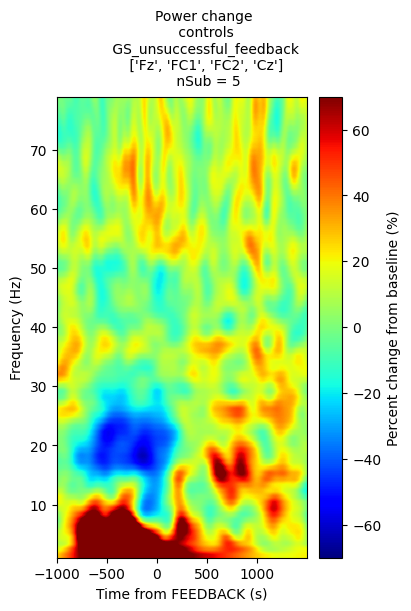

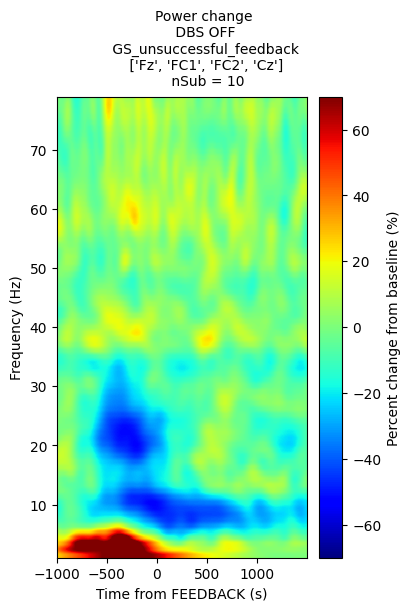

In [32]:
epochs_cond = [
    # 'GF_successful_response'
    # 'GC_successful_response',
    # 'GS_unsuccessful_response',
    # 'GO_successful_square',
    # 'GF_successful_square',
    # 'GC_successful_square',
    # 'GS_unsuccessful_square',
    # 'GS_successful_square',
    # 'GC_successful_triangle',
    # 'GS_unsuccessful_triangle',
    # 'GS_successful_triangle',
    'GS_unsuccessful_feedback',
    # 'GS_unsuccessful_feedback',
    # 'GO_successful_feedback',
    # 'GF_successful_feedback'
    ]
# roi = ['Left_STN']


tfr_dict = meta_function_tfr_inter_groups(
    tfr_dict = tfr_dict,
    groups = ['controls', 'DBS OFF'],
    sub_dict_epochs = sub_dict_epochs,
    single_sub = False,
    epochs_cond = epochs_cond,
    roi = ROIs['preSMA'],
    tfr_args = tfr_args,
    tmin_tmax = [-1, 1.5],
    plot_contrast_groups = True,
    plot_contrast_cond_group = False,
    plot_single_condition = True,
    vmin_vmax = vmin_vmax,
    baseline_correction = True,
    baseline_correction_method = baseline_correction_method,
    saving_path = "C:\\Users\\Juliette\\Research\\Projects\\analysis_mSST\\results\\test_meta_function\\EEG",
    save_as='png'
    )

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.7s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]

10
stat_fun(H1): min=-7.355366304435466 max=4.088882622969837
Running initial clustering …
Found 18 clusters


  0%|          | Permuting (exact test) : 0/511 [00:00<?,       ?it/s]

p_values: [0.97851562 1.         0.90429688 1.         1.         1.
 1.         1.         1.         1.         0.00195312 0.9921875
 1.         1.         0.85742188 1.         0.55273438 1.        ]
P_values shape: (18,)

Significant clusters found: 1

Cluster 11: Peak Freq = 9 Hz, Peak Time = 1336.0905371133622 ms, Peak T-Stat = 7.36, Pixel Size = 2500 pixels, P_value = 0.0020
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters excel\cluster_results_DBS OFF_GC_successful_square - GO_successful_square_['Fz', 'Cz'].xlsx
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters csv\cluster_results_DBS OFF_GC_successful_square - GO_successful_square_['Fz', 'Cz'].csv
vmin: -70, vmax: 70


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    2.0s finished
[Parallel(n_jobs=1)]

10
stat_fun(H1): min=-5.457007447525318 max=5.772377173207936
Running initial clustering …
Found 28 clusters


  0%|          | Permuting (exact test) : 0/511 [00:00<?,       ?it/s]

p_values: [1.         1.         1.         1.         1.         0.96679688
 0.88476562 1.         0.84960938 1.         1.         1.
 0.99804688 1.         1.         1.         1.         0.00195312
 1.         1.         0.01367188 1.         1.         1.
 1.         1.         1.         1.        ]
P_values shape: (28,)

Significant clusters found: 2

Cluster 18: Peak Freq = 9 Hz, Peak Time = 1120.0871994227555 ms, Peak T-Stat = 5.46, Pixel Size = 1286 pixels, P_value = 0.0020
Cluster 21: Peak Freq = 23 Hz, Peak Time = 1272.0871994227557 ms, Peak T-Stat = 4.87, Pixel Size = 903 pixels, P_value = 0.0137
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters excel\cluster_results_DBS ON_GC_successful_square - GO_successful_square_['Fz', 'Cz'].xlsx
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters csv\cluster_results_DBS ON_GC_successful_square - GO_successful_square_['Fz', 'Cz'].csv
vmin: -

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.0s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    3.3s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    4.0s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    2.8s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    3.0s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.7s finished


5
stat_fun(H1): min=-8.504743943673397 max=21.478693323167484
Running initial clustering …
Found 34 clusters


  0%|          | Permuting (exact test) : 0/15 [00:00<?,       ?it/s]

p_values: [1.     1.     1.     1.     1.     1.     0.9375 1.     1.     0.3125
 0.9375 1.     1.     0.9375 1.     1.     1.     1.     1.     0.8125
 1.     0.9375 1.     0.0625 0.125  1.     1.     1.     1.     1.
 1.     1.     1.     1.    ]
P_values shape: (34,)
Clusters approaching signifiance: 1

Cluster 24: Peak Freq = 7 Hz, Peak Time = 1379.963074532997 ms, Peak T-Stat = 7.81, Pixel Size = 1099 pixels, P_value = 0.0625

No significant clusters found

Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters excel\cluster_results_controls_GC_successful_square - GO_successful_square_['Fz', 'Cz'].xlsx
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters csv\cluster_results_controls_GC_successful_square - GO_successful_square_['Fz', 'Cz'].csv
vmin: -70, vmax: 70


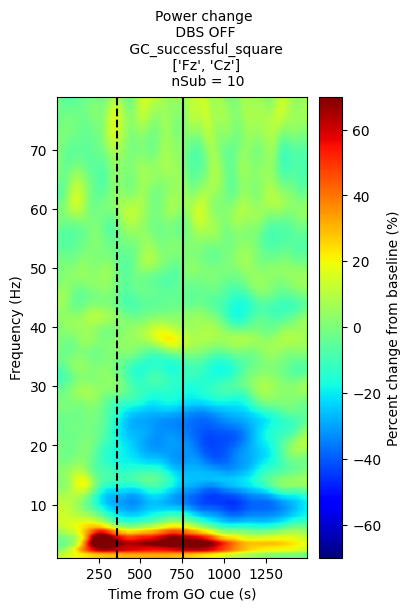

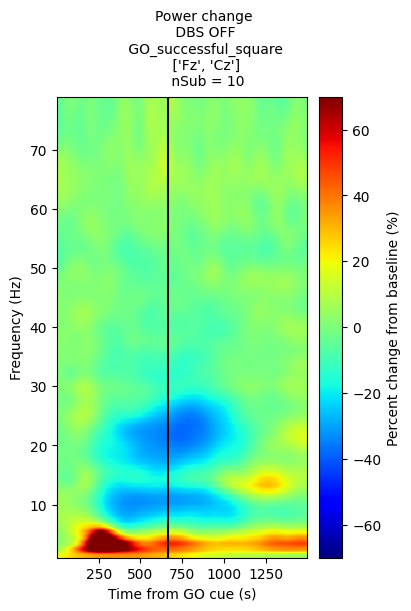

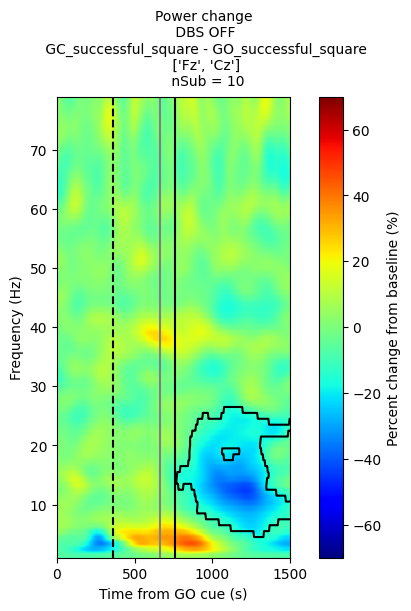

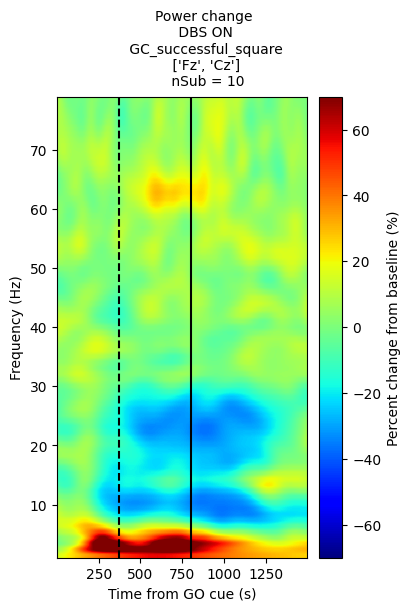

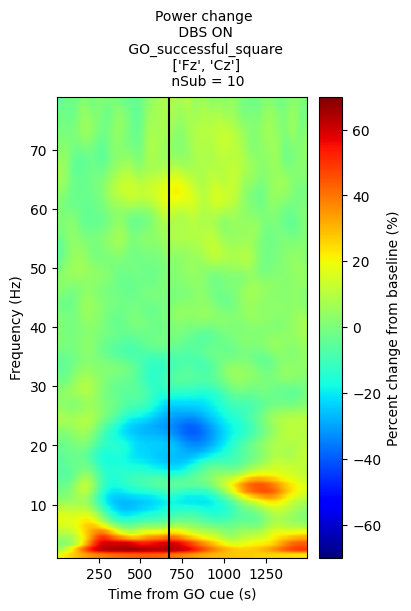

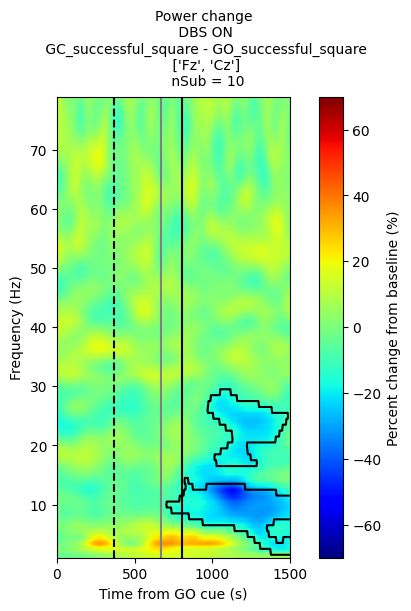

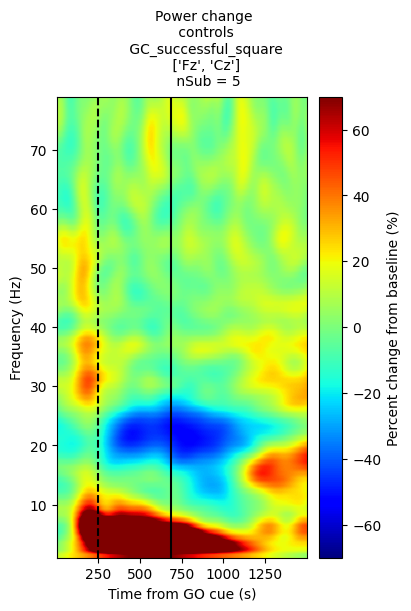

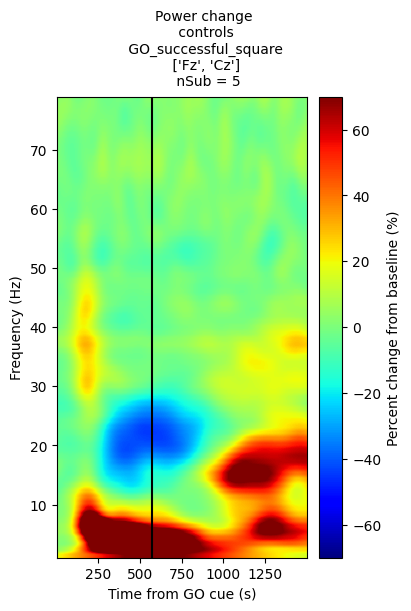

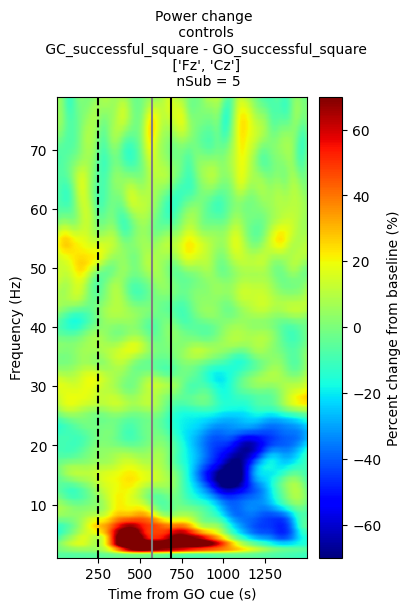

In [9]:
epochs_cond = [
    #'GS_successful_feedback', 
    #'GS_unsuccessful_feedback', 
    # 'GC_successful_response',
    # 'GS_unsuccessful_response',
    # 'GF_successful_square',
    # 'GC_successful_square',
    # 'GS_unsuccessful_square',
    'GC_successful_square',
    'GO_successful_square',
    # 'GC_successful_triangle',
    # 'GS_unsuccessful_triangle',
    # 'GS_successful_triangle',
    # 'GS_successful_feedback',
    # 'GS_unsuccessful_feedback',
    # 'GO_successful_feedback',
    # 'GF_successful_feedback'
    ]
# roi = ['Left_STN']

for sub_group in ['DBS OFF', 'DBS ON', 'controls']:
    tfr_dict = meta_function_tfr_intra_group(
        tfr_dict = tfr_dict,
        sub_group = sub_group,
        sub_dict_epochs = sub_dict_epochs,
        single_sub = False,
        epochs_cond = epochs_cond,
        roi = ROIs['preSMA'],
        tfr_args = tfr_args,
        tmin_tmax = [0, 1.5],
        plot_contrast = True,
        plot_single_condition = True,
        vmin_vmax = vmin_vmax,
        baseline_correction = True,
        baseline_correction_method = baseline_correction_method,
        saving_path = "C:\\Users\\Juliette\\OneDrive\\Images\\images for figures\\poster\\eeg",
        save_as='pdf'
        )

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.0s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.6s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]

10
stat_fun(H1): min=-6.198278287712289 max=4.023327715788322
Running initial clustering …
Found 25 clusters


  0%|          | Permuting (exact test) : 0/511 [00:00<?,       ?it/s]

p_values: [0.85742188 1.         1.         0.99609375 0.98242188 1.
 1.         1.         0.99414062 1.         1.         1.
 1.         0.00195312 1.         1.         1.         1.
 0.99023438 0.84570312 1.         1.         1.         1.
 1.        ]
P_values shape: (25,)

Significant clusters found: 1

Cluster 14: Peak Freq = 27 Hz, Peak Time = 1108.0905371133615 ms, Peak T-Stat = 6.20, Pixel Size = 2585 pixels, P_value = 0.0020
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters excel\cluster_results_DBS OFF_GC_successful_square - GO_successful_square_['F8', 'FC6', 'F4'].xlsx
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters csv\cluster_results_DBS OFF_GC_successful_square - GO_successful_square_['F8', 'FC6', 'F4'].csv
vmin: -70, vmax: 70


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.6s finished
[Parallel(n_jobs=1)]

10
stat_fun(H1): min=-8.972666499884504 max=6.006217297161834
Running initial clustering …
Found 37 clusters


  0%|          | Permuting (exact test) : 0/511 [00:00<?,       ?it/s]

p_values: [0.16601562 1.         1.         0.97265625 0.890625   0.97070312
 1.         1.         1.         1.         1.         0.8671875
 1.         1.         1.         1.         1.         1.
 1.         0.93164062 1.         1.         1.         0.00390625
 0.95703125 1.         0.99804688 1.         0.57226562 1.
 1.         0.99609375 1.         1.         1.         0.97070312
 1.        ]
P_values shape: (37,)

Significant clusters found: 1

Cluster 24: Peak Freq = 9 Hz, Peak Time = 952.0871994227554 ms, Peak T-Stat = 8.97, Pixel Size = 996 pixels, P_value = 0.0039
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters excel\cluster_results_DBS ON_GC_successful_square - GO_successful_square_['F8', 'FC6', 'F4'].xlsx
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters csv\cluster_results_DBS ON_GC_successful_square - GO_successful_square_['F8', 'FC6', 'F4'].csv
vmin: -70, vmax: 70


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    4.9s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.7s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    5.0s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    4.4s finished


5
stat_fun(H1): min=-10.716048532287637 max=11.782611296095187
Running initial clustering …
Found 36 clusters


  0%|          | Permuting (exact test) : 0/15 [00:00<?,       ?it/s]

p_values: [1.     0.75   1.     1.     1.     1.     0.9375 1.     1.     0.6875
 1.     1.     1.     1.     1.     1.     1.     0.0625 1.     1.
 1.     1.     1.     1.     1.     1.     1.     1.     1.     1.
 1.     1.     1.     1.     1.     1.    ]
P_values shape: (36,)
Clusters approaching signifiance: 1

Cluster 18: Peak Freq = 22 Hz, Peak Time = 727.963074532997 ms, Peak T-Stat = 7.29, Pixel Size = 1510 pixels, P_value = 0.0625

No significant clusters found

Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters excel\cluster_results_controls_GC_successful_square - GO_successful_square_['F8', 'FC6', 'F4'].xlsx
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters csv\cluster_results_controls_GC_successful_square - GO_successful_square_['F8', 'FC6', 'F4'].csv
vmin: -70, vmax: 70


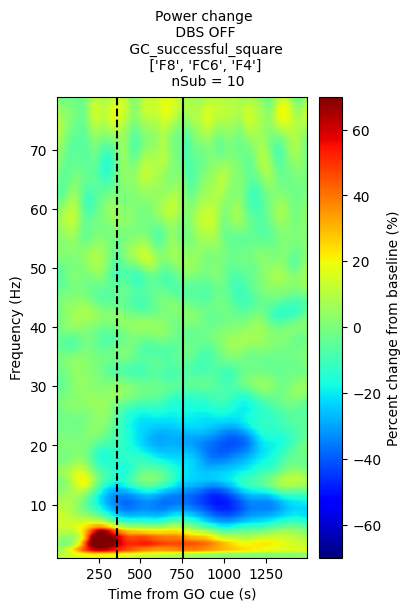

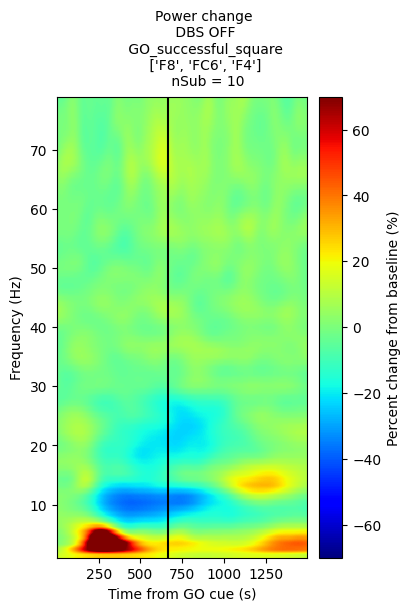

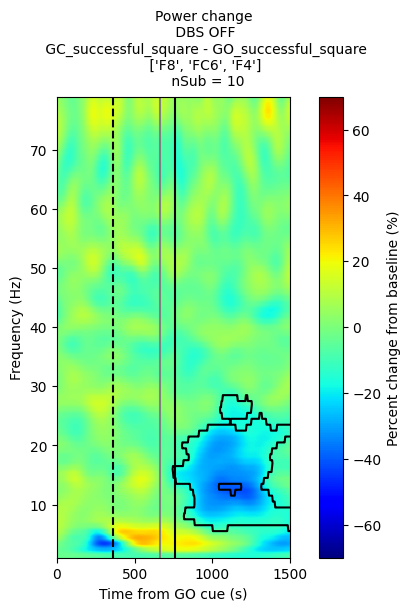

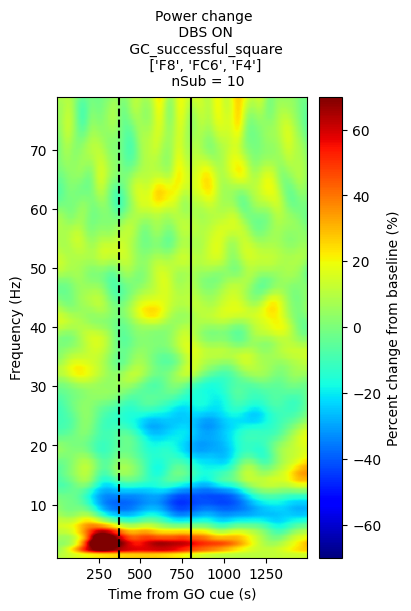

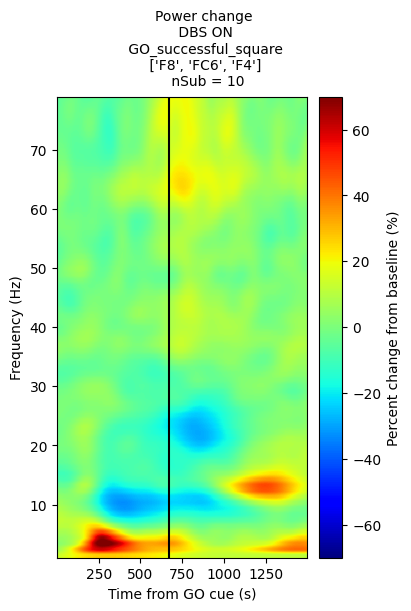

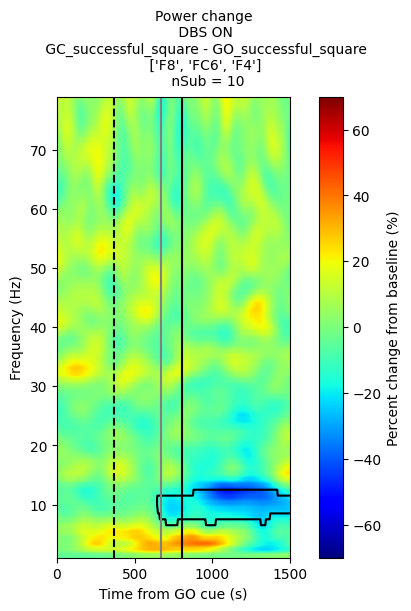

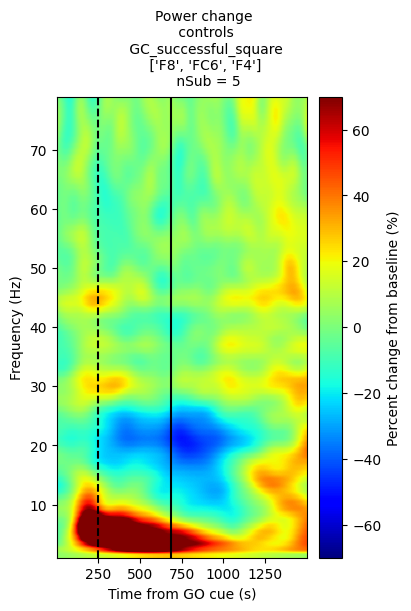

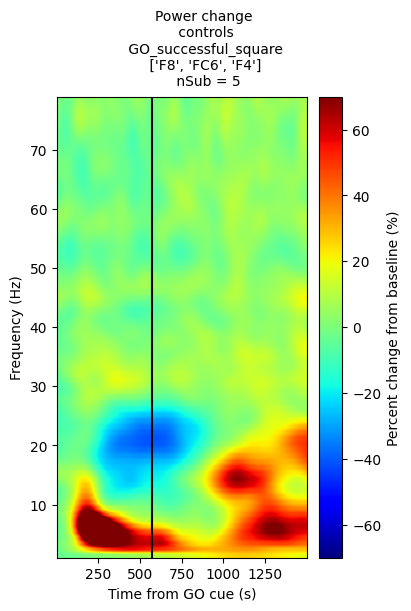

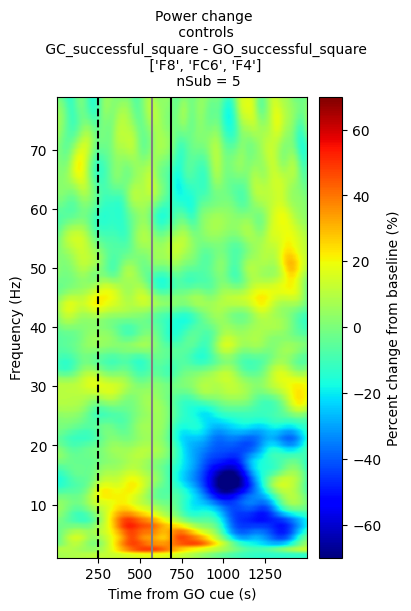

In [10]:
epochs_cond = [
    #'GS_successful_feedback', 
    #'GS_unsuccessful_feedback', 
    # 'GC_successful_response',
    # 'GS_unsuccessful_response',
    # 'GF_successful_square',
    # 'GC_successful_square',
    # 'GS_unsuccessful_square',
    'GC_successful_square',
    'GO_successful_square',
    # 'GC_successful_triangle',
    # 'GS_unsuccessful_triangle',
    # 'GS_successful_triangle',
    # 'GS_successful_feedback',
    # 'GS_unsuccessful_feedback',
    # 'GO_successful_feedback',
    # 'GF_successful_feedback'
    ]
# roi = ['Left_STN']

for sub_group in ['DBS OFF', 'DBS ON', 'controls']:
    tfr_dict = meta_function_tfr_intra_group(
        tfr_dict = tfr_dict,
        sub_group = sub_group,
        sub_dict_epochs = sub_dict_epochs,
        single_sub = False,
        epochs_cond = epochs_cond,
        roi = ROIs['r_IFG'],
        tfr_args = tfr_args,
        tmin_tmax = [0, 1.5],
        plot_contrast = True,
        plot_single_condition = True,
        vmin_vmax = vmin_vmax,
        baseline_correction = True,
        baseline_correction_method = baseline_correction_method,
        saving_path = "C:\\Users\\Juliette\\OneDrive\\Images\\images for figures\\poster\\eeg",
        save_as='pdf'
        )

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]

10
stat_fun(H1): min=-5.430573441631163 max=8.869063248068326
Running initial clustering …
Found 29 clusters


  0%|          | Permuting (exact test) : 0/511 [00:00<?,       ?it/s]

p_values: [1.         0.02148438 0.69921875 1.         1.         0.93945312
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         0.0546875  1.         1.
 0.47851562 1.         1.         1.         1.         1.
 1.         1.         0.99804688 1.         1.        ]
P_values shape: (29,)
Clusters approaching signifiance: 1

Cluster 16: Peak Freq = 7 Hz, Peak Time = 1488.0905371133624 ms, Peak T-Stat = 4.70, Pixel Size = 678 pixels, P_value = 0.0547

Significant clusters found: 1

Cluster 16: Peak Freq = 7 Hz, Peak Time = 1488.0905371133624 ms, Peak T-Stat = 4.70, Pixel Size = 678 pixels, P_value = 0.0547
Cluster 2: Peak Freq = 34 Hz, Peak Time = 1216.0905371133622 ms, Peak T-Stat = 4.78, Pixel Size = 1053 pixels, P_value = 0.0215
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters excel\cluster_results_DBS OFF_GS_successful_square - lmGO_successful_square_['Fz', 'Cz'].xlsx
Cluster results saved to

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.2s finished
[Parallel(n_jobs=1)]

10
stat_fun(H1): min=-7.60612308522609 max=3.9097914112502177
Running initial clustering …
Found 29 clusters


  0%|          | Permuting (exact test) : 0/511 [00:00<?,       ?it/s]

p_values: [1.         0.99414062 1.         1.         0.7734375  1.
 1.         0.04101562 1.         0.9921875  0.9765625  0.93164062
 1.         1.         1.         1.         0.99609375 1.
 1.         1.         1.         0.23632812 1.         1.
 0.3359375  1.         0.87695312 1.         1.        ]
P_values shape: (29,)

Significant clusters found: 1

Cluster 8: Peak Freq = 6 Hz, Peak Time = 1496.0871994227557 ms, Peak T-Stat = 7.61, Pixel Size = 672 pixels, P_value = 0.0410
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters excel\cluster_results_DBS ON_GS_successful_square - lmGO_successful_square_['Fz', 'Cz'].xlsx
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters csv\cluster_results_DBS ON_GS_successful_square - lmGO_successful_square_['Fz', 'Cz'].csv
vmin: -70, vmax: 70


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.7s finished


5
stat_fun(H1): min=-13.055082248507487 max=9.593470094252037
Running initial clustering …
Found 38 clusters


  0%|          | Permuting (exact test) : 0/15 [00:00<?,       ?it/s]

p_values: [1.     1.     1.     1.     1.     1.     1.     1.     0.875  1.
 1.     1.     1.     1.     1.     1.     0.875  1.     1.     0.4375
 1.     1.     1.     1.     0.5    1.     1.     1.     0.875  1.
 1.     1.     1.     1.     1.     1.     1.     1.    ]
P_values shape: (38,)

No significant clusters found

Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters excel\cluster_results_controls_GS_successful_square - lmGO_successful_square_['Fz', 'Cz'].xlsx
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters csv\cluster_results_controls_GS_successful_square - lmGO_successful_square_['Fz', 'Cz'].csv
vmin: -70, vmax: 70


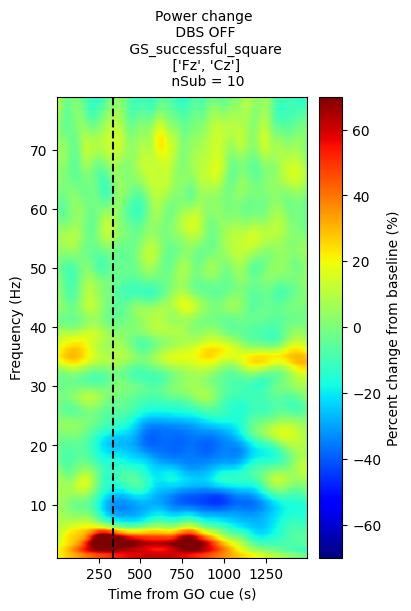

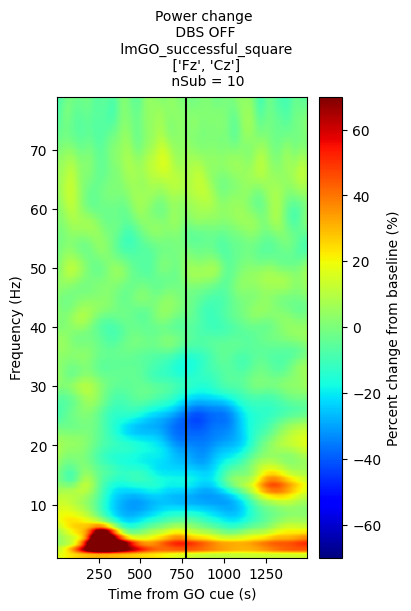

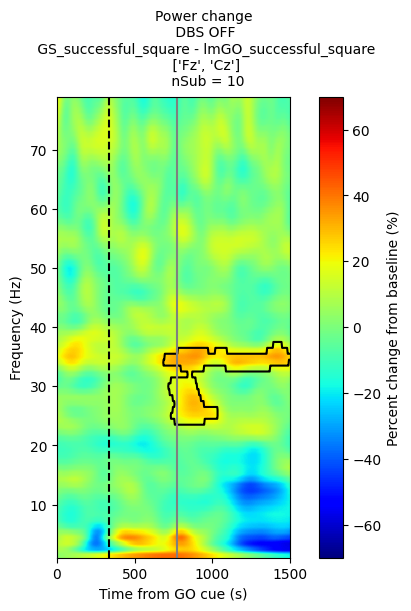

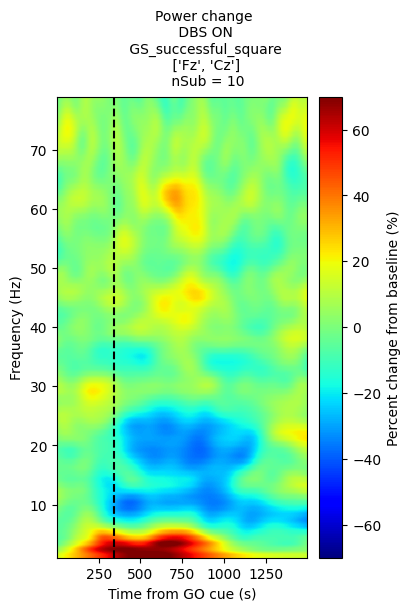

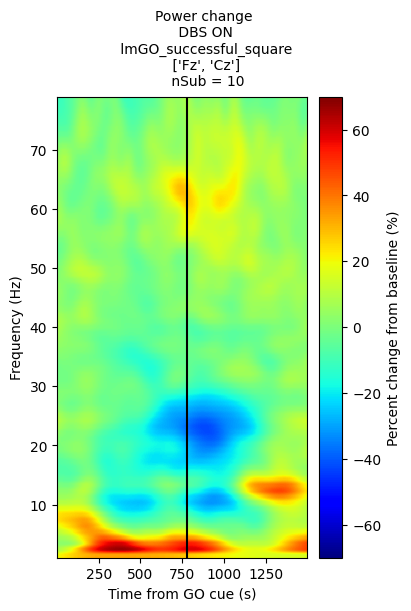

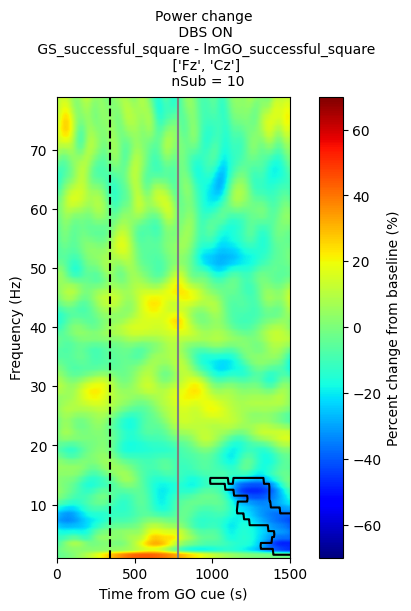

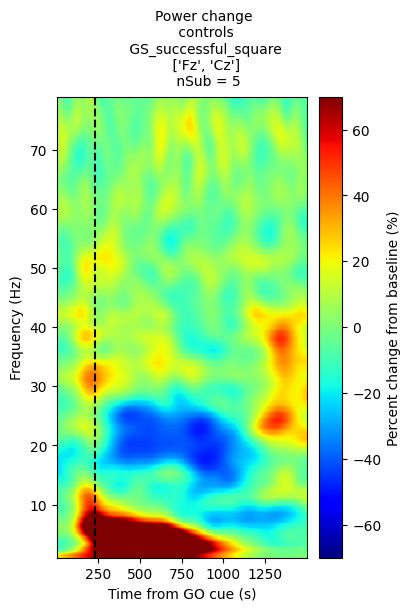

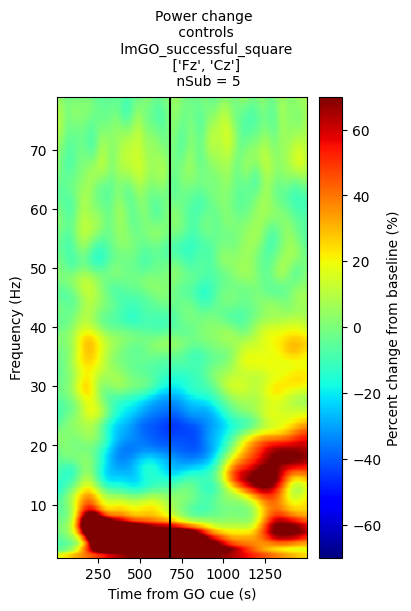

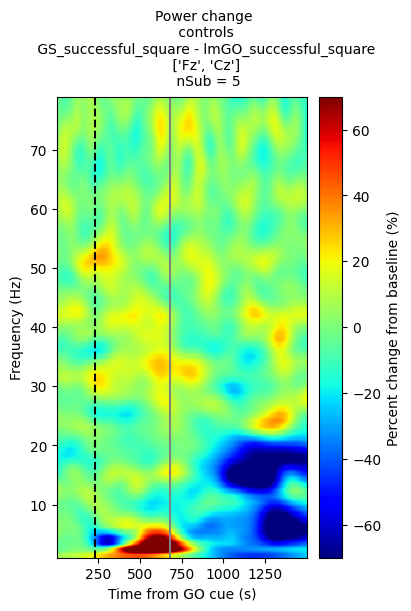

In [17]:
epochs_cond = [
    #'GS_successful_feedback', 
    #'GS_unsuccessful_feedback', 
    # 'GC_successful_response',
    # 'GS_unsuccessful_response',
    # 'GF_successful_square',
    # 'GC_successful_square',
    # 'GS_unsuccessful_square',
    'GS_successful_square',
    'lmGO_successful_square',
    # 'GC_successful_triangle',
    # 'GS_unsuccessful_triangle',
    # 'GS_successful_triangle',
    # 'GS_successful_feedback',
    # 'GS_unsuccessful_feedback',
    # 'GO_successful_feedback',
    # 'GF_successful_feedback'
    ]
# roi = ['Left_STN']

for sub_group in ['DBS OFF', 'DBS ON', 'controls']:
    tfr_dict = meta_function_tfr_intra_group(
        tfr_dict = tfr_dict,
        sub_group = sub_group,
        sub_dict_epochs = sub_dict_epochs,
        single_sub = False,
        epochs_cond = epochs_cond,
        roi = ROIs['preSMA'],
        tfr_args = tfr_args,
        tmin_tmax = [0, 1.5],
        plot_contrast = True,
        plot_single_condition = True,
        vmin_vmax = vmin_vmax,
        baseline_correction = True,
        baseline_correction_method = baseline_correction_method,
        saving_path = "C:\\Users\\Juliette\\OneDrive\\Images\\images for figures\\poster\\eeg",
        save_as='pdf'
        )

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.2s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]

10
stat_fun(H1): min=-7.472050432203401 max=4.422427646437881
Running initial clustering …
Found 32 clusters


  0%|          | Permuting (exact test) : 0/511 [00:00<?,       ?it/s]

p_values: [0.9765625  1.         1.         0.98632812 1.         0.9453125
 1.         1.         1.         1.         0.99609375 0.97265625
 1.         1.         0.03710938 1.         0.02539062 0.57226562
 1.         0.97070312 0.96484375 1.         0.99414062 1.
 1.         1.         1.         1.         1.         0.66210938
 1.         1.        ]
P_values shape: (32,)

Significant clusters found: 2

Cluster 15: Peak Freq = 8 Hz, Peak Time = 1396.0905371133617 ms, Peak T-Stat = 4.34, Pixel Size = 652 pixels, P_value = 0.0371
Cluster 17: Peak Freq = 10 Hz, Peak Time = 924.0905371133623 ms, Peak T-Stat = 7.47, Pixel Size = 741 pixels, P_value = 0.0254
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters excel\cluster_results_DBS OFF_GS_successful_square - lmGO_successful_square_['F8', 'FC6', 'F4'].xlsx
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters csv\cluster_results_DBS OFF_GS_succ

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.0s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.2s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.7s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.2s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.0s finished
[Parallel(n_jobs=1)]

10
stat_fun(H1): min=-5.964717972761642 max=4.614231116670644
Running initial clustering …
Found 25 clusters


  0%|          | Permuting (exact test) : 0/511 [00:00<?,       ?it/s]

p_values: [1.         0.66796875 0.98242188 0.46289062 0.64453125 0.95507812
 1.         1.         0.08203125 0.99609375 1.         0.65820312
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         0.99414062 1.
 1.        ]
P_values shape: (25,)
Clusters approaching signifiance: 1

Cluster 9: Peak Freq = 12 Hz, Peak Time = 1348.0871994227552 ms, Peak T-Stat = 5.96, Pixel Size = 522 pixels, P_value = 0.0820

No significant clusters found

Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters excel\cluster_results_DBS ON_GS_successful_square - lmGO_successful_square_['F8', 'FC6', 'F4'].xlsx
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters csv\cluster_results_DBS ON_GS_successful_square - lmGO_successful_square_['F8', 'FC6', 'F4'].csv
vmin: -70, vmax: 70


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.6s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    3.2s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.4s finished


5
stat_fun(H1): min=-28.802010580273183 max=11.07587665874834
Running initial clustering …
Found 37 clusters


  0%|          | Permuting (exact test) : 0/15 [00:00<?,       ?it/s]

p_values: [1.    1.    1.    1.    1.    1.    1.    1.    1.    1.    1.    0.25
 1.    0.875 1.    1.    0.125 1.    1.    0.625 1.    1.    1.    1.
 0.875 1.    1.    1.    1.    0.875 1.    1.    1.    1.    1.    1.
 1.   ]
P_values shape: (37,)

No significant clusters found

Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters excel\cluster_results_controls_GS_successful_square - lmGO_successful_square_['F8', 'FC6', 'F4'].xlsx
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters csv\cluster_results_controls_GS_successful_square - lmGO_successful_square_['F8', 'FC6', 'F4'].csv
vmin: -70, vmax: 70


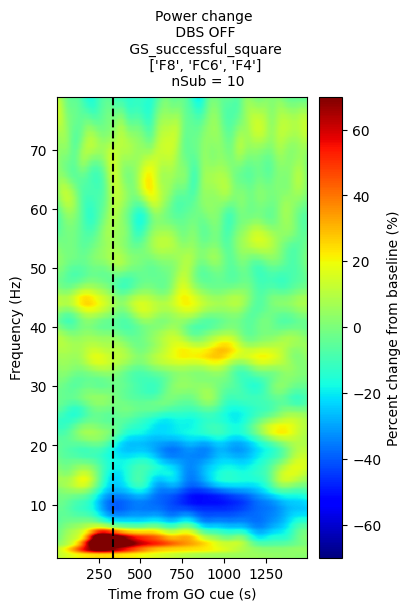

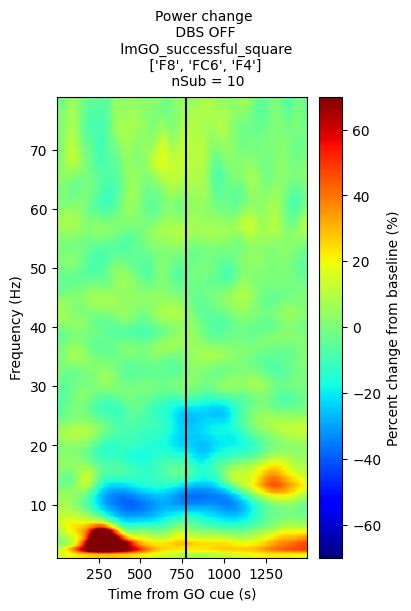

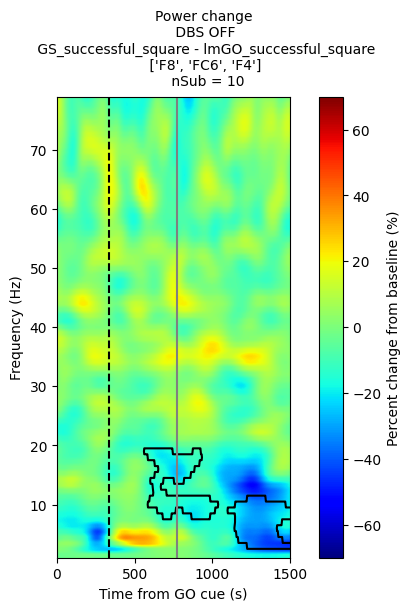

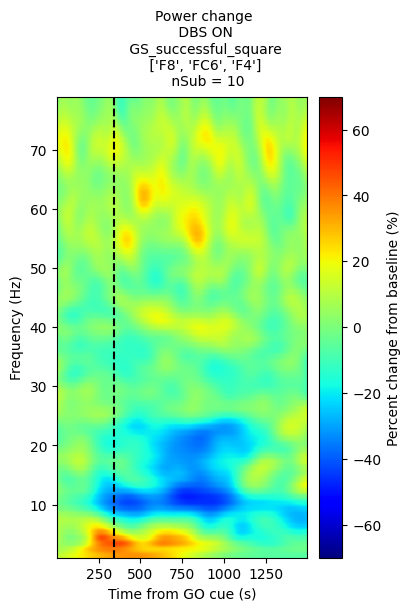

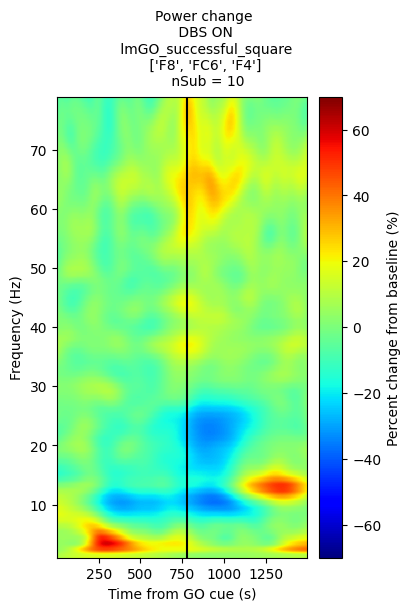

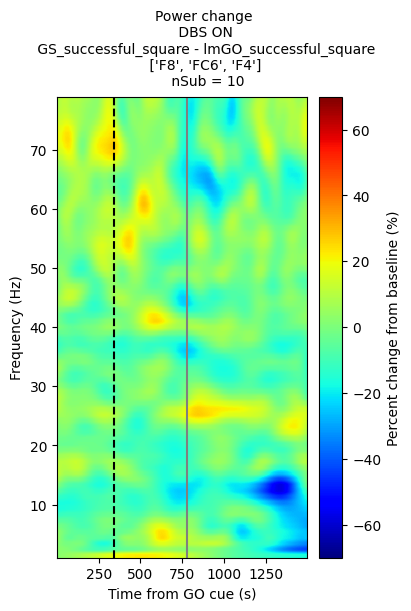

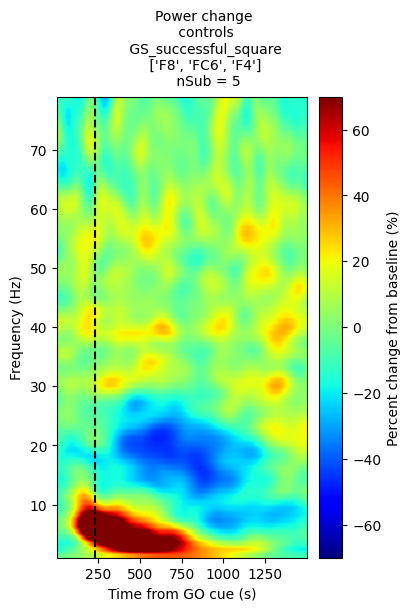

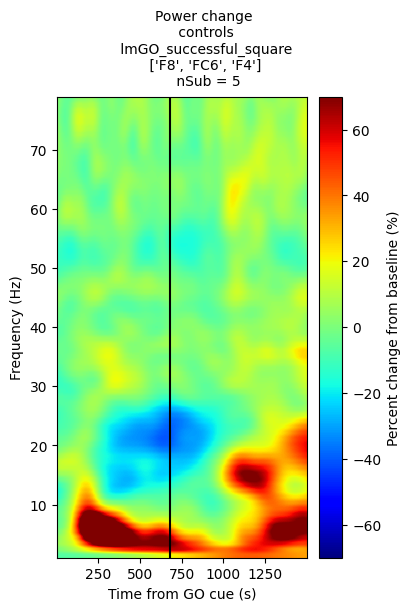

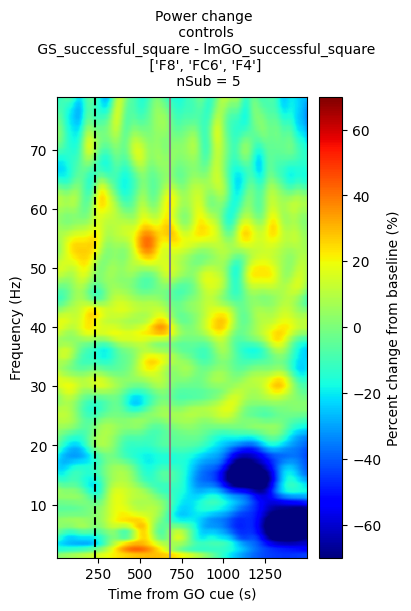

In [18]:
epochs_cond = [
    #'GS_successful_feedback', 
    #'GS_unsuccessful_feedback', 
    # 'GC_successful_response',
    # 'GS_unsuccessful_response',
    # 'GF_successful_square',
    # 'GC_successful_square',
    # 'GS_unsuccessful_square',
    'GS_successful_square',
    'lmGO_successful_square',
    # 'GC_successful_triangle',
    # 'GS_unsuccessful_triangle',
    # 'GS_successful_triangle',
    # 'GS_successful_feedback',
    # 'GS_unsuccessful_feedback',
    # 'GO_successful_feedback',
    # 'GF_successful_feedback'
    ]
# roi = ['Left_STN']

for sub_group in ['DBS OFF', 'DBS ON', 'controls']:
    tfr_dict = meta_function_tfr_intra_group(
        tfr_dict = tfr_dict,
        sub_group = sub_group,
        sub_dict_epochs = sub_dict_epochs,
        single_sub = False,
        epochs_cond = epochs_cond,
        roi = ROIs['r_IFG'],
        tfr_args = tfr_args,
        tmin_tmax = [0, 1.5],
        plot_contrast = True,
        plot_single_condition = True,
        vmin_vmax = vmin_vmax,
        baseline_correction = True,
        baseline_correction_method = baseline_correction_method,
        saving_path = "C:\\Users\\Juliette\\OneDrive\\Images\\images for figures\\poster\\eeg",
        save_as='pdf'
        )

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]

10
stat_fun(H1): min=-3.309574434164701 max=4.152677479822626
Running initial clustering …
Found 23 clusters


  0%|          | Permuting (exact test) : 0/511 [00:00<?,       ?it/s]

p_values: [1.         1.         1.         1.         0.88085938 1.
 1.         1.         1.         1.         1.         1.
 0.96875    1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.        ]
P_values shape: (23,)

No significant clusters found

Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters excel\cluster_results_DBS OFF_GS_successful_triangle - GS_unsuccessful_triangle_['F8', 'FC6', 'F4'].xlsx
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters csv\cluster_results_DBS OFF_GS_successful_triangle - GS_unsuccessful_triangle_['F8', 'FC6', 'F4'].csv
vmin: -70, vmax: 70


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]

10
stat_fun(H1): min=-3.6667696690449874 max=5.360092861180832
Running initial clustering …
Found 35 clusters


  0%|          | Permuting (exact test) : 0/511 [00:00<?,       ?it/s]

p_values: [1.         1.         1.         1.         1.         0.88671875
 1.         1.         1.         1.         1.         0.99414062
 1.         1.         0.94140625 0.98828125 0.99609375 1.
 1.         1.         1.         1.         1.         1.
 1.         1.         0.97265625 1.         1.         1.
 1.         1.         1.         1.         1.        ]
P_values shape: (35,)

No significant clusters found

Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters excel\cluster_results_DBS ON_GS_successful_triangle - GS_unsuccessful_triangle_['F8', 'FC6', 'F4'].xlsx
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters csv\cluster_results_DBS ON_GS_successful_triangle - GS_unsuccessful_triangle_['F8', 'FC6', 'F4'].csv
vmin: -70, vmax: 70


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.0s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.5s finished


5
stat_fun(H1): min=-11.023588924799865 max=17.12641093491408
Running initial clustering …
Found 35 clusters


  0%|          | Permuting (exact test) : 0/15 [00:00<?,       ?it/s]

p_values: [1.     1.     1.     1.     1.     1.     1.     1.     0.9375 1.
 1.     1.     1.     1.     0.9375 1.     1.     1.     1.     1.
 1.     1.     1.     1.     0.125  0.8125 1.     1.     1.     1.
 1.     1.     1.     1.     1.    ]
P_values shape: (35,)

No significant clusters found

Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters excel\cluster_results_controls_GS_successful_triangle - GS_unsuccessful_triangle_['F8', 'FC6', 'F4'].xlsx
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters csv\cluster_results_controls_GS_successful_triangle - GS_unsuccessful_triangle_['F8', 'FC6', 'F4'].csv
vmin: -70, vmax: 70


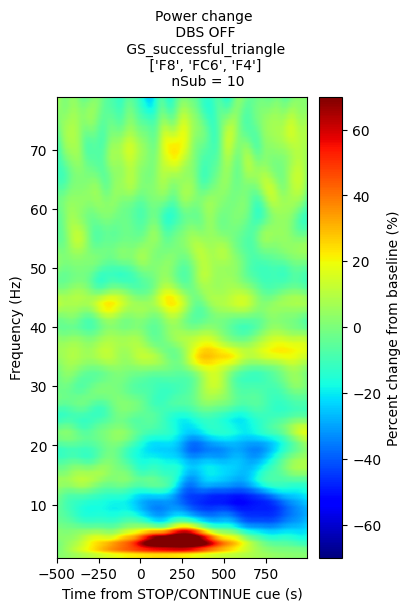

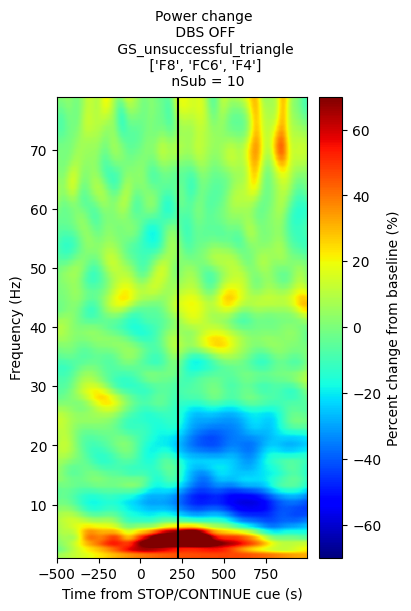

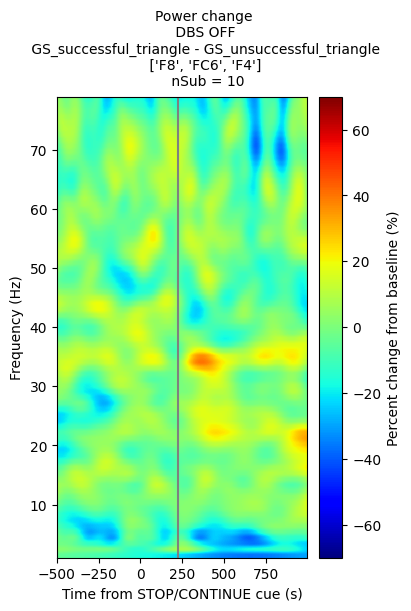

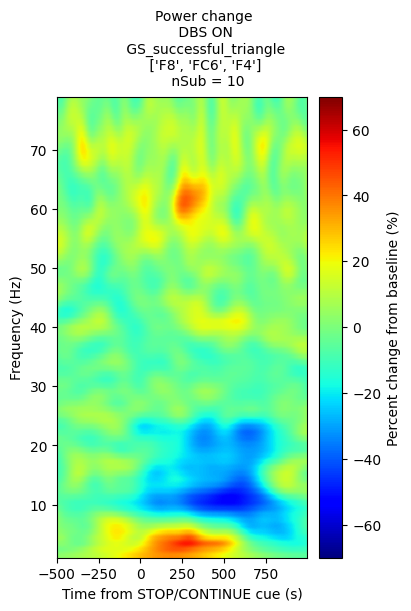

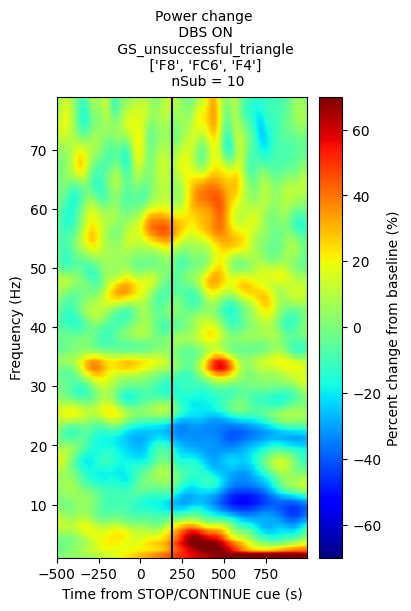

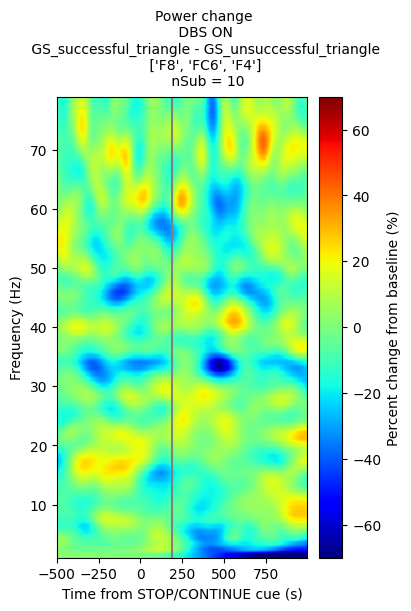

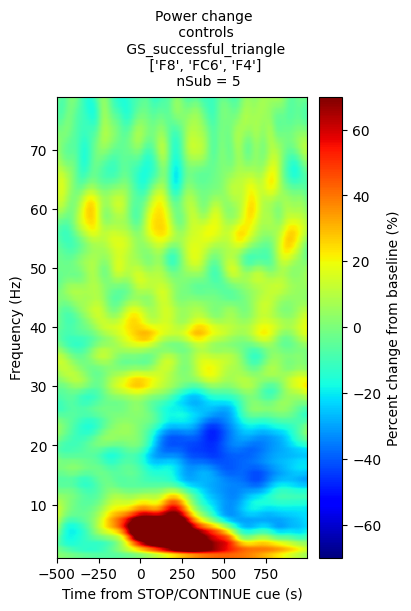

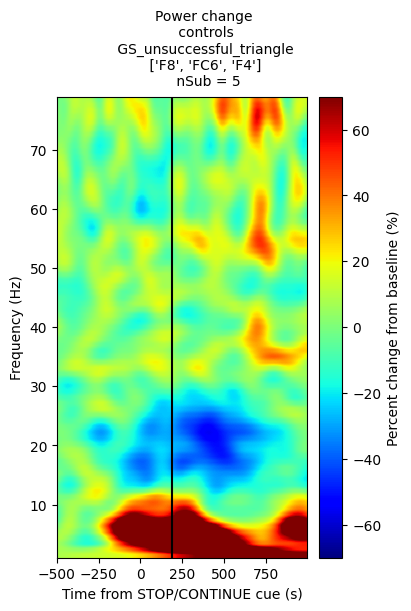

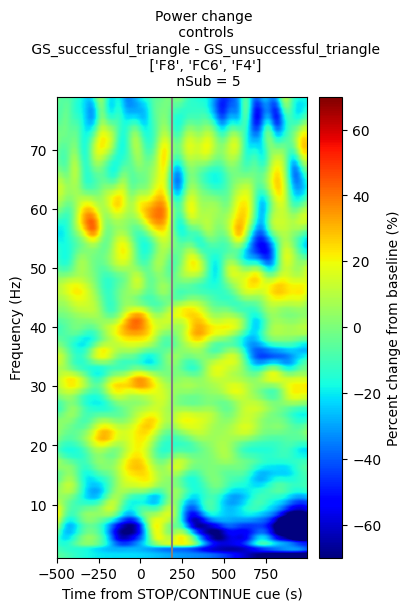

In [20]:
epochs_cond = [
    #'GS_successful_feedback', 
    #'GS_unsuccessful_feedback', 
    # 'GC_successful_response',
    # 'GS_unsuccessful_response',
    # 'GF_successful_square',
    # 'GC_successful_square',
    # 'GS_unsuccessful_square',
    # 'GS_successful_square',
    # 'GS_unsuccessful_square',
    # 'GO_successful_square',
    # 'GC_successful_triangle',
    'GS_successful_triangle',
    'GS_unsuccessful_triangle',
    # 'GS_successful_feedback',
    # 'GS_unsuccessful_feedback',
    # 'GO_successful_feedback',
    # 'GF_successful_feedback'
    ]
# roi = ['Left_STN']

for sub_group in ['DBS OFF', 'DBS ON', 'controls']:
    tfr_dict = meta_function_tfr_intra_group(
        tfr_dict = tfr_dict,
        sub_group = sub_group,
        sub_dict_epochs = sub_dict_epochs,
        single_sub = False,
        epochs_cond = epochs_cond,
        roi = ROIs['r_IFG'],
        tfr_args = tfr_args,
        tmin_tmax = [-0.5, 1],
        plot_contrast = True,
        plot_single_condition = True,
        vmin_vmax = vmin_vmax,
        baseline_correction = True,
        baseline_correction_method = baseline_correction_method,
        saving_path = "C:\\Users\\Juliette\\OneDrive\\Images\\images for figures\\poster\\eeg",
        save_as='pdf'
        )

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]

10
stat_fun(H1): min=-5.095016669944085 max=5.73664931319401
Running initial clustering …
Found 32 clusters


  0%|          | Permuting (exact test) : 0/511 [00:00<?,       ?it/s]

p_values: [0.85546875 0.8046875  0.70898438 0.87890625 1.         0.52734375
 0.99804688 0.01757812 0.49609375 1.         1.         1.
 1.         1.         1.         0.99609375 1.         1.
 1.         0.58789062 1.         1.         1.         0.93945312
 1.         1.         1.         1.         1.         0.86523438
 1.         1.        ]
P_values shape: (32,)

Significant clusters found: 1

Cluster 8: Peak Freq = 35 Hz, Peak Time = 544.0 ms, Peak T-Stat = 5.74, Pixel Size = 792 pixels, P_value = 0.0176
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters excel\cluster_results_DBS OFF_GS_successful_triangle - GS_unsuccessful_triangle_['Fz', 'Cz'].xlsx
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters csv\cluster_results_DBS OFF_GS_successful_triangle - GS_unsuccessful_triangle_['Fz', 'Cz'].csv
vmin: -70, vmax: 70


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]

10
stat_fun(H1): min=-3.452144455103301 max=5.49796760665521
Running initial clustering …
Found 25 clusters


  0%|          | Permuting (exact test) : 0/511 [00:00<?,       ?it/s]

p_values: [1.         1.         1.         1.         0.99023438 1.
 0.00976562 0.98242188 0.91796875 0.92382812 1.         1.
 1.         1.         1.         0.98828125 1.         1.
 1.         0.7578125  1.         1.         1.         1.
 1.        ]
P_values shape: (25,)

Significant clusters found: 1

Cluster 7: Peak Freq = 42 Hz, Peak Time = 548.0 ms, Peak T-Stat = 5.08, Pixel Size = 659 pixels, P_value = 0.0098
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters excel\cluster_results_DBS ON_GS_successful_triangle - GS_unsuccessful_triangle_['Fz', 'Cz'].xlsx
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters csv\cluster_results_DBS ON_GS_successful_triangle - GS_unsuccessful_triangle_['Fz', 'Cz'].csv
vmin: -70, vmax: 70


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s finished


5
stat_fun(H1): min=-21.249849034409173 max=10.114051458974433
Running initial clustering …
Found 38 clusters


  0%|          | Permuting (exact test) : 0/15 [00:00<?,       ?it/s]

p_values: [1.     1.     1.     1.     0.9375 1.     1.     1.     1.     1.
 1.     1.     1.     1.     1.     1.     0.125  1.     1.     1.
 1.     1.     1.     1.     1.     0.1875 1.     0.75   1.     1.
 1.     0.9375 1.     1.     1.     1.     1.     1.    ]
P_values shape: (38,)

No significant clusters found

Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters excel\cluster_results_controls_GS_successful_triangle - GS_unsuccessful_triangle_['Fz', 'Cz'].xlsx
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters csv\cluster_results_controls_GS_successful_triangle - GS_unsuccessful_triangle_['Fz', 'Cz'].csv
vmin: -70, vmax: 70


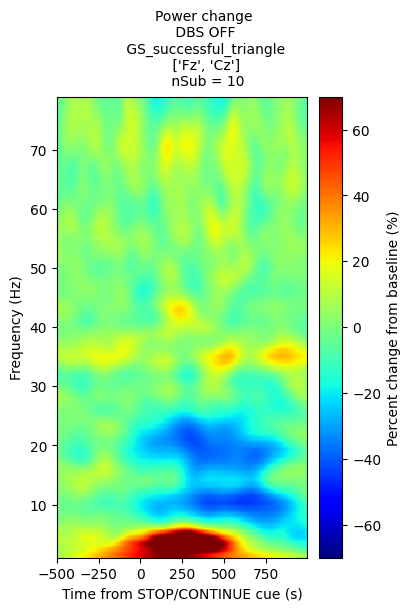

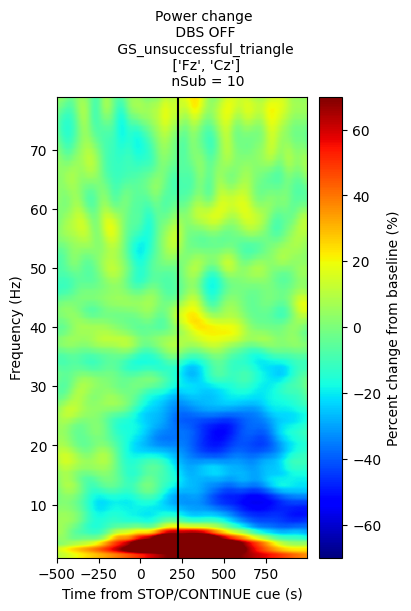

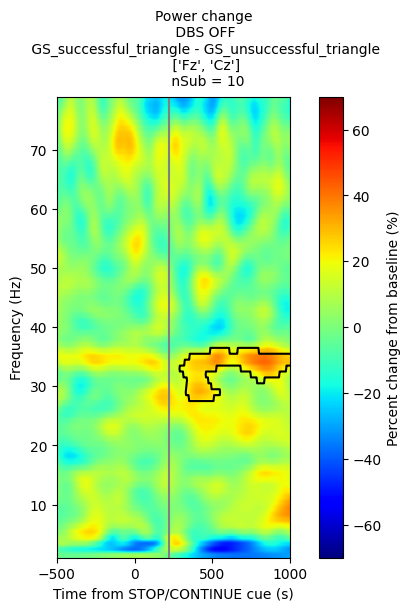

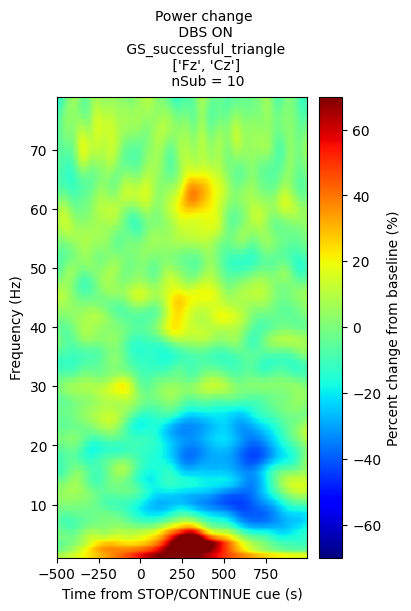

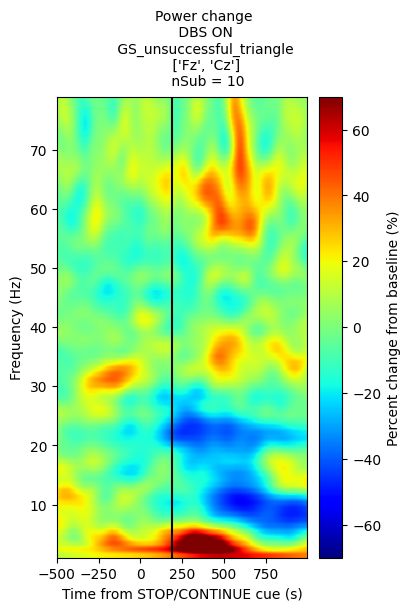

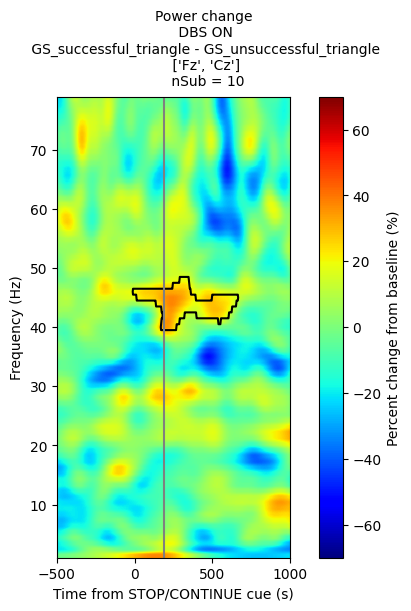

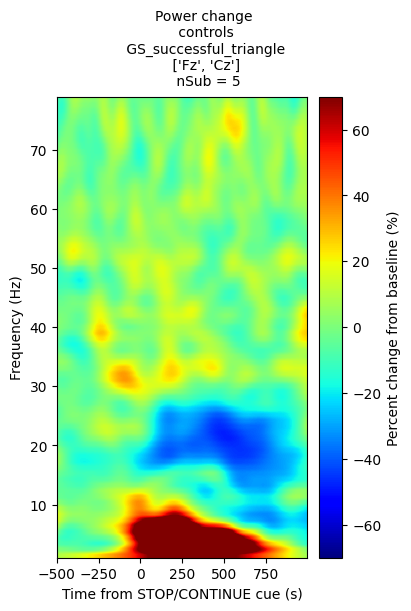

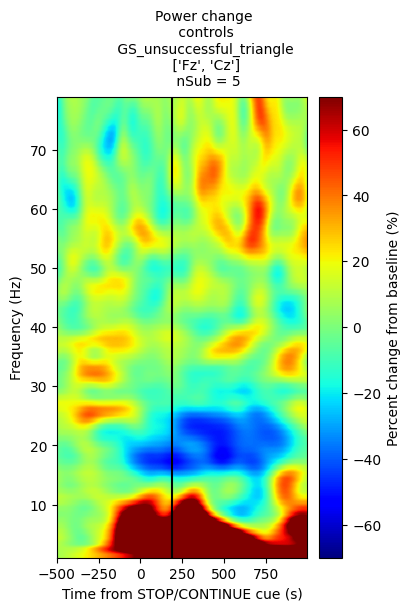

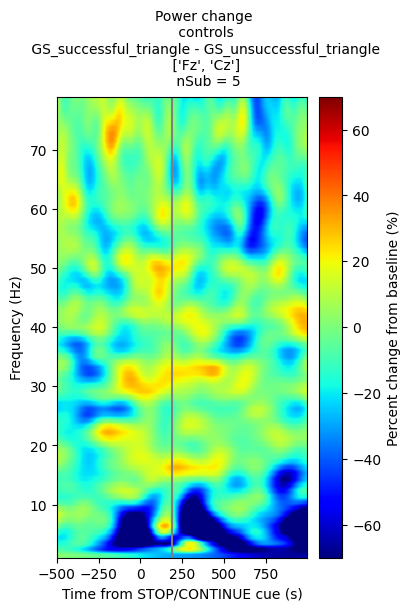

In [21]:
epochs_cond = [
    #'GS_successful_feedback', 
    #'GS_unsuccessful_feedback', 
    # 'GC_successful_response',
    # 'GS_unsuccessful_response',
    # 'GF_successful_square',
    # 'GC_successful_square',
    # 'GS_unsuccessful_square',
    # 'GS_successful_square',
    # 'GS_unsuccessful_square',
    # 'GO_successful_square',
    # 'GC_successful_triangle',
    'GS_successful_triangle',
    'GS_unsuccessful_triangle',
    # 'GS_successful_feedback',
    # 'GS_unsuccessful_feedback',
    # 'GO_successful_feedback',
    # 'GF_successful_feedback'
    ]
# roi = ['Left_STN']

for sub_group in ['DBS OFF', 'DBS ON', 'controls']:
    tfr_dict = meta_function_tfr_intra_group(
        tfr_dict = tfr_dict,
        sub_group = sub_group,
        sub_dict_epochs = sub_dict_epochs,
        single_sub = False,
        epochs_cond = epochs_cond,
        roi = ROIs['preSMA'],
        tfr_args = tfr_args,
        tmin_tmax = [-0.5, 1],
        plot_contrast = True,
        plot_single_condition = True,
        vmin_vmax = vmin_vmax,
        baseline_correction = True,
        baseline_correction_method = baseline_correction_method,
        saving_path = "C:\\Users\\Juliette\\OneDrive\\Images\\images for figures\\poster\\eeg",
        save_as='pdf'
        )

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]

10
stat_fun(H1): min=-7.251104104084883 max=5.02474875213645
Running initial clustering …
Found 17 clusters


  0%|          | Permuting (exact test) : 0/511 [00:00<?,       ?it/s]

p_values: [1.         1.         0.2421875  0.9140625  0.57617188 1.
 1.         1.         1.         0.79492188 1.         1.
 0.95898438 0.99609375 0.984375   0.43359375 0.98632812]
P_values shape: (17,)

No significant clusters found

Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters excel\cluster_results_DBS OFF_GS_successful_triangle - GC_successful_triangle_['Fz', 'Cz'].xlsx
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters csv\cluster_results_DBS OFF_GS_successful_triangle - GC_successful_triangle_['Fz', 'Cz'].csv
vmin: -70, vmax: 70


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]

10
stat_fun(H1): min=-4.677099374263027 max=4.690714816460801
Running initial clustering …
Found 31 clusters


  0%|          | Permuting (exact test) : 0/511 [00:00<?,       ?it/s]

p_values: [1.         1.         0.38085938 1.         1.         0.85351562
 1.         0.890625   1.         0.99609375 1.         0.97265625
 0.99609375 0.55273438 0.9609375  1.         1.         0.99609375
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.        ]
P_values shape: (31,)

No significant clusters found

Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters excel\cluster_results_DBS ON_GS_successful_triangle - GC_successful_triangle_['Fz', 'Cz'].xlsx
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters csv\cluster_results_DBS ON_GS_successful_triangle - GC_successful_triangle_['Fz', 'Cz'].csv
vmin: -70, vmax: 70


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s finished


5
stat_fun(H1): min=-12.271262526344497 max=11.210071686316315
Running initial clustering …
Found 49 clusters


  0%|          | Permuting (exact test) : 0/15 [00:00<?,       ?it/s]

p_values: [1.     1.     1.     1.     1.     1.     1.     1.     1.     1.
 1.     1.     1.     1.     1.     1.     1.     1.     1.     1.
 0.8125 1.     1.     1.     1.     1.     1.     1.     1.     1.
 1.     1.     0.6875 1.     1.     1.     1.     0.5    1.     1.
 1.     1.     1.     1.     1.     1.     1.     1.     1.    ]
P_values shape: (49,)

No significant clusters found

Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters excel\cluster_results_controls_GS_successful_triangle - GC_successful_triangle_['Fz', 'Cz'].xlsx
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters csv\cluster_results_controls_GS_successful_triangle - GC_successful_triangle_['Fz', 'Cz'].csv
vmin: -70, vmax: 70


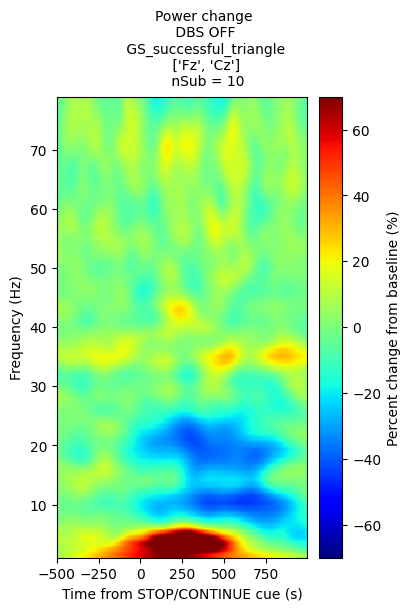

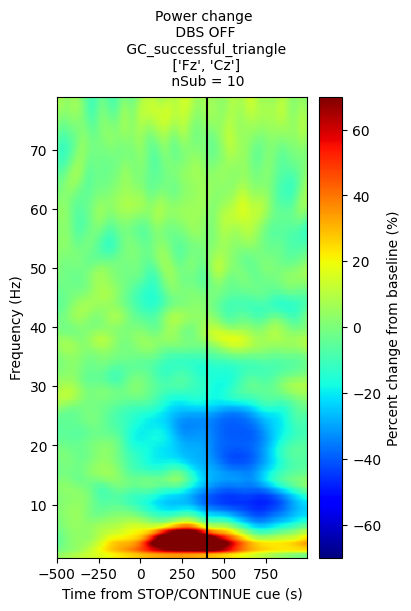

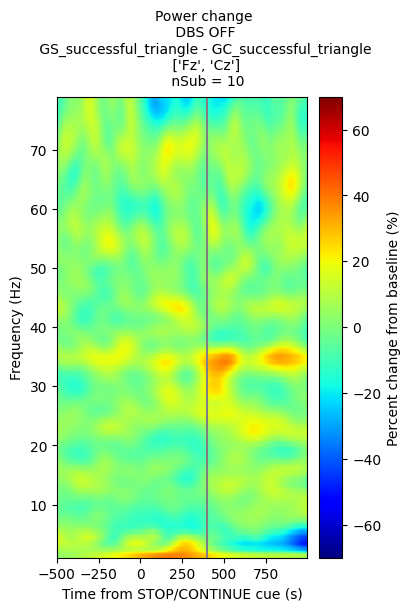

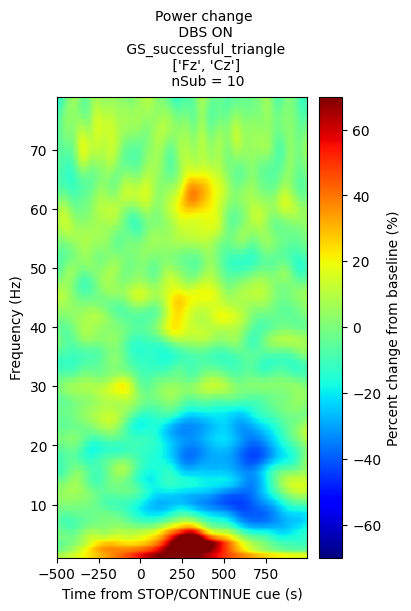

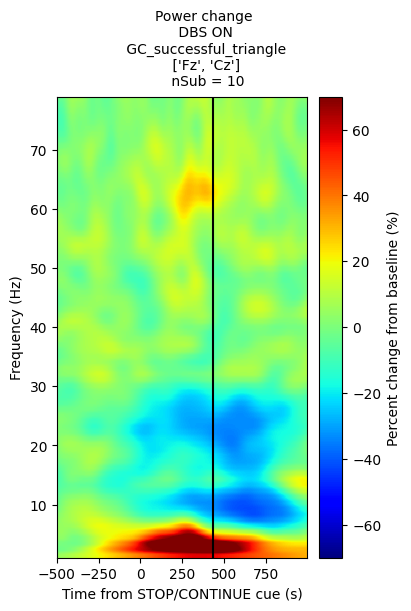

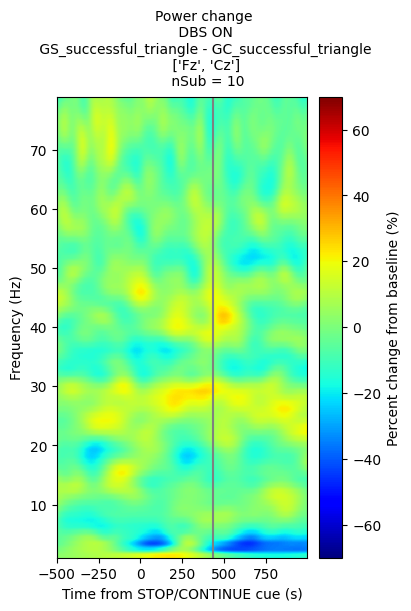

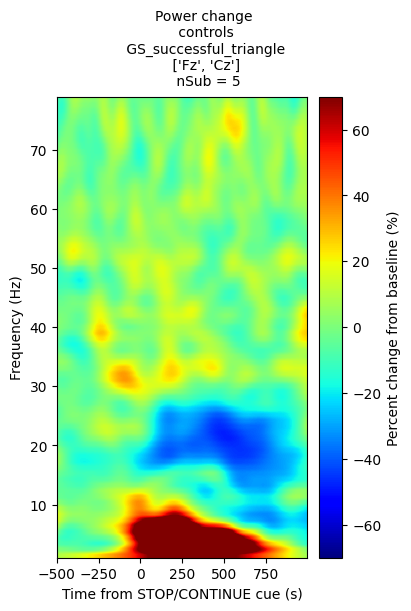

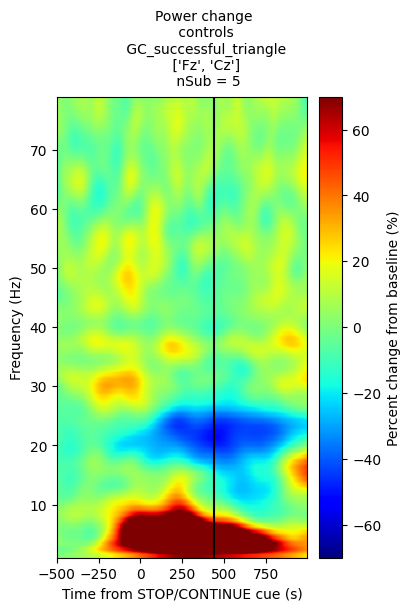

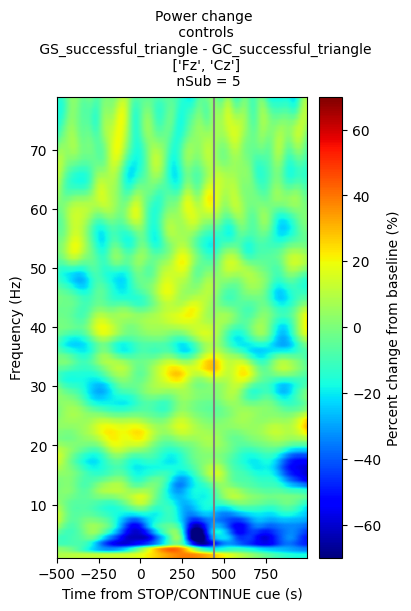

In [28]:
epochs_cond = [
    #'GS_successful_feedback', 
    #'GS_unsuccessful_feedback', 
    # 'GC_successful_response',
    # 'GS_unsuccessful_response',
    # 'GF_successful_square',
    'GS_successful_triangle',
    'GC_successful_triangle',
    # 'GS_unsuccessful_square',
    # 'GS_unsuccessful_square',
    # 'GO_successful_square',
    # 'GC_successful_triangle',
    # 'GS_unsuccessful_triangle',
    # 'GS_successful_triangle',
    # 'GS_successful_feedback',
    # 'GS_unsuccessful_feedback',
    # 'GO_successful_feedback',
    # 'GF_successful_feedback'
    ]
# roi = ['Left_STN']

for sub_group in ['DBS OFF', 'DBS ON', 'controls']:
    tfr_dict = meta_function_tfr_intra_group(
        tfr_dict = tfr_dict,
        sub_group = sub_group,
        sub_dict_epochs = sub_dict_epochs,
        single_sub = False,
        epochs_cond = epochs_cond,
        roi = ROIs['preSMA'],
        tfr_args = tfr_args,
        tmin_tmax = [-0.5, 1],
        plot_contrast = True,
        plot_single_condition = True,
        vmin_vmax = vmin_vmax,
        baseline_correction = True,
        baseline_correction_method = baseline_correction_method,
        saving_path = "C:\\Users\\Juliette\\OneDrive\\Images\\images for figures\\poster\\eeg",
        save_as='pdf'
        )

In [ ]:
epochs_cond = [
    #'GS_successful_feedback', 
    #'GS_unsuccessful_feedback', 
    # 'GC_successful_response',
    # 'GS_unsuccessful_response',
    # 'GS_successful_square',
    # 'GC_successful_square',
    # 'GS_unsuccessful_square',
    # 'GS_unsuccessful_square',
    'GO_successful_square',
    'GF_successful_square',
    # 'GC_successful_triangle',
    # 'GS_unsuccessful_triangle',
    # 'GS_successful_triangle',
    # 'GS_successful_feedback',
    # 'GS_unsuccessful_feedback',
    # 'GO_successful_feedback',
    # 'GF_successful_feedback'
    ]
# roi = ['Left_STN']

for sub_group in ['DBS OFF', 'DBS ON', 'controls']:
    tfr_dict = meta_function_tfr_intra_group(
        tfr_dict = tfr_dict,
        sub_group = sub_group,
        sub_dict_epochs = sub_dict_epochs,
        single_sub = False,
        epochs_cond = epochs_cond,
        roi = ROIs['r_DLPFC'],
        tfr_args = tfr_args,
        tmin_tmax = [0, 1],
        plot_contrast = True,
        plot_single_condition = True,
        vmin_vmax = vmin_vmax,
        baseline_correction = True,
        baseline_correction_method = baseline_correction_method,
        saving_path = "C:\\Users\\Juliette\\OneDrive\\Images\\images for figures\\poster\\eeg",
        save_as='pdf'
        )

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    4.4s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    3.5s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    2.3s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.9s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    2.6s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    2.6s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.9s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.0s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]

10
stat_fun(H1): min=-2.9089764486610563 max=7.493031563076629
Running initial clustering …
Found 16 clusters


  0%|          | Permuting (exact test) : 0/511 [00:00<?,       ?it/s]

p_values: [1.         0.47265625 1.         0.98632812 1.         0.99804688
 1.         1.         1.         1.         1.         0.99804688
 1.         1.         1.         1.        ]
P_values shape: (16,)

No significant clusters found

Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters excel\cluster_results_DBS OFF_GO_successful_square - GF_successful_square_['F4', 'FC2'].xlsx
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters csv\cluster_results_DBS OFF_GO_successful_square - GF_successful_square_['F4', 'FC2'].csv
vmin: -70, vmax: 70


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.7s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    4.1s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.7s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    2.0s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]

10
stat_fun(H1): min=-4.163179159320069 max=5.368213410093815
Running initial clustering …
Found 20 clusters


  0%|          | Permuting (exact test) : 0/511 [00:00<?,       ?it/s]

p_values: [1.         0.99804688 0.07421875 0.97460938 1.         0.59179688
 0.94140625 1.         0.9140625  0.99804688 0.99804688 1.
 0.546875   1.         1.         0.51953125 1.         1.
 1.         1.        ]
P_values shape: (20,)
Clusters approaching signifiance: 1

Cluster 3: Peak Freq = 25 Hz, Peak Time = 540.0871994227554 ms, Peak T-Stat = 5.37, Pixel Size = 385 pixels, P_value = 0.0742

No significant clusters found

Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters excel\cluster_results_DBS ON_GO_successful_square - GF_successful_square_['F4', 'FC2'].xlsx
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters csv\cluster_results_DBS ON_GO_successful_square - GF_successful_square_['F4', 'FC2'].csv
vmin: -70, vmax: 70


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    2.3s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    3.0s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    3.1s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.0s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.7s finished


5
stat_fun(H1): min=-6.429696402769762 max=18.258751947292883
Running initial clustering …
Found 27 clusters


  0%|          | Permuting (exact test) : 0/15 [00:00<?,       ?it/s]

p_values: [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1.]
P_values shape: (27,)

No significant clusters found

Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters excel\cluster_results_controls_GO_successful_square - GF_successful_square_['F4', 'FC2'].xlsx
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters csv\cluster_results_controls_GO_successful_square - GF_successful_square_['F4', 'FC2'].csv
vmin: -70, vmax: 70


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]

10
stat_fun(H1): min=-5.095016669944085 max=7.0976165231700215
Running initial clustering …
Found 28 clusters


  0%|          | Permuting (exact test) : 0/511 [00:00<?,       ?it/s]

p_values: [0.02734375 0.69921875 0.86523438 0.53320312 0.99804688 0.01757812
 0.9765625  1.         1.         1.         1.         1.
 1.         0.99609375 1.         1.         1.         1.
 0.390625   1.         1.         1.         1.         1.
 0.84960938 1.         1.         1.        ]
P_values shape: (28,)

Significant clusters found: 2

Cluster 1: Peak Freq = 8 Hz, Peak Time = 1084.0 ms, Peak T-Stat = 7.10, Pixel Size = 714 pixels, P_value = 0.0273
Cluster 6: Peak Freq = 35 Hz, Peak Time = 544.0 ms, Peak T-Stat = 5.74, Pixel Size = 1011 pixels, P_value = 0.0176
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters excel\cluster_results_DBS OFF_GS_successful_triangle - GS_unsuccessful_triangle_['Fz', 'Cz'].xlsx
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters csv\cluster_results_DBS OFF_GS_successful_triangle - GS_unsuccessful_triangle_['Fz', 'Cz'].csv
vmin: -70, vmax: 70


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]

10
stat_fun(H1): min=-3.572148996419365 max=5.449929172438685
Running initial clustering …
Found 24 clusters


  0%|          | Permuting (exact test) : 0/511 [00:00<?,       ?it/s]

p_values: [1.         1.         1.         0.9453125  0.98828125 1.
 0.01757812 0.95703125 1.         0.97460938 1.         1.
 0.98242188 1.         1.         1.         1.         0.97070312
 1.         0.74804688 1.         1.         1.         1.        ]
P_values shape: (24,)

Significant clusters found: 1

Cluster 7: Peak Freq = 42 Hz, Peak Time = 548.0 ms, Peak T-Stat = 5.08, Pixel Size = 656 pixels, P_value = 0.0176
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters excel\cluster_results_DBS ON_GS_successful_triangle - GS_unsuccessful_triangle_['Fz', 'Cz'].xlsx
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters csv\cluster_results_DBS ON_GS_successful_triangle - GS_unsuccessful_triangle_['Fz', 'Cz'].csv
vmin: -70, vmax: 70


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s finished


5
stat_fun(H1): min=-21.249849034409173 max=10.114051458974433
Running initial clustering …
Found 34 clusters


  0%|          | Permuting (exact test) : 0/15 [00:00<?,       ?it/s]

p_values: [1.     1.     1.     1.     0.8125 1.     1.     1.     1.     1.
 1.     1.     1.     0.0625 1.     1.     1.     1.     1.     0.6875
 1.     1.     1.     1.     0.8125 1.     1.     0.9375 1.     1.
 1.     1.     1.     1.    ]
P_values shape: (34,)
Clusters approaching signifiance: 1

Cluster 14: Peak Freq = 4 Hz, Peak Time = 1072.0 ms, Peak T-Stat = 13.48, Pixel Size = 564 pixels, P_value = 0.0625

No significant clusters found

Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters excel\cluster_results_controls_GS_successful_triangle - GS_unsuccessful_triangle_['Fz', 'Cz'].xlsx
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters csv\cluster_results_controls_GS_successful_triangle - GS_unsuccessful_triangle_['Fz', 'Cz'].csv
vmin: -70, vmax: 70


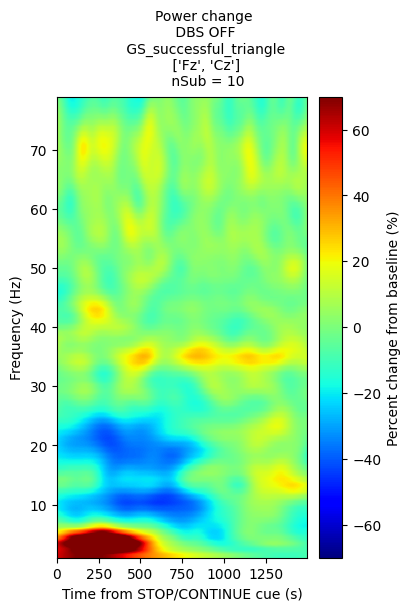

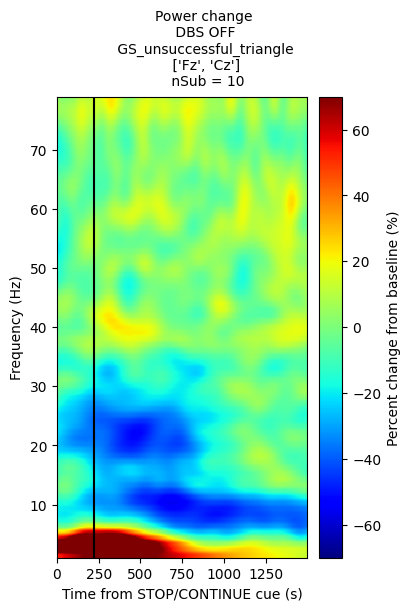

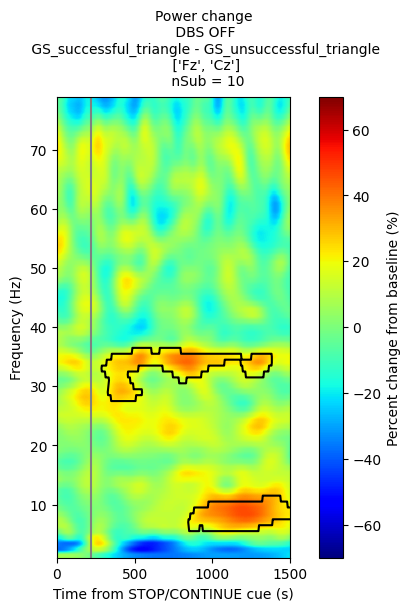

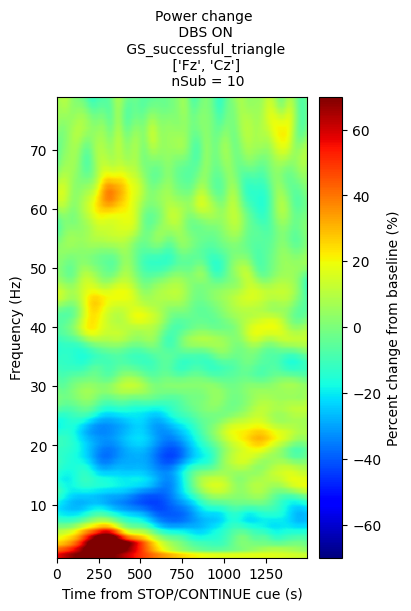

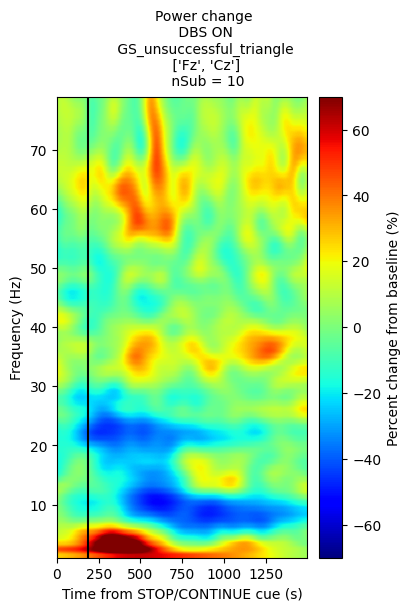

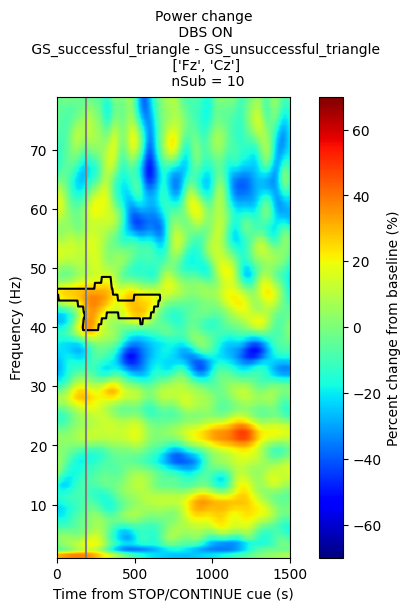

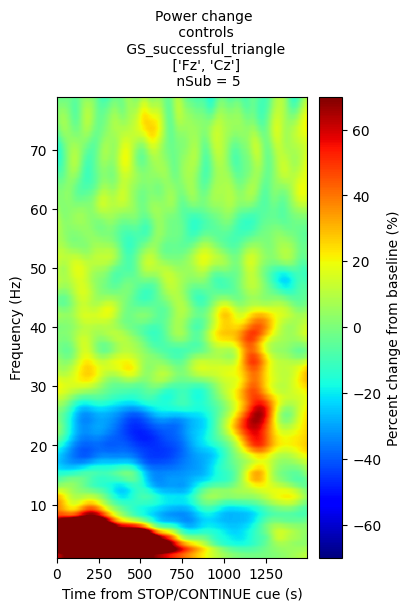

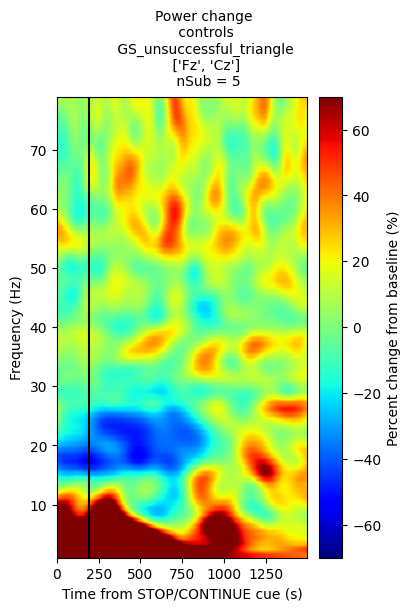

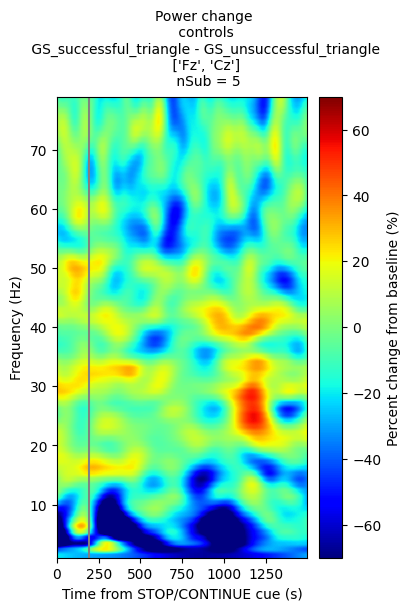

In [39]:
epochs_cond = [
    #'GS_successful_feedback', 
    #'GS_unsuccessful_feedback', 
    # 'GC_successful_response',
    # 'GS_unsuccessful_response',
    # 'GF_successful_square',
    # 'GC_successful_square',
    # 'GS_unsuccessful_square',
    'GS_successful_triangle',
    'GS_unsuccessful_triangle',
    # 'GO_successful_square',
    # 'GC_successful_triangle',
    # 'GS_unsuccessful_triangle',
    # 'GS_successful_triangle',
    # 'GS_successful_feedback',
    # 'GS_unsuccessful_feedback',
    # 'GO_successful_feedback',
    # 'GF_successful_feedback'
    ]
# roi = ['Left_STN']

for sub_group in ['DBS OFF', 'DBS ON', 'controls']:
    tfr_dict = meta_function_tfr_intra_group(
        tfr_dict = tfr_dict,
        sub_group = sub_group,
        sub_dict_epochs = sub_dict_epochs,
        single_sub = False,
        epochs_cond = epochs_cond,
        roi = ROIs['preSMA'],
        tfr_args = tfr_args,
        tmin_tmax = [0, 1.5],
        plot_contrast = True,
        plot_single_condition = True,
        vmin_vmax = vmin_vmax,
        baseline_correction = True,
        baseline_correction_method = baseline_correction_method,
        saving_path = "C:\\Users\\Juliette\\OneDrive\\Images\\images for figures\\poster\\eeg",
        save_as='pdf'
        )

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.0s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]

10
stat_fun(H1): min=-3.6220215780019327 max=6.904715321119599
Running initial clustering …
Found 20 clusters


  0%|          | Permuting (exact test) : 0/511 [00:00<?,       ?it/s]

p_values: [0.0234375  1.         0.99414062 1.         1.         0.890625
 1.         0.99414062 1.         0.99804688 1.         1.
 1.         0.625      1.         0.99804688 1.         1.
 0.99804688 1.        ]
P_values shape: (20,)

Significant clusters found: 1

Cluster 1: Peak Freq = 10 Hz, Peak Time = 1356.0 ms, Peak T-Stat = 6.90, Pixel Size = 574 pixels, P_value = 0.0234
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters excel\cluster_results_DBS OFF_GS_successful_triangle - GS_unsuccessful_triangle_['F8', 'FC6', 'F4'].xlsx
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters csv\cluster_results_DBS OFF_GS_successful_triangle - GS_unsuccessful_triangle_['F8', 'FC6', 'F4'].csv
vmin: -70, vmax: 70


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]

10
stat_fun(H1): min=-3.6667696690449874 max=5.360092861180832
Running initial clustering …
Found 30 clusters


  0%|          | Permuting (exact test) : 0/511 [00:00<?,       ?it/s]

p_values: [1.         1.         1.         0.88476562 1.         1.
 0.9453125  1.         1.         1.         1.         1.
 1.         1.         0.95117188 0.9921875  0.99804688 1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.        ]
P_values shape: (30,)

No significant clusters found

Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters excel\cluster_results_DBS ON_GS_successful_triangle - GS_unsuccessful_triangle_['F8', 'FC6', 'F4'].xlsx
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters csv\cluster_results_DBS ON_GS_successful_triangle - GS_unsuccessful_triangle_['F8', 'FC6', 'F4'].csv
vmin: -70, vmax: 70


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.0s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.2s finished


5
stat_fun(H1): min=-11.023588924799865 max=17.12641093491408
Running initial clustering …
Found 37 clusters


  0%|          | Permuting (exact test) : 0/15 [00:00<?,       ?it/s]

p_values: [1.     1.     1.     1.     1.     1.     1.     1.     1.     1.
 1.     1.     0.875  1.     1.     1.     1.     1.     1.     1.
 1.     0.0625 1.     0.8125 1.     1.     1.     1.     1.     1.
 1.     1.     1.     1.     1.     1.     1.    ]
P_values shape: (37,)
Clusters approaching signifiance: 1

Cluster 22: Peak Freq = 9 Hz, Peak Time = 908.0 ms, Peak T-Stat = 11.02, Pixel Size = 577 pixels, P_value = 0.0625

No significant clusters found

Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters excel\cluster_results_controls_GS_successful_triangle - GS_unsuccessful_triangle_['F8', 'FC6', 'F4'].xlsx
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters csv\cluster_results_controls_GS_successful_triangle - GS_unsuccessful_triangle_['F8', 'FC6', 'F4'].csv
vmin: -70, vmax: 70


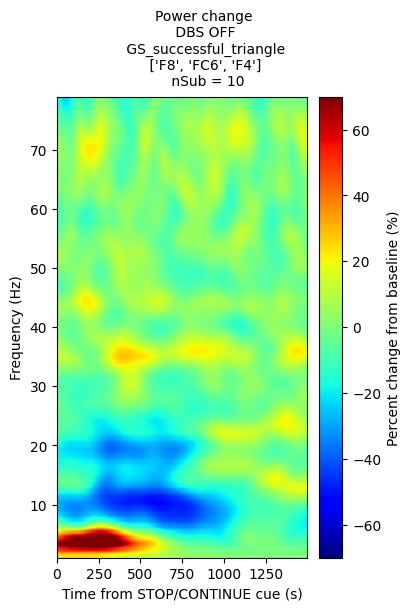

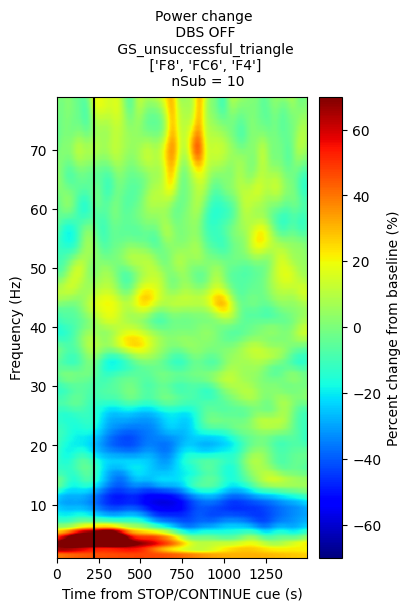

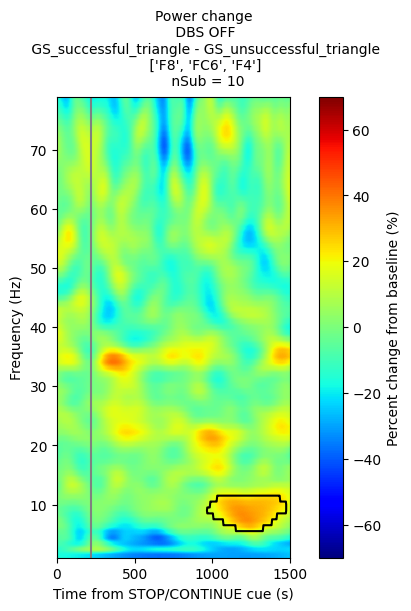

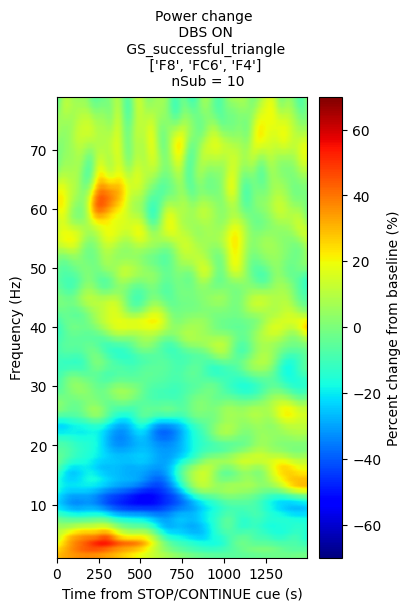

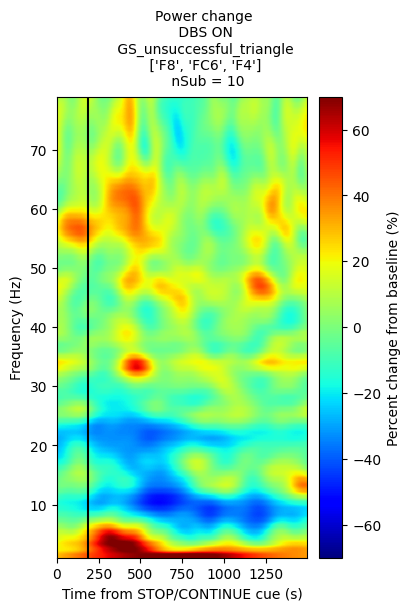

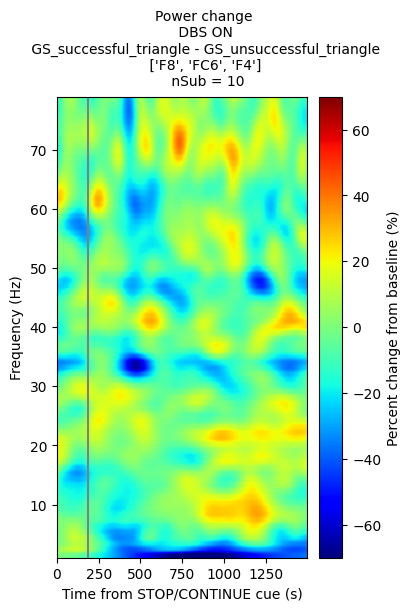

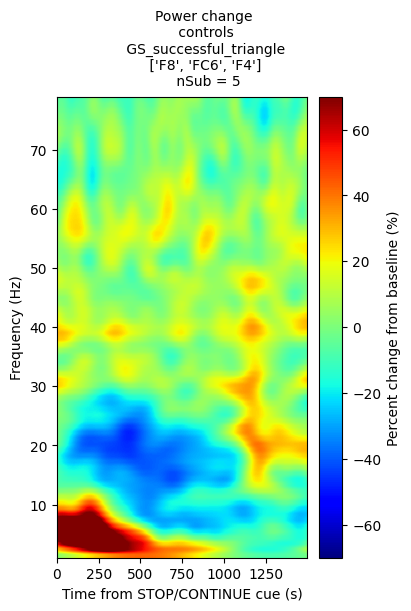

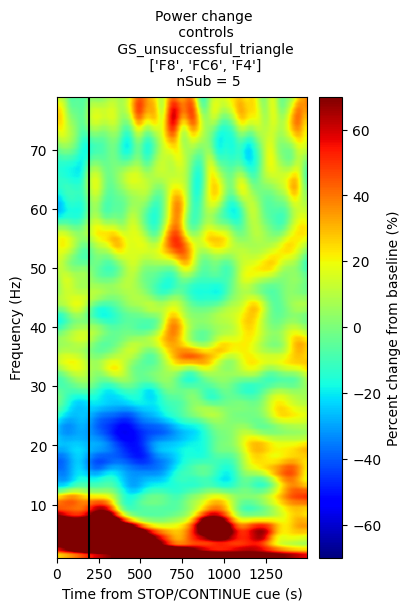

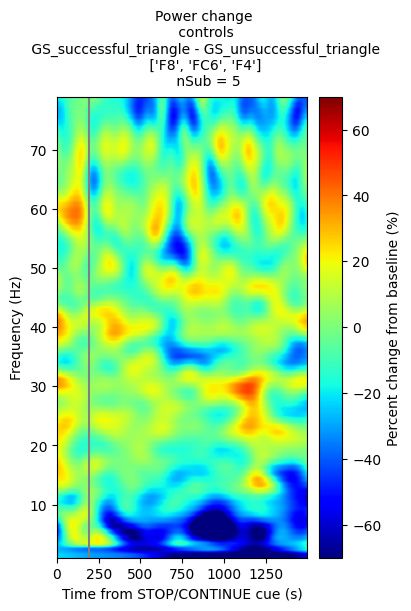

In [41]:
epochs_cond = [
    #'GS_successful_feedback', 
    #'GS_unsuccessful_feedback', 
    # 'GC_successful_response',
    # 'GS_unsuccessful_response',
    # 'GF_successful_square',
    # 'GC_successful_square',
    # 'GS_unsuccessful_square',
    'GS_successful_triangle',
    'GS_unsuccessful_triangle',
    # 'GO_successful_square',
    # 'GC_successful_triangle',
    # 'GS_unsuccessful_triangle',
    # 'GS_successful_triangle',
    # 'GS_successful_feedback',
    # 'GS_unsuccessful_feedback',
    # 'GO_successful_feedback',
    # 'GF_successful_feedback'
    ]
# roi = ['Left_STN']

for sub_group in ['DBS OFF', 'DBS ON', 'controls']:
    tfr_dict = meta_function_tfr_intra_group(
        tfr_dict = tfr_dict,
        sub_group = sub_group,
        sub_dict_epochs = sub_dict_epochs,
        single_sub = False,
        epochs_cond = epochs_cond,
        roi = ROIs['r_IFG'],
        tfr_args = tfr_args,
        tmin_tmax = [0, 1.5],
        plot_contrast = True,
        plot_single_condition = True,
        vmin_vmax = vmin_vmax,
        baseline_correction = True,
        baseline_correction_method = baseline_correction_method,
        saving_path = "C:\\Users\\Juliette\\OneDrive\\Images\\images for figures\\poster\\eeg",
        save_as='pdf'
        )

In [42]:
ROIs

{'preSMA': ['Fz', 'Cz'],
 'r_IFG': ['F8', 'FC6', 'F4'],
 'l_IFG': ['F7', 'FC5', 'F3'],
 'l_M1': ['C3', 'FC5', 'CP1'],
 'r_M1': ['C4', 'FC6', 'CP2'],
 'r_DLPFC': ['F4', 'FC2'],
 'l_DLPFC': ['F3', 'FC1'],
 'occipital': ['O1', 'O2', 'Oz'],
 'central': ['Cz'],
 'C3': ['C3']}

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    3.3s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.8s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.9s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]

10
stat_fun(H1): min=-4.123489555730943 max=6.759356144499898
Running initial clustering …
Found 20 clusters


  0%|          | Permuting (exact test) : 0/511 [00:00<?,       ?it/s]

p_values: [0.93554688 1.         0.12304688 0.984375   1.         1.
 1.         0.99804688 0.953125   0.99414062 1.         0.01757812
 1.         1.         1.         1.         0.8125     1.
 0.796875   1.        ]
P_values shape: (20,)

Significant clusters found: 1

Cluster 12: Peak Freq = 62 Hz, Peak Time = 220.09053711336213 ms, Peak T-Stat = 6.76, Pixel Size = 642 pixels, P_value = 0.0176
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters excel\cluster_results_DBS OFF_GO_successful_square - GF_successful_square_['C3'].xlsx
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters csv\cluster_results_DBS OFF_GO_successful_square - GF_successful_square_['C3'].csv
vmin: -70, vmax: 70


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.2s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.2s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]

10
stat_fun(H1): min=-5.051073633751376 max=6.147574386928814
Running initial clustering …
Found 23 clusters


  0%|          | Permuting (exact test) : 0/511 [00:00<?,       ?it/s]

p_values: [1.         1.         0.96875    0.24804688 1.         1.
 1.         0.14257812 1.         1.         1.         1.
 0.703125   1.         0.328125   1.         1.         0.81445312
 0.234375   1.         1.         0.99023438 1.        ]
P_values shape: (23,)

No significant clusters found

Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters excel\cluster_results_DBS ON_GO_successful_square - GF_successful_square_['C3'].xlsx
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters csv\cluster_results_DBS ON_GO_successful_square - GF_successful_square_['C3'].csv
vmin: -70, vmax: 70


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.7s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished


5
stat_fun(H1): min=-49.29320401991166 max=12.60983622750846
Running initial clustering …
Found 32 clusters


  0%|          | Permuting (exact test) : 0/15 [00:00<?,       ?it/s]

p_values: [1.     1.     0.6875 1.     1.     1.     1.     1.     1.     1.
 1.     1.     1.     1.     1.     1.     1.     1.     0.9375 1.
 1.     0.625  1.     1.     1.     1.     1.     1.     1.     1.
 1.     0.3125]
P_values shape: (32,)

No significant clusters found

Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters excel\cluster_results_controls_GO_successful_square - GF_successful_square_['C3'].xlsx
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters csv\cluster_results_controls_GO_successful_square - GF_successful_square_['C3'].csv
vmin: -70, vmax: 70


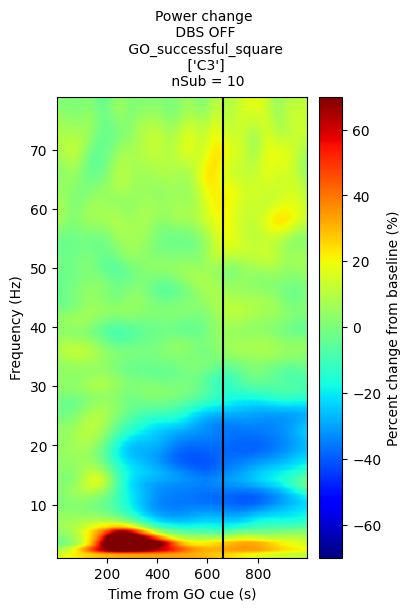

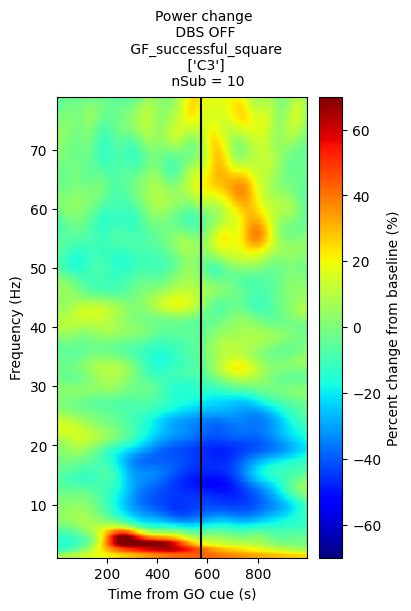

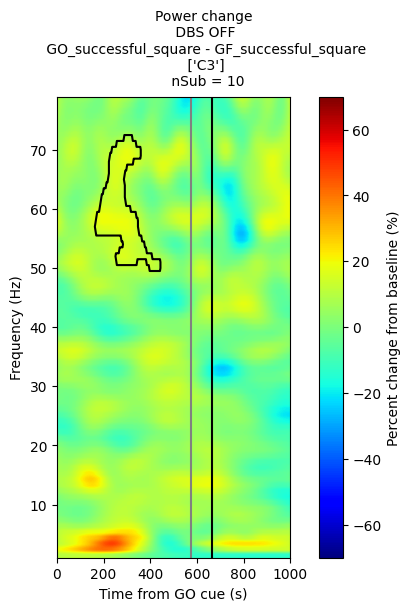

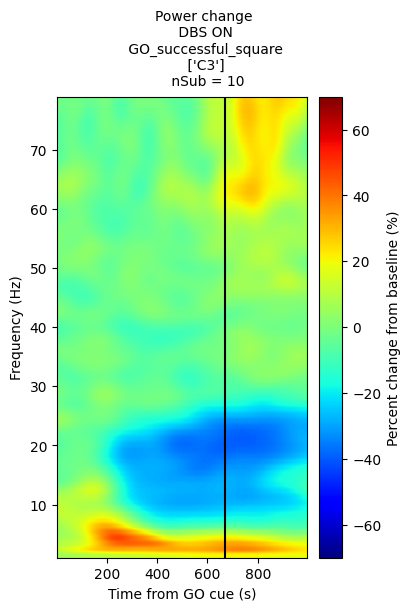

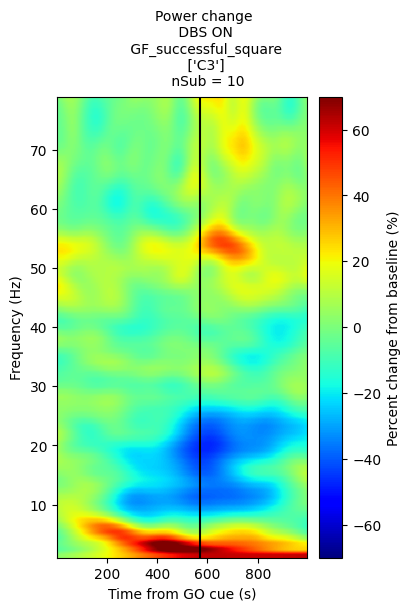

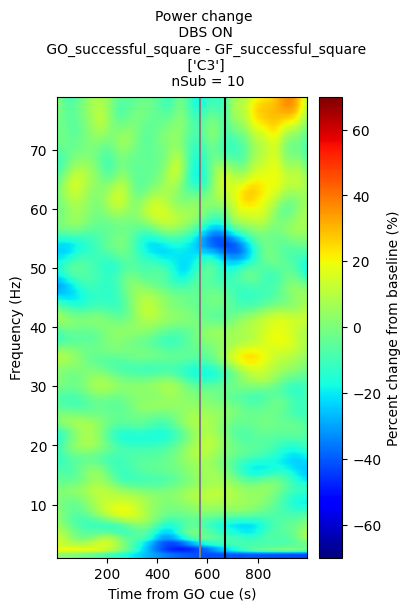

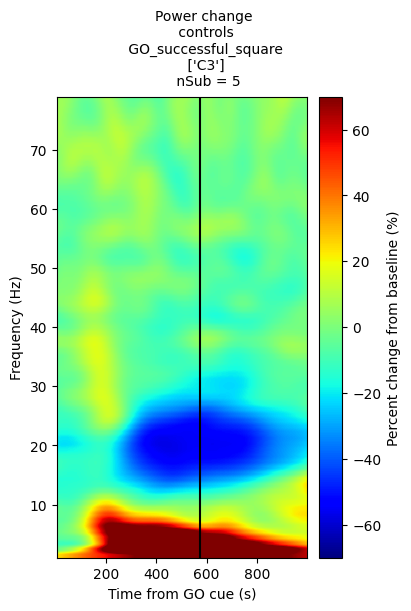

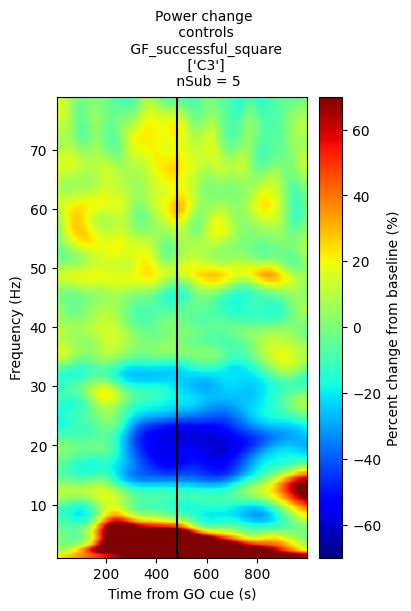

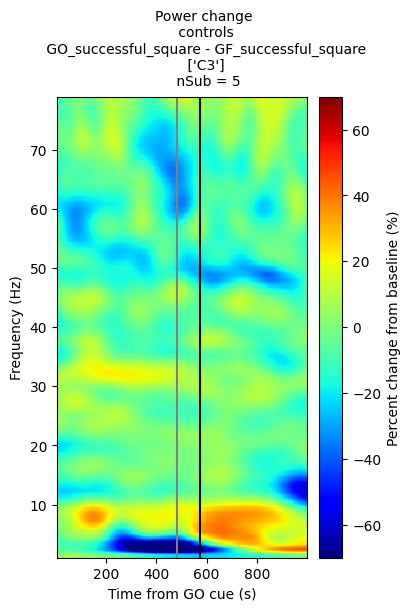

In [43]:
epochs_cond = [
    #'GS_successful_feedback', 
    #'GS_unsuccessful_feedback', 
    # 'GC_successful_response',
    # 'GS_unsuccessful_response',
    # 'GF_successful_square',
    # 'GC_successful_square',
    # 'GS_unsuccessful_square',
    'GO_successful_square',
    'GF_successful_square',
    # 'GO_successful_square',
    # 'GC_successful_triangle',
    # 'GS_unsuccessful_triangle',
    # 'GS_successful_triangle',
    # 'GS_successful_feedback',
    # 'GS_unsuccessful_feedback',
    # 'GO_successful_feedback',
    # 'GF_successful_feedback'
    ]
# roi = ['Left_STN']

for sub_group in ['DBS OFF', 'DBS ON', 'controls']:
    tfr_dict = meta_function_tfr_intra_group(
        tfr_dict = tfr_dict,
        sub_group = sub_group,
        sub_dict_epochs = sub_dict_epochs,
        single_sub = False,
        epochs_cond = epochs_cond,
        roi = ROIs['C3'],
        tfr_args = tfr_args,
        tmin_tmax = [0, 1],
        plot_contrast = True,
        plot_single_condition = True,
        vmin_vmax = vmin_vmax,
        baseline_correction = True,
        baseline_correction_method = baseline_correction_method,
        saving_path = "C:\\Users\\Juliette\\OneDrive\\Images\\images for figures\\poster\\eeg",
        save_as='pdf'
        )

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]

10
stat_fun(H1): min=-3.7316881454930972 max=6.471698762210599
Running initial clustering …
Found 22 clusters


  0%|          | Permuting (exact test) : 0/511 [00:00<?,       ?it/s]

p_values: [1.         0.01367188 0.98046875 0.99804688 1.         1.
 0.97070312 1.         1.         1.         1.         0.83789062
 1.         1.         0.99804688 0.96484375 1.         0.99804688
 1.         0.99804688 0.98046875 1.        ]
P_values shape: (22,)

Significant clusters found: 1

Cluster 2: Peak Freq = 16 Hz, Peak Time = 348.0905371133618 ms, Peak T-Stat = 6.47, Pixel Size = 603 pixels, P_value = 0.0137
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters excel\cluster_results_DBS OFF_GO_successful_square - GF_successful_square_['Cz'].xlsx
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters csv\cluster_results_DBS OFF_GO_successful_square - GF_successful_square_['Cz'].csv
vmin: -70, vmax: 70


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]

10
stat_fun(H1): min=-5.686261269114105 max=4.2182217572703005
Running initial clustering …
Found 23 clusters


  0%|          | Permuting (exact test) : 0/511 [00:00<?,       ?it/s]

p_values: [0.93359375 1.         1.         0.99804688 0.609375   0.95898438
 1.         1.         1.         1.         0.95507812 1.
 1.         0.12304688 1.         0.953125   1.         0.69335938
 0.72070312 0.96484375 1.         1.         1.        ]
P_values shape: (23,)

No significant clusters found

Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters excel\cluster_results_DBS ON_GO_successful_square - GF_successful_square_['Cz'].xlsx
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters csv\cluster_results_DBS ON_GO_successful_square - GF_successful_square_['Cz'].csv
vmin: -70, vmax: 70


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished


5
stat_fun(H1): min=-48.38928054421476 max=5.792746955573243
Running initial clustering …
Found 27 clusters


  0%|          | Permuting (exact test) : 0/15 [00:00<?,       ?it/s]

p_values: [1.     1.     1.     1.     1.     1.     1.     1.     1.     1.
 1.     1.     1.     1.     1.     1.     1.     1.     1.     1.
 1.     1.     1.     1.     0.8125 1.     1.    ]
P_values shape: (27,)

No significant clusters found

Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters excel\cluster_results_controls_GO_successful_square - GF_successful_square_['Cz'].xlsx
Cluster results saved to C:\Users\Juliette\OneDrive\Images\images for figures\poster\eeg\Clusters csv\cluster_results_controls_GO_successful_square - GF_successful_square_['Cz'].csv
vmin: -70, vmax: 70


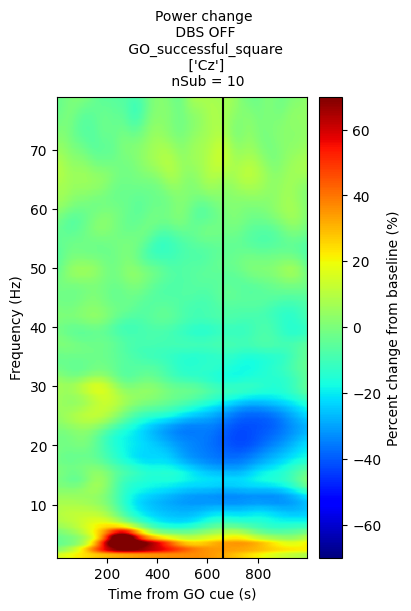

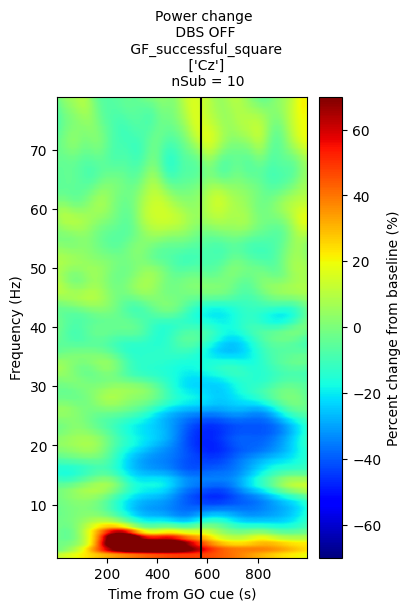

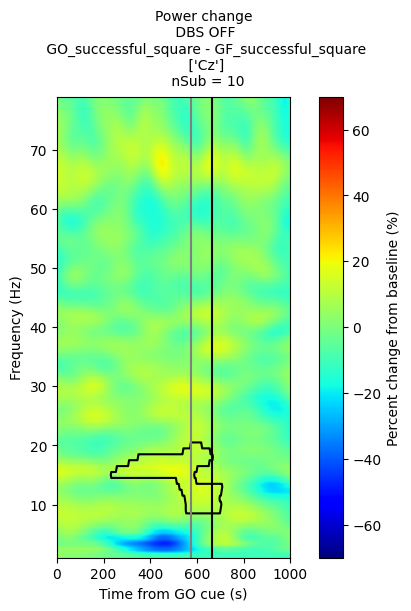

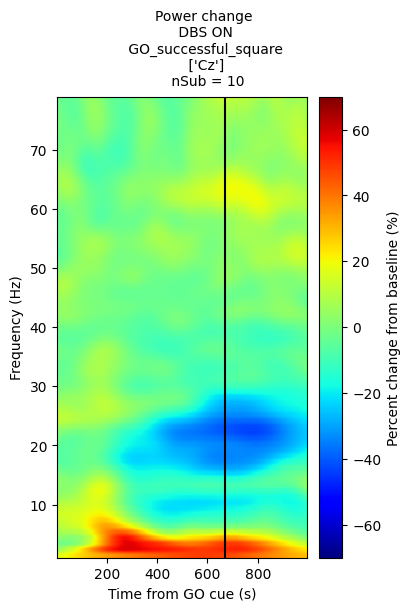

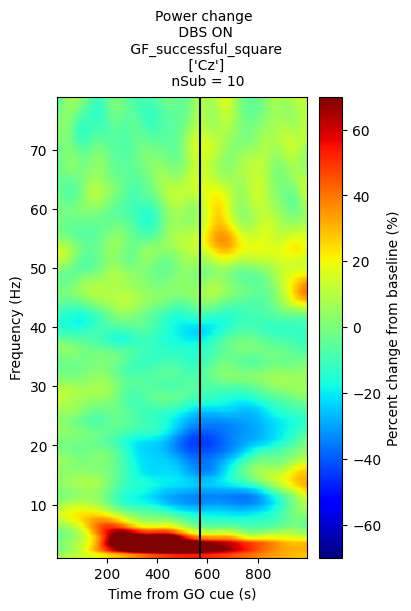

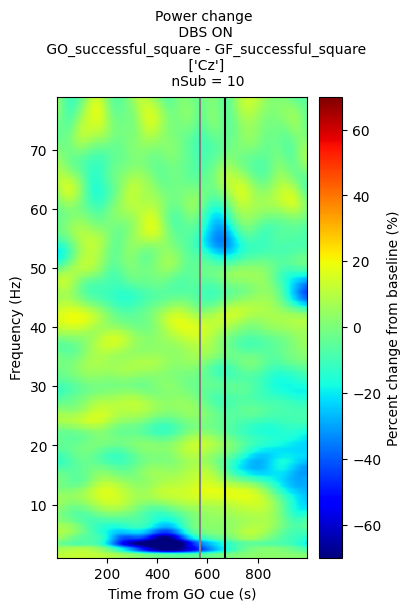

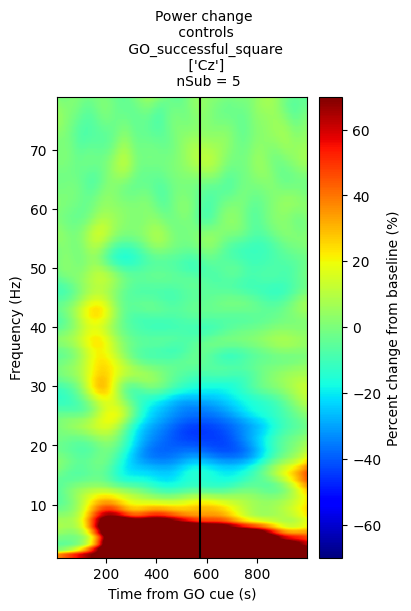

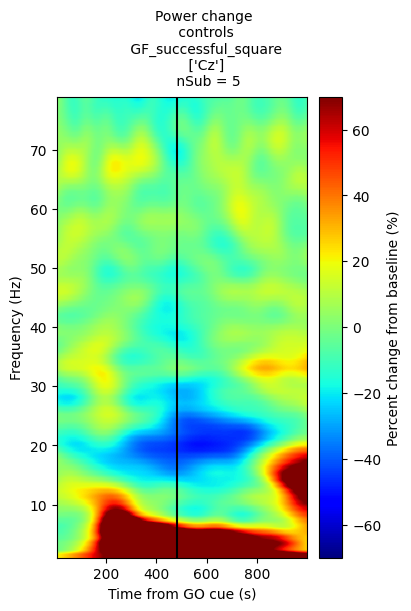

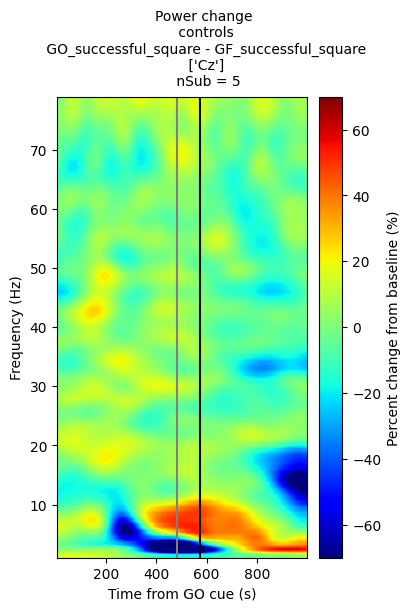

In [44]:
epochs_cond = [
    #'GS_successful_feedback', 
    #'GS_unsuccessful_feedback', 
    # 'GC_successful_response',
    # 'GS_unsuccessful_response',
    # 'GF_successful_square',
    # 'GC_successful_square',
    # 'GS_unsuccessful_square',
    'GO_successful_square',
    'GF_successful_square',
    # 'GO_successful_square',
    # 'GC_successful_triangle',
    # 'GS_unsuccessful_triangle',
    # 'GS_successful_triangle',
    # 'GS_successful_feedback',
    # 'GS_unsuccessful_feedback',
    # 'GO_successful_feedback',
    # 'GF_successful_feedback'
    ]
# roi = ['Left_STN']

for sub_group in ['DBS OFF', 'DBS ON', 'controls']:
    tfr_dict = meta_function_tfr_intra_group(
        tfr_dict = tfr_dict,
        sub_group = sub_group,
        sub_dict_epochs = sub_dict_epochs,
        single_sub = False,
        epochs_cond = epochs_cond,
        roi = ROIs['central'],
        tfr_args = tfr_args,
        tmin_tmax = [0, 1],
        plot_contrast = True,
        plot_single_condition = True,
        vmin_vmax = vmin_vmax,
        baseline_correction = True,
        baseline_correction_method = baseline_correction_method,
        saving_path = "C:\\Users\\Juliette\\OneDrive\\Images\\images for figures\\poster\\eeg",
        save_as='pdf'
        )

In [53]:
# =========================
# FULL ERP PIPELINE – ONE CELL
# =========================

import os
import numpy as np
import matplotlib.pyplot as plt
import mne


# -------------------------------------------------
# ERP decomposition (single subject, single condition)
# -------------------------------------------------
def get_erp_decomposition(
        epochs,
        cond_of_interest,
        ch_names,
        baseline_correction=True,
        tmin_tmax=[-0.2, 0.8]
):
    """
    Returns average ERP for one subject, one condition, one ROI
    """

    # ---- Parse condition ----
    epoch_type, outcome_str, aligned_str = cond_of_interest.split('_')
    outcome = 1.0 if outcome_str == "successful" else 0.0

    # ---- Select epochs ----
    type_mask = epochs.metadata["event"] == epoch_type
    outcome_mask = epochs.metadata["key_resp_experiment.corr"] == outcome
    data = epochs[type_mask & outcome_mask]

    if len(data) == 0:
        return None, None, None, None

    # ---- RT / SSD ----
    rt = np.asarray(data.metadata['key_resp_experiment.rt'])
    mean_rt = np.nanmean(rt) if np.any(~np.isnan(rt)) else None

    ssd = None
    if epoch_type == 'GS':
        ssd = np.asarray(data.metadata['stop_signal_time'])
    elif epoch_type == 'GC':
        ssd = np.asarray(data.metadata['continue_signal_time'])
    mean_ssd = np.nanmean(ssd) if ssd is not None else None

    # ---- Pick channels ----
    data = data.copy().pick(ch_names)

    # ---- ERP data ----
    # shape: (n_epochs, n_channels, n_times)
    X = data.get_data() * 1e6  # V → µV

    # average over channels
    X = np.nanmean(X, axis=1)  # (n_epochs, n_times)

    # average over trials
    erp = np.nanmean(X, axis=0)  # (n_times,)

    times = data.times * 1000  # ms

    # ---- Baseline correction FIRST ----
    if baseline_correction:
        bmask = (times >= -200) & (times <= 0)
        if np.any(bmask):
            baseline = np.nanmean(erp[bmask])
            erp = erp - baseline
        else:
            # fail silently but safely
            erp = erp * np.nan

    # ---- Crop AFTER baseline ----
    tmask = (times >= tmin_tmax[0] * 1000) & (times <= tmin_tmax[1] * 1000)
    erp = erp[tmask]
    times = times[tmask]

    # # ---- Crop ----
    # tmask = (times >= tmin_tmax[0] * 1000) & (times <= tmin_tmax[1] * 1000)
    # erp = erp[tmask]
    # times = times[tmask]

    # # ---- Baseline correction ----
    # if baseline_correction:
    #     bmask = (times >= -200) & (times <= 0)
    #     baseline = np.nanmean(erp[bmask])
    #     erp = erp - baseline

    return erp, times, mean_rt, mean_ssd


# -------------------------------------------------
# ERP plotting (group level)
# -------------------------------------------------
def plot_erp_result(
        group,
        all_erps,
        times,
        epochs_cond,
        roi,
        sub_num,
        saving_path,
        mean_rt_all=None,
        mean_ssd_all=None,
        save_as='png'
):
    """
    all_erps shape: (n_subjects, n_times)
    """

    avg_erp = np.nanmean(all_erps, axis=0)
    sem_erp = np.nanstd(all_erps, axis=0) / np.sqrt(all_erps.shape[0])

    fig, ax = plt.subplots(figsize=(6, 4))
    ax.plot(times, avg_erp, color='black')
    ax.fill_between(
        times,
        avg_erp - sem_erp,
        avg_erp + sem_erp,
        alpha=0.3,
        color='black'
    )

    ax.axvline(0, color='red', linestyle='--')
    ax.axhline(0, color='gray', linestyle=':')

    ax.set_xlabel('Time (ms)')
    ax.set_ylabel('Amplitude (µV)')
    ax.set_title(f"{group} | {epochs_cond} | {roi} | n={sub_num}")

    os.makedirs(saving_path, exist_ok=True)
    fig.savefig(
        os.path.join(
            saving_path,
            f"{group}_{epochs_cond}_{roi}_ERP_nSub{sub_num}.{save_as}"
        ),
        dpi=300,
        bbox_inches='tight'
    )
    plt.close(fig)


# -------------------------------------------------
# META FUNCTION – ERP intra-group
# -------------------------------------------------
def meta_function_erp_intra_group(
        tfr_dict,
        sub_group,
        sub_dict_epochs,
        single_sub,
        epochs_cond,
        roi,
        tmin_tmax,
        plot_single_condition,
        baseline_correction,
        saving_path,
        save_as='png'
):

    if sub_group not in tfr_dict:
        tfr_dict[sub_group] = {}

    for coi in epochs_cond:

        all_erps = []
        subs_included = []
        mean_rt_all = []
        mean_ssd_all = []

        # ✅ EXACT SAME LOGIC AS TFR
        group_key = sub_group if 'DBS' in sub_group else 'C'
        selected_sub_dict_epochs = {
            key: value
            for key, value in sub_dict_epochs.items()
            if group_key in key
        }

        for sub, epochs in selected_sub_dict_epochs.items():

            if single_sub:
                all_erps = []
                sub_num = 1

            erp, times, mean_rt, mean_ssd = get_erp_decomposition(
                epochs=epochs,
                cond_of_interest=coi,
                ch_names=roi,
                baseline_correction=baseline_correction,
                tmin_tmax=tmin_tmax
            )

            if erp is None:
                continue

            all_erps.append(erp)
            subs_included.append(sub)
            mean_rt_all.append(mean_rt)
            mean_ssd_all.append(mean_ssd)

            # ---- single-subject plotting ----
            if single_sub and plot_single_condition:
                plot_erp_result(
                    group=sub_group,
                    all_erps=np.array([erp]),
                    times=times,
                    epochs_cond=coi,
                    roi=roi,
                    sub_num=1,
                    saving_path=saving_path,
                    mean_rt_all=mean_rt,
                    mean_ssd_all=mean_ssd,
                    save_as=save_as
                )

        if len(all_erps) == 0:
            continue

        if not single_sub:
            sub_num = len(subs_included)

            # Ensure equal length (mirrors TFR cropping logic)
            min_len = min(e.shape[0] for e in all_erps)
            all_erps = [e[:min_len] for e in all_erps]
            times = times[:min_len]

            all_erps = np.stack(all_erps, axis=0)

            if plot_single_condition:
                plot_erp_result(
                    group=sub_group,
                    all_erps=all_erps,
                    times=times,
                    epochs_cond=coi,
                    roi=roi,
                    sub_num=sub_num,
                    saving_path=saving_path,
                    mean_rt_all=mean_rt_all,
                    mean_ssd_all=mean_ssd_all,
                    save_as=save_as
                )

        # ---- Store results (TFR-compatible structure) ----
        tfr_dict[sub_group][coi] = {
            'all_erps': all_erps,
            'mean_rt_all': mean_rt_all,
            'mean_ssd_all': mean_ssd_all,
            'times': times
        }

    return tfr_dict


In [56]:
# =========================
# FULL ERP PIPELINE – ONE CELL (WITH COMPARISON PLOT)
# =========================

import os
import numpy as np
import matplotlib.pyplot as plt
import mne


# -------------------------------------------------
# ERP decomposition (single subject, single condition)
# -------------------------------------------------
def get_erp_decomposition(
        epochs,
        cond_of_interest,
        ch_names,
        baseline_correction=True,
        tmin_tmax=[-0.2, 0.8]
):

    epoch_type, outcome_str, aligned_str = cond_of_interest.split('_')
    outcome = 1.0 if outcome_str == "successful" else 0.0

    type_mask = epochs.metadata["event"] == epoch_type
    outcome_mask = epochs.metadata["key_resp_experiment.corr"] == outcome
    data = epochs[type_mask & outcome_mask]

    if len(data) == 0:
        return None, None, None, None

    rt = np.asarray(data.metadata['key_resp_experiment.rt'])
    mean_rt = np.nanmean(rt) if np.any(~np.isnan(rt)) else None

    ssd = None
    if epoch_type == 'GS':
        ssd = np.asarray(data.metadata['stop_signal_time'])
    elif epoch_type == 'GC':
        ssd = np.asarray(data.metadata['continue_signal_time'])
    mean_ssd = np.nanmean(ssd) if ssd is not None else None

    data = data.copy().pick(ch_names)

    X = data.get_data() * 1e6
    X = np.nanmean(X, axis=1)
    erp = np.nanmean(X, axis=0)

    times = data.times * 1000

    if baseline_correction:
        bmask = (times >= -200) & (times <= 0)
        if np.any(bmask):
            erp -= np.nanmean(erp[bmask])
        else:
            erp[:] = np.nan

    tmask = (times >= tmin_tmax[0] * 1000) & (times <= tmin_tmax[1] * 1000)
    return erp[tmask], times[tmask], mean_rt, mean_ssd


# -------------------------------------------------
# Single-condition ERP plot
# -------------------------------------------------
def plot_erp_result(
        group,
        all_erps,
        times,
        epochs_cond,
        roi,
        sub_num,
        saving_path,
        save_as='png'
):

    avg = np.nanmean(all_erps, axis=0)
    sem = np.nanstd(all_erps, axis=0) / np.sqrt(all_erps.shape[0])

    fig, ax = plt.subplots(figsize=(6, 4))
    ax.plot(times, avg, label=epochs_cond)
    ax.fill_between(times, avg - sem, avg + sem, alpha=0.3)

    ax.axvline(0, color='red', linestyle='--')
    ax.axhline(0, color='gray', linestyle=':')
    ax.set_title(f"{group} | {roi} | n={sub_num}")
    ax.set_xlabel("Time (ms)")
    ax.set_ylabel("Amplitude (µV)")
    ax.legend()

    os.makedirs(saving_path, exist_ok=True)
    fig.savefig(
        os.path.join(saving_path, f"{group}_{epochs_cond}_{roi}_ERP.{save_as}"),
        dpi=300,
        bbox_inches='tight'
    )
    plt.close(fig)


# -------------------------------------------------
# NEW: comparison plot (two conditions)
# -------------------------------------------------
def plot_erp_comparison(
        group,
        erp_dict,
        times,
        roi,
        sub_num,
        saving_path,
        save_as='png'
):
    fig, ax = plt.subplots(figsize=(6, 4))

    for cond, all_erps in erp_dict.items():
        avg = np.nanmean(all_erps, axis=0)
        sem = np.nanstd(all_erps, axis=0) / np.sqrt(all_erps.shape[0])

        ax.plot(times, avg, label=cond)
        ax.fill_between(times, avg - sem, avg + sem, alpha=0.25)

    ax.axvline(0, color='red', linestyle='--')
    ax.axhline(0, color='gray', linestyle=':')
    ax.set_title(f"{group} | {roi} | n={sub_num}")
    ax.set_xlabel("Time (ms)")
    ax.set_ylabel("Amplitude (µV)")
    ax.legend()

    os.makedirs(saving_path, exist_ok=True)
    fig.savefig(
        os.path.join(saving_path, f"{group}_ERP_COMPARISON_{roi}.{save_as}"),
        dpi=300,
        bbox_inches='tight'
    )
    plt.close(fig)


# -------------------------------------------------
# META FUNCTION – ERP intra-group
# -------------------------------------------------
def meta_function_erp_intra_group(
        tfr_dict,
        sub_group,
        sub_dict_epochs,
        single_sub,
        epochs_cond,
        roi,
        tmin_tmax,
        plot_single_condition,
        baseline_correction,
        saving_path,
        save_as='png'
):

    if sub_group not in tfr_dict:
        tfr_dict[sub_group] = {}

    comparison_store = {}

    group_key = sub_group if 'DBS' in sub_group else 'C'
    selected_epochs = {
        k: v for k, v in sub_dict_epochs.items() if group_key in k
    }

    for coi in epochs_cond:

        all_erps = []
        subs = []

        for sub, epochs in selected_epochs.items():

            erp, times, _, _ = get_erp_decomposition(
                epochs,
                coi,
                roi,
                baseline_correction,
                tmin_tmax
            )

            if erp is None:
                continue

            all_erps.append(erp)
            subs.append(sub)

        if len(all_erps) == 0:
            continue

        min_len = min(e.shape[0] for e in all_erps)
        all_erps = np.stack([e[:min_len] for e in all_erps])
        times = times[:min_len]

        sub_num = len(subs)

        if plot_single_condition:
            plot_erp_result(
                sub_group,
                all_erps,
                times,
                coi,
                roi,
                sub_num,
                saving_path,
                save_as
            )

        tfr_dict[sub_group][coi] = {
            'all_erps': all_erps,
            'times': times
        }

        comparison_store[coi] = all_erps

    # ---- COMPARISON PLOT (only if exactly 2 conditions) ----
    if len(comparison_store) == 2:
        plot_erp_comparison(
            group=sub_group,
            erp_dict=comparison_store,
            times=times,
            roi=roi,
            sub_num=sub_num,
            saving_path=saving_path,
            save_as=save_as
        )

    return tfr_dict


In [64]:
# =========================
# FULL ERP PIPELINE – ONE CELL (WITH COMPARISON PLOT)
# =========================

import os
import numpy as np
import matplotlib.pyplot as plt
import mne


# ------------------------------
# Single-condition ERP plot (with RT)
# ------------------------------
# ------------------------------
# Single-condition ERP plot (with RT line)
# ------------------------------
def plot_erp_result(
        group,
        all_erps,
        times,
        epochs_cond,
        roi,
        sub_num,
        saving_path,
        mean_rt_all=None,
        save_as='png'
):

    avg = np.nanmean(all_erps, axis=0)
    sem = np.nanstd(all_erps, axis=0) / np.sqrt(all_erps.shape[0])

    fig, ax = plt.subplots(figsize=(6, 4))
    ax.plot(times, avg, label=epochs_cond)
    ax.fill_between(times, avg - sem, avg + sem, alpha=0.3)

    # Event lines
    ax.axvline(0, color='red', linestyle='--', label='Cue')
    
    # Mean RT line
    if mean_rt_all is not None and len(mean_rt_all) > 0:
        mean_rt = np.nanmean(mean_rt_all)
        ax.axvline(mean_rt*1000, color='blue', linestyle='--', label=f'Mean RT ({mean_rt:.1f} ms)')

    ax.axhline(0, color='gray', linestyle=':')

    ax.set_xlabel("Time (ms)")
    ax.set_ylabel("Amplitude (µV)")
    ax.set_title(f"{group} | {epochs_cond} | {roi} | n={sub_num}")
    ax.legend()

    os.makedirs(saving_path, exist_ok=True)
    fig.savefig(
        os.path.join(saving_path, f"{group}_{epochs_cond}_{roi}_ERP.{save_as}"),
        dpi=300,
        bbox_inches='tight'
    )
    plt.close(fig)


# ------------------------------
# Comparison plot (two conditions, with RT lines)
# ------------------------------
def plot_erp_comparison(
        group,
        erp_dict,
        times,
        roi,
        sub_num,
        mean_rt_dict=None,
        saving_path=None,
        save_as='png'
):
    fig, ax = plt.subplots(figsize=(6, 4))

    colors = ['black', 'green']  # adjust for two conditions
    for i, (cond, all_erps) in enumerate(erp_dict.items()):
        avg = np.nanmean(all_erps, axis=0)
        sem = np.nanstd(all_erps, axis=0) / np.sqrt(all_erps.shape[0])

        ax.plot(times, avg, color=colors[i], label=cond)
        ax.fill_between(times, avg - sem, avg + sem, alpha=0.25, color=colors[i])

        # Mean RT line per condition
        if mean_rt_dict is not None and cond in mean_rt_dict and len(mean_rt_dict[cond]) > 0:
            mean_rt = np.nanmean(mean_rt_dict[cond])
            ax.axvline(mean_rt*1000, color=colors[i], linestyle='--', alpha=0.7,
                       label=f'{cond} Mean RT ({mean_rt:.1f} ms)')

    ax.axvline(0, color='red', linestyle='--', label='Cue')
    ax.axhline(0, color='gray', linestyle=':')

    ax.set_xlabel("Time (ms)")
    ax.set_ylabel("Amplitude (µV)")
    ax.set_title(f"{group} | {roi} | n={sub_num}")
    ax.legend()

    os.makedirs(saving_path, exist_ok=True)
    fig.savefig(
        os.path.join(saving_path, f"{group}_ERP_COMPARISON_{roi}.{save_as}"),
        dpi=300,
        bbox_inches='tight'
    )
    plt.close(fig)


def meta_function_erp_intra_group(
        tfr_dict,
        sub_group,
        sub_dict_epochs,
        single_sub,
        epochs_cond,
        roi,
        tmin_tmax,
        plot_single_condition,
        baseline_correction,
        saving_path,
        save_as='png'
):

    if sub_group not in tfr_dict:
        tfr_dict[sub_group] = {}

    comparison_store = {}
    mean_rt_store = {}

    group_key = sub_group if 'DBS' in sub_group else 'C'
    selected_epochs = {
        k: v for k, v in sub_dict_epochs.items() if group_key in k
    }

    for coi in epochs_cond:

        all_erps = []
        subs = []
        mean_rt_all = []

        for sub, epochs in selected_epochs.items():

            erp, times, mean_rt, _ = get_erp_decomposition(
                epochs,
                coi,
                roi,
                baseline_correction,
                tmin_tmax
            )

            if erp is None:
                continue

            all_erps.append(erp)
            subs.append(sub)
            mean_rt_all.append(mean_rt)

        if len(all_erps) == 0:
            continue

        min_len = min(e.shape[0] for e in all_erps)
        all_erps = np.stack([e[:min_len] for e in all_erps])
        times = times[:min_len]

        sub_num = len(subs)

        if plot_single_condition:
            plot_erp_result(
                sub_group,
                all_erps,
                times,
                coi,
                roi,
                sub_num,
                saving_path,
                mean_rt_all=mean_rt_all,
                save_as=save_as
            )

        tfr_dict[sub_group][coi] = {
            'all_erps': all_erps,
            'times': times,
            'mean_rt_all': mean_rt_all
        }

        comparison_store[coi] = all_erps
        mean_rt_store[coi] = mean_rt_all

    # ---- COMPARISON PLOT ----
    if len(comparison_store) == 2:
        plot_erp_comparison(
            group=sub_group,
            erp_dict=comparison_store,
            times=times,
            roi=roi,
            sub_num=sub_num,
            mean_rt_dict=mean_rt_store,
            saving_path=saving_path,
            save_as=save_as
        )

    return tfr_dict


In [65]:
epochs_cond = [
    #'GS_successful_feedback', 
    #'GS_unsuccessful_feedback', 
    # 'GC_successful_response',
    # 'GS_unsuccessful_response',
    # 'GF_successful_square',
    # 'GC_successful_square',
    # 'GS_unsuccessful_square',
    'GO_successful_square',
    'GF_successful_square',
    # 'GO_successful_square',
    # 'GC_successful_triangle',
    # 'GS_unsuccessful_triangle',
    # 'GS_successful_triangle',
    # 'GS_successful_feedback',
    # 'GS_unsuccessful_feedback',
    # 'GO_successful_feedback',
    # 'GF_successful_feedback'
    ]
# roi = ['Left_STN']

for sub_group in ['DBS OFF', 'DBS ON', 'controls']:
    tfr_dict = meta_function_erp_intra_group(
        tfr_dict = tfr_dict,
        sub_group = sub_group,
        sub_dict_epochs = sub_dict_epochs,
        single_sub = False,
        epochs_cond = epochs_cond,
        roi = ROIs['central'],
        tmin_tmax = [0, 1],
        plot_single_condition = True,
        baseline_correction = True,
        saving_path = "C:\\Users\\Juliette\\OneDrive\\Images\\images for figures\\poster\\eeg\\erp",
        save_as='pdf'
        )

In [66]:
epochs_cond = [
    #'GS_successful_feedback', 
    #'GS_unsuccessful_feedback', 
    # 'GC_successful_response',
    # 'GS_unsuccessful_response',
    # 'GF_successful_square',
    'GC_successful_square',
    # 'GS_unsuccessful_square',
    'GO_successful_square',
    # 'GF_successful_square',
    # 'GO_successful_square',
    # 'GC_successful_triangle',
    # 'GS_unsuccessful_triangle',
    # 'GS_successful_triangle',
    # 'GS_successful_feedback',
    # 'GS_unsuccessful_feedback',
    # 'GO_successful_feedback',
    # 'GF_successful_feedback'
    ]
# roi = ['Left_STN']

for sub_group in ['DBS OFF', 'DBS ON', 'controls']:
    tfr_dict = meta_function_erp_intra_group(
        tfr_dict = tfr_dict,
        sub_group = sub_group,
        sub_dict_epochs = sub_dict_epochs,
        single_sub = False,
        epochs_cond = epochs_cond,
        roi = ROIs['central'],
        tmin_tmax = [0, 1],
        plot_single_condition = True,
        baseline_correction = True,
        saving_path = "C:\\Users\\Juliette\\OneDrive\\Images\\images for figures\\poster\\eeg\\erp",
        save_as='pdf'
        )

## 2.2. Plot power changes at the single-subject level at electrode C3 (right motor cortex) ##

### 2.2.1. Plot the mean signal at C3 per trial type ###

In [ ]:
import importlib

In [ ]:
importlib.reload(ephy_plotting)
importlib.reload(utils)
importlib.reload(analysis)

In [ ]:
%matplotlib inline
#  Plot power change for each single subject and each condition/trial type
for sub in sub_nums:
    print(f"Now processing sub: {sub}")
    single_sub_dict_subsets = {key: value for key, value in sub_dict_epochs.items() if sub in key}
    print(single_sub_dict_subsets.keys())
    saving_path_single = os.path.join(results_path, 'single_sub', f'{sub} mSST','eeg_perc_sig_change', freq_wide)
    os.makedirs(saving_path_single, exist_ok=True)  # Create the directory if it doesn't exist

    ## single condition            
    for dbs_status in ['DBS OFF', 'DBS ON']:
        if any(dbs_status in key for key in single_sub_dict_subsets.keys()):
            for cond in [
                #'GO_successful', 
                # #'GO_unsuccessful', 
                #'GF_successful', 
                # #'GF_unsuccessful',
                #'GC_successful', 
                # #'GC_unsuccessful',
                #'GS_successful', 
                #'GS_unsuccessful',
                'stop_successful',
                'stop_unsuccessful',
                'continue_successful'
                ]:
                ephy_plotting.eeg_tfr_pow_change_cond(
                    sub_dict = single_sub_dict_subsets, 
                    dbs_status = dbs_status, 
                    epoch_cond = cond,
                    ch_of_interest = ROIs['C3'],
                    tfr_args = tfr_args, 
                    t_min_max = tmin_tmax, 
                    vmin_vmax = vmin_vmax,
                    baseline_correction=True,
                    saving_path=saving_path_single,
                    show_fig=True,
                    save_as = 'png',
                    baseline_correction_method = baseline_correction_method
                    )
            

### 2.2.2. Plot the power change contract contrasting different trial types ###

In [ ]:
ch_of_interest = ROIs['C3']

In [ ]:
#  Plot power change for different constrasts, for each single subject and each condition/trial type
#  Contrasts of interest are:
#       - GS_successful - GO_successful  --> reactive inhibition contrast
#       - GO_successful - GF_successful  --> proactive inhibition contrast
#       - GS_successful - GS_unsuccessful  --> stopping contrast
#       - STOP_successful - STOP_unsuccessful --> stopping contrast but aligned to the STOP cue
#       - STOP_successful - CONTINUE_successful --> attentional contrast aligned to the unexpected stimuli

ch_of_interest = ROIs['C3']

for sub in sub_nums:
    print(f"Now processing sub: {sub}")
    single_sub_dict_subsets = {key: value for key, value in sub_dict_epochs.items() if sub in key}
    print(single_sub_dict_subsets.keys())
    saving_path_single = os.path.join(results_path, 'single_sub', f'{sub} mSST','eeg_perc_sig_change', freq_wide)
    os.makedirs(saving_path_single, exist_ok=True)  # Create the directory if it doesn't exist

    ## difference conditions          
    for dbs_status in ['DBS OFF', 'DBS ON']:
        if any(dbs_status in key for key in single_sub_dict_subsets.keys()):
            condition = f"{dbs_status} GS_successful - GO_successful {sub}"
            ephy_plotting.eeg_perc_pow_diff_cond(
                            sub_dict = single_sub_dict_subsets,  
                            dbs_status = dbs_status,  
                            tfr_args = tfr_args, 
                            t_min_max = tmin_tmax, 
                            vmin_vmax = vmin_vmax,
                            epoch_cond1 = "GS_successful",
                            epoch_cond2 = "GO_successful",
                            condition = condition,
                            ch_of_interest = ch_of_interest,
                            saving_path = saving_path_single,
                            show_fig = True,
                            add_rt = True
                            )
            
            condition = f"{dbs_status} GO_successful - GF_successful {sub}"
            ephy_plotting.eeg_perc_pow_diff_cond(
                            sub_dict = single_sub_dict_subsets,  
                            dbs_status = dbs_status,  
                            tfr_args = tfr_args, 
                            t_min_max = tmin_tmax, 
                            vmin_vmax = vmin_vmax,
                            epoch_cond1 = "GO_successful",
                            epoch_cond2 = "GF_successful",
                            condition = condition,
                            ch_of_interest = ch_of_interest,
                            saving_path = saving_path_single,
                            show_fig = True,
                            add_rt = True
                            )
            condition = f"{dbs_status} GS_successful - GS_unsuccessful {sub}"
            ephy_plotting.eeg_perc_pow_diff_cond(
                            sub_dict = single_sub_dict_subsets,  
                            dbs_status = dbs_status,  
                            tfr_args = tfr_args, 
                            t_min_max = tmin_tmax,
                            vmin_vmax = vmin_vmax,
                            epoch_cond1 = "GS_successful",
                            epoch_cond2 = "GS_unsuccessful",
                            condition = condition,
                            ch_of_interest = ch_of_interest,
                            saving_path = saving_path_single,
                            show_fig = True,
                            add_rt = True
                            )
            condition = f"{dbs_status} stop_successful - stop_unsuccessful {sub}"
            ephy_plotting.eeg_perc_pow_diff_cond(
                            sub_dict = single_sub_dict_subsets,  
                            dbs_status = dbs_status,  
                            tfr_args = tfr_args, 
                            t_min_max = tmin_tmax, 
                            vmin_vmax = vmin_vmax,
                            epoch_cond1 = "stop_successful",
                            epoch_cond2 = "stop_unsuccessful",
                            condition = condition,
                            ch_of_interest = ch_of_interest,
                            saving_path = saving_path_single,
                            show_fig = True,
                            add_rt = True
                            )
            condition = f"{dbs_status} stop_successful - continue_successful {sub}"
            ephy_plotting.eeg_perc_pow_diff_cond(
                            sub_dict = single_sub_dict_subsets,  
                            dbs_status = dbs_status,  
                            tfr_args = tfr_args, 
                            t_min_max = tmin_tmax, 
                            vmin_vmax = vmin_vmax,
                            epoch_cond1 = "stop_successful",
                            epoch_cond2 = "continue_successful",
                            condition = condition,
                            ch_of_interest = ch_of_interest,
                            saving_path = saving_path_single,
                            show_fig = True,
                            add_rt = True
                            )

## 2.3. Plot power changes at the group level ##

### 2.3.1. Plot average power changes for each trial type ###

In [ ]:
import importlib
#importlib.reload(analysis)
importlib.reload(ephy_plotting)

In [ ]:
#vmin_vmax=[-5, 5]

for dbs_status in [
    'DBS OFF', 
    'DBS ON'
    ]:                
    for cond in [
        'GO_successful', 
        #'GO_unsuccessful', 
        'GF_successful', 
        #'GF_unsuccessful',
        'GC_successful', 
        #'GC_unsuccessful',
        'GS_successful', 
        'GS_unsuccessful',
        'stop_successful',
        'stop_unsuccessful',
        'continue_successful'
        ]:
        print(f"Now processing: {dbs_status} - {cond} ")
        ephy_plotting.eeg_tfr_pow_change_cond(
                    sub_dict = sub_dict_epochs, 
                    dbs_status = dbs_status, 
                    epoch_cond = cond, 
                    ch_of_interest = ch_of_interest,
                    tfr_args = tfr_args, 
                    t_min_max = tmin_tmax, 
                    vmin_vmax = vmin_vmax,
                    baseline_correction = True,
                    saving_path = saving_path_group,
                    show_fig = True,
                    add_rt = True,
                    baseline_correction_method = baseline_correction_method
                    )


### 2.3.2. Plot average power changes across contrasts of interest ###

In [ ]:
ch_of_interest = ROIs['preSMA']

In [ ]:
importlib.reload(utils)
importlib.reload(ephy_plotting)

In [ ]:
for dbs_status in [
    'DBS OFF', 
    'DBS ON'
    ]:
    condition = f"{dbs_status} lm_GO successful - GS successful"
    print(f"Now processing: {condition}")
    ephy_plotting.eeg_perc_pow_diff_cond(
                sub_dict = sub_dict_epochs, 
                dbs_status = dbs_status,  
                tfr_args = tfr_args, 
                t_min_max = tmin_tmax, 
                vmin_vmax = vmin_vmax,
                epoch_cond1 = "lm_GO_successful",
                epoch_cond2 = "GS_successful",
                condition = condition,
                ch_of_interest = ch_of_interest,
                saving_path = saving_path_group,
                show_fig = True,
                add_rt = True,
                baseline_correction_method=baseline_correction_method
                )
    
    # condition = f"{dbs_status} GS successful - GO successful"
    # print(f"Now processing: {condition}")
    # ephy_plotting.eeg_perc_pow_diff_cond(
    #             sub_dict = sub_dict_epochs, 
    #             dbs_status = dbs_status,  
    #             tfr_args = tfr_args, 
    #             t_min_max = tmin_tmax, 
    #             vmin_vmax = vmin_vmax,
    #             epoch_cond1 = "GS_successful",
    #             epoch_cond2 = "GO_successful",
    #             condition = condition,
    #             ch_of_interest = ch_of_interest,
    #             saving_path = saving_path_group,
    #             show_fig = True,
    #             add_rt = True,
    #             baseline_correction_method=baseline_correction_method
    #             )
    condition = f"{dbs_status} GO successful - GS successful"
    print(f"Now processing: {condition}")
    ephy_plotting.eeg_perc_pow_diff_cond(
                sub_dict = sub_dict_epochs, 
                dbs_status = dbs_status,  
                tfr_args = tfr_args, 
                t_min_max = tmin_tmax, 
                vmin_vmax = vmin_vmax,
                epoch_cond1 = "GO_successful",
                epoch_cond2 = "GS_successful",
                condition = condition,
                ch_of_interest = ch_of_interest,
                saving_path = saving_path_group,
                show_fig = True,
                add_rt = True,
                baseline_correction_method=baseline_correction_method
                )
    
    condition = f"{dbs_status} GO successful - GF successful"
    print(f"Now processing: {condition}")
    ephy_plotting.eeg_perc_pow_diff_cond(
                sub_dict = sub_dict_epochs, 
                dbs_status = dbs_status,  
                tfr_args = tfr_args, 
                t_min_max = tmin_tmax, 
                vmin_vmax = vmin_vmax,
                epoch_cond1 = "GO_successful",
                epoch_cond2 = "GF_successful",
                condition = condition,
                ch_of_interest = ch_of_interest,
                saving_path = saving_path_group,
                show_fig = True,
                add_rt = True,
                baseline_correction_method=baseline_correction_method
                )

    condition = f"{dbs_status} GS successful - GS unsuccessful"
    print(f"Now processing: {condition}")
    ephy_plotting.eeg_perc_pow_diff_cond(
                sub_dict = sub_dict_epochs,
                dbs_status = dbs_status,  
                tfr_args = tfr_args, 
                t_min_max = tmin_tmax, 
                vmin_vmax = vmin_vmax,
                epoch_cond1 = "GS_successful",
                epoch_cond2 = "GS_unsuccessful",
                condition = condition,
                ch_of_interest = ch_of_interest,
                saving_path = saving_path_group,
                show_fig = True,
                add_rt = True,
                save_as = 'png',
                baseline_correction_method=baseline_correction_method
                )

    condition = f"{dbs_status} stop successful - stop unsuccessful"
    print(f"Now processing: {condition}")
    ephy_plotting.eeg_perc_pow_diff_cond(
                sub_dict = sub_dict_epochs,
                dbs_status = dbs_status,  
                tfr_args = tfr_args, 
                t_min_max = tmin_tmax, 
                vmin_vmax = vmin_vmax,
                epoch_cond1 = "stop_successful",
                epoch_cond2 = "stop_unsuccessful",
                condition = condition,
                ch_of_interest = ch_of_interest,
                saving_path = saving_path_group,
                show_fig = True,
                add_rt = True,
                baseline_correction_method=baseline_correction_method
                )
    
    # condition = f"{dbs_status} stop unsuccessful - stop successful"
    # print(f"Now processing: {condition}")
    # ephy_plotting.perc_pow_diff_cond(
    #             sub_dict = sub_dict_epochs,
    #             dbs_status = dbs_status,  
    #             tfr_args = tfr_args, 
    #             t_min_max = tmin_tmax, 
    #             vmin_vmax = vmin_vmax,
    #             epoch_cond1 = "stop_unsuccessful",
    #             epoch_cond2 = "stop_successful",
    #             condition = condition,
    #             saving_path = saving_path_group,
    #             show_fig = True,
    #             add_rt = True
    #             )
    
    condition = f"{dbs_status} stop successful - continue successful"
    print(f"Now processing: {condition}")
    ephy_plotting.eeg_perc_pow_diff_cond(
                sub_dict = sub_dict_epochs,
                dbs_status = dbs_status,  
                tfr_args = tfr_args, 
                t_min_max = tmin_tmax, 
                vmin_vmax = vmin_vmax,
                epoch_cond1 = "stop_successful",
                epoch_cond2 = "continue_successful",
                condition = condition,
                ch_of_interest = ch_of_interest,
                saving_path = saving_path_group,
                show_fig = True,
                add_rt = True,
                baseline_correction_method=baseline_correction_method
                )
    
    condition = f"{dbs_status} GS successful - GC successful"
    print(f"Now processing: {condition}")
    ephy_plotting.eeg_perc_pow_diff_cond(
                sub_dict = sub_dict_epochs,
                dbs_status = dbs_status,  
                tfr_args = tfr_args, 
                t_min_max = tmin_tmax, 
                vmin_vmax = vmin_vmax,
                epoch_cond1 = "GS_successful",
                epoch_cond2 = "GC_successful",
                condition = condition,
                ch_of_interest = ch_of_interest,
                saving_path = saving_path_group,
                show_fig = True,
                add_rt = True, 
                baseline_correction_method=baseline_correction_method
                )
    

    condition = f"{dbs_status} stop unsuccessful - continue successful"
    print(f"Now processing: {condition}")
    ephy_plotting.eeg_perc_pow_diff_cond(
                sub_dict = sub_dict_epochs,
                dbs_status = dbs_status,  
                tfr_args = tfr_args, 
                t_min_max = tmin_tmax, 
                vmin_vmax = vmin_vmax,
                epoch_cond1 = "stop_unsuccessful",
                epoch_cond2 = "continue_successful",
                condition = condition,
                ch_of_interest = ch_of_interest,
                saving_path = saving_path_group,
                show_fig = True,
                add_rt = True,
                baseline_correction_method=baseline_correction_method
                )
    
    condition = f"{dbs_status} GS unsuccessful - GC successful"
    print(f"Now processing: {condition}")
    ephy_plotting.eeg_perc_pow_diff_cond(
                sub_dict = sub_dict_epochs,
                dbs_status = dbs_status,  
                tfr_args = tfr_args, 
                t_min_max = tmin_tmax, 
                vmin_vmax = vmin_vmax,
                epoch_cond1 = "GS_unsuccessful",
                epoch_cond2 = "GC_successful",
                condition = condition,
                ch_of_interest = ch_of_interest,
                saving_path = saving_path_group,
                show_fig = True,
                add_rt = True,
                baseline_correction_method=baseline_correction_method
                )            
     

# 3. ERP analysis #

In [ ]:
condition_color_dict = dict(
    GS_successful="#3ACDDE", GS_unsuccessful="#FD548C",
    GO_successful="#78CD6A", 
    GF_successful="#F89E4F",
    GC_successful="#160096",
)

In [ ]:
%matplotlib qt
for dbs_status in [
    'DBS OFF', 
    'DBS ON'
    ]:
    condition = f"{dbs_status} GO successful - GS successful"
    print(f"Now processing: {condition}")
    ephy_plotting.erp_change_diff_cond(
            sub_dict = sub_dict_epochs,
            dbs_status= dbs_status, 
            epoch_cond1= 'GO_successful',
            epoch_cond2= 'GS_successful',
            condition= condition,
            condition_color_dict= condition_color_dict
    )

    condition = f"{dbs_status} GF successful - GO successful"
    print(f"Now processing: {condition}")
    ephy_plotting.erp_change_diff_cond(
            sub_dict = sub_dict_epochs,
            dbs_status= dbs_status, 
            epoch_cond1= 'GF_successful',
            epoch_cond2= 'GO_successful',
            condition= condition,
            condition_color_dict= condition_color_dict
    )

    condition = f"{dbs_status} GS successful - GS unsuccessful"
    print(f"Now processing: {condition}")
    ephy_plotting.erp_change_diff_cond(
            sub_dict = sub_dict_epochs,
            dbs_status= dbs_status, 
            epoch_cond1= 'GS_successful',
            epoch_cond2= 'GS_unsuccessful',
            condition= condition,
            condition_color_dict= condition_color_dict
    )

    condition = f"{dbs_status} GS successful - GC successful"
    print(f"Now processing: {condition}")
    ephy_plotting.erp_change_diff_cond(
            sub_dict = sub_dict_epochs,
            dbs_status= dbs_status, 
            epoch_cond1= 'GS_successful',
            epoch_cond2= 'GC_successful',
            condition= condition,
            condition_color_dict= condition_color_dict
    )

# 3. ERP analysis #

In [ ]:
first_go_epoch = sub_dict_epochs['sub006 DBS OFF mSST']['GO'][0].plot()

In [ ]:
new_sf = 200

resampled_sub_dict_epochs = {}

for subject, data in sub_dict_epochs.items():
    resampled_sub_dict_epochs[subject] = data.copy().resample(sfreq=new_sf)

In [ ]:
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

import matplotlib.pyplot as plt

In [ ]:
# fig = sub_dict_epochs['sub015 DBS OFF mSST']['GO'].plot_psd(fmin=0, fmax=80)
# fig.savefig(os.path.join(working_path, 'psd_sub015 DBS OFF mSST GO.pdf'))
# print('figure saved in ' + os.path.join(working_path, 'psd_sub015 DBS OFF mSST GO.pdf'))

In [ ]:
%matplotlib qt
resampled_sub_dict_epochs['sub006 DBS OFF mSST']['GO'].plot(n_epochs = 1, n_channels=2)

In [ ]:
included_subjects = ['sub011 DBS OFF mSST', 'sub011 DBS ON mSST']

In [ ]:
epochs = resampled_sub_dict_epochs['sub029 DBS OFF mSST']
type_mask = epochs.metadata["event"] == 'GS'
outcome_mask = epochs.metadata["key_resp_experiment.corr"] == 1.0
data = epochs[type_mask & outcome_mask].crop(tmin=-0.5, tmax=1.5)
times = data.times

In [ ]:
data.plot(n_epochs = 1, n_channels=1)

In [ ]:
# get data from channel 'Cz':
data.pick_channels(['Cz'])
data.get_data().shape  # (n_epochs, n_channels, n_times)

In [ ]:
#csd = mne.preprocessing.compute_current_source_density(data)

In [ ]:
epochs_go_success = data.get_data()

In [ ]:
epochs_go_success = data.get_data().squeeze()

In [ ]:
%matplotlib inline
n_trials = 28
plt.figure(figsize=(6, 4))
for i in range(n_trials):
    plt.plot(times, epochs_go_success[i])
plt.plot(times, np.mean(epochs_go_success[:n_trials], axis=0), color='k', linewidth=2) 
plt.ylabel('Amplitude (V)')
plt.ylim(-4e-6, 3e-6)
plt.xlabel('Time (s)')
plt.title('sub015 DBS OFF mSST GF successful - Cz channel')
plt.show()

In [ ]:
import numpy as np

# inputs (replace with your data)
# epochs: shape (n_trials, n_channels, n_times)
# times: 1D array of times in ms (or s)
# ch = index of channel to analyze (e.g. 0)
# comp_win = (start_ms, end_ms)   # component window
# baseline_win = (start_ms, end_ms)  # baseline, e.g. (-200, 0)

def get_index(times, t):
    return np.argmin(np.abs(times - t))

def estimate_snr(epochs, times, ch=0, comp_win=(250,400), baseline_win=(-200,0),
                 use_peak=False, robust=False):
    t0, t1 = comp_win
    b0, b1 = baseline_win
    ti0, ti1 = get_index(times, t0), get_index(times, t1)
    bi0, bi1 = get_index(times, b0), get_index(times, b1)

    # baseline-correct each trial (mean of baseline)
    data = epochs[:, ch, :]
    baseline_mean = data[:, bi0:bi1].mean(axis=1, keepdims=True)
    data_bc = data - baseline_mean

    # amplitudes per trial
    if use_peak:
        amps = np.max(data_bc[:, ti0:ti1], axis=1)  # or np.min for negative peaks
    else:
        amps = data_bc[:, ti0:ti1].mean(axis=1)

    # baseline noise per trial
    noise_per_trial = data[:, bi0:bi1].std(axis=1)

    SD_noise = np.median(noise_per_trial) if robust else noise_per_trial.mean()
    SD_amp = amps.std(ddof=1)
    mean_amp = np.mean(amps)

    # SNR (mean absolute amp / baseline noise)
    snr_single = np.mean(np.abs(amps)) / SD_noise

    return {
        "mean_amp": mean_amp,
        "SD_amp": SD_amp,
        "SD_noise": SD_noise,
        "snr_single": snr_single,
        "amps": amps,
        "noise_per_trial": noise_per_trial
    }


In [ ]:
result_dict = estimate_snr(epochs=epochs_go_success, times=times*1000, ch=0, comp_win=(250,400), baseline_win=(-500,0),
                 use_peak=False, robust=False)

In [ ]:
result_dict

In [ ]:
%matplotlib inline
plt.figure(figsize=(6, 4))
plt.plot(times, epochs_go_success[0])
plt.ylim(-2e-5, 2e-5)
plt.ylabel('Amplitude (V)')
plt.xlabel('Time (s)')
plt.show()

In [ ]:
data.plot_psd(fmin=0, fmax=70)

In [ ]:
epochs_go_success.shape

In [ ]:
resampled_sub_dict_epochs['sub011 DBS OFF mSST']

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

condition = 'GO_successful'
epoch_type, outcome_str = condition.split('_')
outcome = 1.0 if outcome_str == 'successful' else 0.0

# Collect per-subject average evoked responses for this condition
evokeds_GO_successful = {}

for sub in included_subjects:
    epochs = resampled_sub_dict_epochs[sub]
    type_mask = epochs.metadata["event"] == epoch_type
    outcome_mask = epochs.metadata["key_resp_experiment.corr"] == outcome
    data_cond = epochs[type_mask & outcome_mask].crop(tmin=-0.5, tmax=1.5)

    # --- NEW: check & fix bad channels before CSD ---
    bads = data_cond.info.get("bads", [])
    if bads:
        print(f"Subject {sub}: interpolating {len(bads)} bad channel(s): {bads}")
        data_cond = data_cond.copy().interpolate_bads(reset_bads=True)
    else:
        print(f"Subject {sub}: no bad channels found")

    csd = mne.preprocessing.compute_current_source_density(data_cond)
    evk = csd.average()
    evk.data *= 1e-6   # convert from µV to V
    evokeds_GO_successful[sub] = evk
    #evokeds_GO_successful[sub] = csd.average()  # MNE Evoked object

condition = 'GF_successful'
epoch_type, outcome_str = condition.split('_')
outcome = 1.0 if outcome_str == 'successful' else 0.0

# Collect per-subject average evoked responses for this condition
evokeds_GF_successful = {}

for sub in included_subjects:
    epochs = resampled_sub_dict_epochs[sub]
    type_mask = epochs.metadata["event"] == epoch_type
    outcome_mask = epochs.metadata["key_resp_experiment.corr"] == outcome
    data_cond = epochs[type_mask & outcome_mask].crop(tmin=-0.5, tmax=1.5)

    # --- NEW: check & fix bad channels before CSD ---
    bads = data_cond.info.get("bads", [])
    if bads:
        print(f"Subject {sub}: interpolating {len(bads)} bad channel(s): {bads}")
        data_cond = data_cond.copy().interpolate_bads(reset_bads=True)
    else:
        print(f"Subject {sub}: no bad channels found")

    csd = mne.preprocessing.compute_current_source_density(data_cond)
    evk = csd.average()
    evk.data *= 1e-6   # convert from µV to V
    evokeds_GF_successful[sub] = evk
    #evokeds_GF_successful[sub] = csd.average()  # MNE Evoked object

condition = 'GS_successful'
epoch_type, outcome_str = condition.split('_')
outcome = 1.0 if outcome_str == 'successful' else 0.0

# Collect per-subject average evoked responses for this condition
evokeds_GS_successful = {}

for sub in included_subjects:
    epochs = resampled_sub_dict_epochs[sub]
    type_mask = epochs.metadata["event"] == epoch_type
    outcome_mask = epochs.metadata["key_resp_experiment.corr"] == outcome
    data_cond = epochs[type_mask & outcome_mask].crop(tmin=-0.5, tmax=1.5)
    
    # --- NEW: check & fix bad channels before CSD ---
    bads = data_cond.info.get("bads", [])
    if bads:
        print(f"Subject {sub}: interpolating {len(bads)} bad channel(s): {bads}")
        data_cond = data_cond.copy().interpolate_bads(reset_bads=True)
    else:
        print(f"Subject {sub}: no bad channels found")

    csd = mne.preprocessing.compute_current_source_density(data_cond)
    evk = csd.average()
    evk.data *= 1e-6   # convert from µV to V
    evokeds_GS_successful[sub] = evk
    #evokeds_GS_successful[sub] = csd.average()  # MNE Evoked object


condition = 'GS_unsuccessful'
epoch_type, outcome_str = condition.split('_')
outcome = 1.0 if outcome_str == 'successful' else 0.0

# Collect per-subject average evoked responses for this condition
evokeds_GS_unsuccessful = {}

for sub in included_subjects:
    epochs = resampled_sub_dict_epochs[sub]
    type_mask = epochs.metadata["event"] == epoch_type
    outcome_mask = epochs.metadata["key_resp_experiment.corr"] == outcome
    data_cond = epochs[type_mask & outcome_mask].crop(tmin=-0.5, tmax=1.5)

    # --- NEW: check & fix bad channels before CSD ---
    bads = data_cond.info.get("bads", [])
    if bads:
        print(f"Subject {sub}: interpolating {len(bads)} bad channel(s): {bads}")
        data_cond = data_cond.copy().interpolate_bads(reset_bads=True)
    else:
        print(f"Subject {sub}: no bad channels found")

    csd = mne.preprocessing.compute_current_source_density(data_cond)
    evk = csd.average()
    evk.data *= 1e-6   # convert from µV to V
    evokeds_GS_unsuccessful[sub] = evk
    #evokeds_GS_unsuccessful[sub] = csd.average()  # MNE Evoked object



In [ ]:
variables_dict = {
    'GO successful': evokeds_GO_successful,
    'GF successful': evokeds_GF_successful,
    'GS successful': evokeds_GS_successful,
    'GS unsuccessful': evokeds_GS_unsuccessful
}

In [ ]:
for dbs_status in ['DBS OFF', 'DBS ON']:
    for trial_type, evokeds_dict in variables_dict.items():
        print(f"Now processing: {dbs_status} - {trial_type} ")
        evokeds = []
        for subject, epochs in evokeds_dict.items():
            if dbs_status in subject:
                evokeds.append(epochs)

        n_evokeds = len(evokeds)
        n_channels, n_times = evokeds[0].data.shape

        # Stack the data across evokeds
        all_data = np.stack([e.data for e in evokeds], axis=0)  # shape (n_evokeds, n_channels, n_times)

        # Average across subjects
        mean_data = np.mean(all_data, axis=0)

        # Take the time vector from the first evoked
        times = evokeds[0].times

        # Create a new Evoked object for the grand average
        grand_avg = mne.EvokedArray(mean_data, evokeds[0].info, tmin=times[0], comment='manual_avg')

        # Optional: preserve channel names and set montage if present
        # grand_avg.info['ch_names'] = evokeds[0].info['ch_names']
        # if evokeds[0].info.get('dig') is not None:
        #     grand_avg.set_montage(evokeds[0].get_montage(), on_missing='ignore')

        # Plot the manually averaged evoked
        grand_avg.plot(spatial_colors=True, titles=f'Manual grand average {dbs_status} - {trial_type}')
    
    # evokeds = []
    # for subject, epochs in evokeds_GO_successful.items():
    #     if dbs_status in subject:
    #         evokeds.append(epochs)

    # n_evokeds = len(evokeds)
    # n_channels, n_times = evokeds[0].data.shape

    # # Stack the data across evokeds
    # all_data = np.stack([e.data for e in evokeds], axis=0)  # shape (n_evokeds, n_channels, n_times)

    # # Average across subjects
    # mean_data = np.mean(all_data, axis=0)

    # # Take the time vector from the first evoked
    # times = evokeds[0].times

    # # Create a new Evoked object for the grand average
    # grand_avg = mne.EvokedArray(mean_data, evokeds[0].info, tmin=times[0], comment='manual_avg')

    # # Optional: preserve channel names and set montage if present
    # # grand_avg.info['ch_names'] = evokeds[0].info['ch_names']
    # # if evokeds[0].info.get('dig') is not None:
    # #     grand_avg.set_montage(evokeds[0].get_montage(), on_missing='ignore')

    # # Plot the manually averaged evoked
    # grand_avg.plot(spatial_colors=True, titles='Manual grand average')




In [ ]:
# import matplotlib.pyplot as plt
# import numpy as np
# import mne
%matplotlib inline

# trial types and DBS statuses
trial_types = ['GO successful', 'GF successful']
dbs_statuses = ['DBS OFF', 'DBS ON']

# Step 1: compute the manual grand averages for each DBS status and trial type
grand_averages = {}

for dbs_status in dbs_statuses:
    for trial_type, evokeds_dict in variables_dict.items():
        evokeds = [epochs for subject, epochs in evokeds_dict.items() if dbs_status in subject]
        if not evokeds:
            continue  # skip if no data for that condition

        n_channels, n_times = evokeds[0].data.shape
        all_data = np.stack([e.data for e in evokeds], axis=0)
        mean_data = np.mean(all_data, axis=0)
        times = evokeds[0].times

        grand_avg = mne.EvokedArray(mean_data, evokeds[0].info, tmin=times[0],
                                    comment=f'{dbs_status}_{trial_type}')
        grand_averages[(dbs_status, trial_type)] = grand_avg

# Step 2: plot channel-by-channel
ch_names = grand_averages[(dbs_statuses[0], trial_types[0])].info['ch_names']

for ch in ch_names:
    fig, axes = plt.subplots(1, 2, figsize=(10, 4), sharey=True)
    for i, dbs_status in enumerate(dbs_statuses):
        ax = axes[i]
        for trial_type in trial_types:
            key = (dbs_status, trial_type)
            if key not in grand_averages:
                continue
            evoked = grand_averages[key]
            ch_idx = evoked.ch_names.index(ch)
            times = evoked.times * 1000  # convert to ms
            data = evoked.data[ch_idx]
            ax.plot(times, data, label=trial_type)
        
        ax.set_title(f"{ch} — {dbs_status}")
        ax.set_xlabel("Time (ms)")
        if i == 0:
            ax.set_ylabel("Amplitude (V)")
        ax.legend(fontsize=8)
        ax.axvline(0, color='k', linestyle='--', linewidth=0.8)
        ax.axhline(0, color='k', linestyle=':', linewidth=0.8)

    plt.suptitle(f"Channel {ch}")
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


In [ ]:
# import matplotlib.pyplot as plt
# import numpy as np
# import mne

# trial types and DBS statuses
trial_types = ['GO successful', 'GF successful']
dbs_statuses = ['DBS OFF', 'DBS ON']

# Step 1: compute the manual grand averages for each DBS status and trial type
grand_averages = {}

for dbs_status in dbs_statuses:
    for trial_type, evokeds_dict in variables_dict.items():
        evokeds = [epochs for subject, epochs in evokeds_dict.items() if dbs_status in subject]
        if not evokeds:
            continue  # skip if no data for that condition

        n_channels, n_times = evokeds[0].data.shape
        all_data = np.stack([e.data for e in evokeds], axis=0)
        mean_data = np.mean(all_data, axis=0)
        times = evokeds[0].times

        grand_avg = mne.EvokedArray(mean_data, evokeds[0].info, tmin=times[0],
                                    comment=f'{dbs_status}_{trial_type}')
        grand_averages[(dbs_status, trial_type)] = grand_avg

# Step 1b: compute the difference (GO - GF) for each DBS status
for dbs_status in dbs_statuses:
    key_go = (dbs_status, 'GO successful')
    key_gf = (dbs_status, 'GF successful')
    if key_go in grand_averages and key_gf in grand_averages:
        diff_data = grand_averages[key_go].data - grand_averages[key_gf].data
        diff_evoked = mne.EvokedArray(diff_data, grand_averages[key_go].info,
                                      tmin=grand_averages[key_go].times[0],
                                      comment=f'{dbs_status}_GO-GF')
        grand_averages[(dbs_status, 'GO-GF difference')] = diff_evoked

# Step 2: plot channel-by-channel
ch_names = grand_averages[(dbs_statuses[0], trial_types[0])].info['ch_names']
colors = {'GO successful': 'tab:green',
          'GF successful': 'tab:orange',
          'GO-GF difference': 'black'}

for ch in ch_names:
    fig, axes = plt.subplots(1, 2, figsize=(10, 4), sharey=True)
    for i, dbs_status in enumerate(dbs_statuses):
        ax = axes[i]
        for trial_type in trial_types + ['GO-GF difference']:
            key = (dbs_status, trial_type)
            if key not in grand_averages:
                continue
            evoked = grand_averages[key]
            ch_idx = evoked.ch_names.index(ch)
            times = evoked.times * 1000  # convert to ms
            data = evoked.data[ch_idx]
            linestyle = '-' if 'difference' not in trial_type else '-'
            ax.plot(times, data, label=trial_type, color=colors.get(trial_type, 'k'), linestyle=linestyle)
        
        ax.set_title(f"{ch} — {dbs_status}")
        ax.set_xlabel("Time (ms)")
        if i == 0:
            ax.set_ylabel("Amplitude (V)")
        ax.legend(fontsize=8)
        ax.axvline(0, color='k', linestyle='--', linewidth=0.8)
        ax.axhline(0, color='k', linestyle=':', linewidth=0.8)

    plt.suptitle(f"Channel {ch}")
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


In [ ]:
# trial types and DBS statuses
trial_types = ['GO successful', 'GS successful']
dbs_statuses = ['DBS OFF', 'DBS ON']

# Step 1: compute the manual grand averages for each DBS status and trial type
grand_averages = {}

for dbs_status in dbs_statuses:
    for trial_type, evokeds_dict in variables_dict.items():
        evokeds = [epochs for subject, epochs in evokeds_dict.items() if dbs_status in subject]
        if not evokeds:
            continue  # skip if no data for that condition

        n_channels, n_times = evokeds[0].data.shape
        all_data = np.stack([e.data for e in evokeds], axis=0)
        mean_data = np.mean(all_data, axis=0)
        times = evokeds[0].times

        grand_avg = mne.EvokedArray(mean_data, evokeds[0].info, tmin=times[0],
                                    comment=f'{dbs_status}_{trial_type}')
        grand_averages[(dbs_status, trial_type)] = grand_avg

# Step 1b: compute the difference (GO - GF) for each DBS status
for dbs_status in dbs_statuses:
    key_go = (dbs_status, 'GO successful')
    key_gf = (dbs_status, 'GS successful')
    if key_go in grand_averages and key_gf in grand_averages:
        diff_data = grand_averages[key_go].data - grand_averages[key_gf].data
        diff_evoked = mne.EvokedArray(diff_data, grand_averages[key_go].info,
                                      tmin=grand_averages[key_go].times[0],
                                      comment=f'{dbs_status}_GO-GS')
        grand_averages[(dbs_status, 'GO-GS difference')] = diff_evoked

# Step 2: plot channel-by-channel
ch_names = grand_averages[(dbs_statuses[0], trial_types[0])].info['ch_names']
colors = {'GO successful': 'black',
          'GS successful': 'tab:green',
          'GO-GS difference': 'tab:red'}

for ch in ch_names:
    fig, axes = plt.subplots(1, 2, figsize=(10, 4), sharey=True)
    for i, dbs_status in enumerate(dbs_statuses):
        ax = axes[i]
        for trial_type in trial_types + ['GO-GS difference']:
            key = (dbs_status, trial_type)
            if key not in grand_averages:
                continue
            evoked = grand_averages[key]
            ch_idx = evoked.ch_names.index(ch)
            times = evoked.times * 1000  # convert to ms
            data = evoked.data[ch_idx]
            linestyle = '-' if 'difference' not in trial_type else '-'
            ax.plot(times, data, label=trial_type, color=colors.get(trial_type, 'k'), linestyle=linestyle)
        
        ax.set_title(f"{ch} — {dbs_status}")
        ax.set_xlabel("Time (ms)")
        if i == 0:
            ax.set_ylabel("Amplitude (V)")
        ax.legend(fontsize=8)
        ax.axvline(0, color='k', linestyle='--', linewidth=0.8)
        ax.axhline(0, color='k', linestyle=':', linewidth=0.8)

    plt.suptitle(f"Channel {ch}")
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import mne

# --- Define ROIs ---
ROIs = {
    'preSMA': ['Fz', 'FC1', 'FC2', #'FC5', 'FC6', 
               'Cz'],
    'r_IFG': ['F8', 'FC6', 'F4'],
    'l_IFG': ['F7', 'FC5', 'F3'],
    'l_M1': ['C3', 'FC5', 'CP1'],
    'r_M1': ['C4', 'FC6', 'CP2'],
    'r_DLPFC': ['F4', 'FC2'],
    'l_DLPFC': ['F3', 'FC1'],
    'occipital': ['O1', 'O2', 'Oz']

}

# --- Define comparisons ---
comparisons = {
    'GO - GF': ['GO successful', 'GF successful'],
    'GO - GS': ['GO successful', 'GS successful'],
    'GS - uGS': ['GS successful', 'GS unsuccessful']
}

# --- Base color mapping ---
base_colors = {
    'GO successful': 'green',
    'GF successful': 'orange',
    'GS successful': 'red',
    'GS unsuccessful': 'tab:blue'
}

dbs_statuses = ['DBS OFF', 'DBS ON']

# --- Loop through comparisons ---
for comp, trial_comp in comparisons.items():
    print(f"Processing comparison: {comp}")

    # Step 1: compute grand averages for each DBS status and trial type
    grand_averages = {}
    for dbs_status in dbs_statuses:
        for trial_type, evokeds_dict in variables_dict.items():
            evokeds = [epochs for subject, epochs in evokeds_dict.items() if dbs_status in subject]
            if not evokeds:
                continue

            all_data = np.stack([e.data for e in evokeds], axis=0)
            mean_data = np.mean(all_data, axis=0)
            times = evokeds[0].times

            grand_avg = mne.EvokedArray(mean_data, evokeds[0].info, tmin=times[0],
                                        comment=f'{dbs_status}_{trial_type}')
            grand_averages[(dbs_status, trial_type)] = grand_avg

    # Step 1b: compute difference for each DBS status
    for dbs_status in dbs_statuses:
        key_cond1 = (dbs_status, trial_comp[0])
        key_cond2 = (dbs_status, trial_comp[1])
        if key_cond1 in grand_averages and key_cond2 in grand_averages:
            diff_data = grand_averages[key_cond1].data - grand_averages[key_cond2].data
            diff_evoked = mne.EvokedArray(diff_data, grand_averages[key_cond1].info,
                                          tmin=grand_averages[key_cond1].times[0],
                                          comment=f'{dbs_status}_{comp} difference')
            grand_averages[(dbs_status, f'{comp} difference')] = diff_evoked

    # Step 2: ROI-averaged plotting
    for roi_name, roi_chs in ROIs.items():
        fig, axes = plt.subplots(1, 2, figsize=(10, 4), sharey=True)

        for i, dbs_status in enumerate(dbs_statuses):
            ax = axes[i]

            # define the 3 lines for this comparison
            plot_types = trial_comp + [f'{comp} difference']

            for trial_type in plot_types:
                key = (dbs_status, trial_type)
                if key not in grand_averages:
                    continue

                evoked = grand_averages[key]
                roi_present = [ch for ch in roi_chs if ch in evoked.ch_names]
                if not roi_present:
                    continue

                ch_indices = [evoked.ch_names.index(ch) for ch in roi_present]
                data = evoked.data[ch_indices].mean(axis=0)
                times = evoked.times * 1000  # ms

                # choose color and line style
                if "difference" in trial_type:
                    color = 'black'
                    linestyle = '-'
                else:
                    color = base_colors.get(trial_type, 'k')
                    linestyle = '-'

                ax.plot(times, data, label=trial_type, color=color, linestyle=linestyle)

            ax.set_title(f"{roi_name} — {dbs_status}")
            ax.set_xlabel("Time (ms)")
            if i == 0:
                ax.set_ylabel("Amplitude (V)")
            ax.legend(fontsize=8)
            ax.axvline(0, color='k', linestyle='--', linewidth=0.8)
            ax.axhline(0, color='k', linestyle=':', linewidth=0.8)

        plt.suptitle(f"ROI: {roi_name} | {comp}")
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        #plt.savefig(os.path.join(working_path, f'ERP_{comp}_{roi_name}.pdf'), dpi=300)
        plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import mne


# --- Define ROIs with your 32-channel montage ---
ROIs = {
    'preSMA': ['Fz', 'FC1', 'FC2', #'FC5', 'FC6', 
               'Cz'],
    'rIFG': ['F8', 'FC6', 'F4'],
    'lIFG': ['F7', 'FC5', 'F3'],
    'L_M1': ['C3', 'FC5', 'CP1'],
    'R_M1': ['C4', 'FC6', 'CP2']
}

comparisons = {
    'GO - GF': ['GO successful', 'GF successful'],
    'GO - GS': ['GO successful', 'GS successful'],
    'GS - uGS': ['GS successful', 'GS unsuccessful']
}

colors = {'GO successful': 'green',
        'GS successful': 'red',
        'GF successful': 'orange',
        'GS unsuccessful': 'blue',
        'GO - GS difference': 'black',
        'GO - GF difference': 'black',
        'GS - uGS difference': 'black'}

dbs_statuses = ['DBS OFF', 'DBS ON']

for comp, trial_comp in comparisons.items():
    # Step 1: compute grand averages for each DBS status and trial type
    grand_averages = {}
    for dbs_status in dbs_statuses:
        for trial_type, evokeds_dict in variables_dict.items():
            # select subjects with this DBS status
            evokeds = [epochs for subject, epochs in evokeds_dict.items() if dbs_status in subject]
            if not evokeds:
                continue

            # stack data and average across subjects
            all_data = np.stack([e.data for e in evokeds], axis=0)  # shape: (n_subjects, n_channels, n_times)
            mean_data = np.mean(all_data, axis=0)
            times = evokeds[0].times

            grand_avg = mne.EvokedArray(mean_data, evokeds[0].info, tmin=times[0],
                                        comment=f'{dbs_status}_{trial_type}')
            grand_averages[(dbs_status, trial_type)] = grand_avg

    # Step 1b: compute difference for each DBS status
    for dbs_status in dbs_statuses:
        key_cond1 = (dbs_status, trial_comp[0])
        key_cond2 = (dbs_status, trial_comp[1])
        if key_cond1 in grand_averages and key_cond2 in grand_averages:
            diff_data = grand_averages[key_cond1].data - grand_averages[key_cond2].data
            diff_evoked = mne.EvokedArray(diff_data, grand_averages[key_cond1].info,
                                        tmin=grand_averages[key_cond1].times[0],
                                        comment=f'{dbs_status}_{comp}')
            grand_averages[(dbs_status, f'{comp} difference')] = diff_evoked

    # Step 2: ROI-averaged plotting
    for roi_name, roi_chs in ROIs.items():
        fig, axes = plt.subplots(1, 2, figsize=(10, 4), sharey=True)
        for i, dbs_status in enumerate(dbs_statuses):
            ax = axes[i]
            for trial_type in trial_types + [f'{comp} difference']:
                key = (dbs_status, trial_type)
                if key not in grand_averages:
                    continue
                evoked = grand_averages[key]
                # select channels present in the data
                roi_present = [ch for ch in roi_chs if ch in evoked.ch_names]
                if not roi_present:
                    continue
                ch_indices = [evoked.ch_names.index(ch) for ch in roi_present]
                data = evoked.data[ch_indices].mean(axis=0)
                times = evoked.times * 1000  # ms
                linestyle = '-'
                ax.plot(times, data, label=trial_type, color=colors.get(trial_type, 'k'), linestyle=linestyle)

            ax.set_title(f"{roi_name} — {dbs_status}")
            ax.set_xlabel("Time (ms)")
            if i == 0:
                ax.set_ylabel("Amplitude (V)")
            ax.legend(fontsize=8)
            ax.axvline(0, color='k', linestyle='--', linewidth=0.8)
            ax.axhline(0, color='k', linestyle=':', linewidth=0.8)

        plt.suptitle(f"ROI: {roi_name} {roi_chs}")
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()


In [ ]:


# Trial types and DBS statuses
trial_types = ['GO successful', 'GS successful']
dbs_statuses = ['DBS OFF', 'DBS ON']

# Step 1: compute grand averages for each DBS status and trial type
grand_averages = {}

for dbs_status in dbs_statuses:
    for trial_type, evokeds_dict in variables_dict.items():
        # select subjects with this DBS status
        evokeds = [epochs for subject, epochs in evokeds_dict.items() if dbs_status in subject]
        if not evokeds:
            continue

        # stack data and average across subjects
        all_data = np.stack([e.data for e in evokeds], axis=0)  # shape: (n_subjects, n_channels, n_times)
        mean_data = np.mean(all_data, axis=0)
        times = evokeds[0].times

        grand_avg = mne.EvokedArray(mean_data, evokeds[0].info, tmin=times[0],
                                    comment=f'{dbs_status}_{trial_type}')
        grand_averages[(dbs_status, trial_type)] = grand_avg

# Step 1b: compute difference (GO - GS) for each DBS status
for dbs_status in dbs_statuses:
    key_go = (dbs_status, 'GO successful')
    key_gs = (dbs_status, 'GS successful')
    if key_go in grand_averages and key_gs in grand_averages:
        diff_data = grand_averages[key_go].data - grand_averages[key_gs].data
        diff_evoked = mne.EvokedArray(diff_data, grand_averages[key_go].info,
                                      tmin=grand_averages[key_go].times[0],
                                      comment=f'{dbs_status}_GO-GS')
        grand_averages[(dbs_status, 'GO-GS difference')] = diff_evoked

# Step 2: ROI-averaged plotting
colors = {'GO successful': 'black',
          'GS successful': 'tab:green',
          'GO-GS difference': 'tab:red'}

for roi_name, roi_chs in ROIs.items():
    fig, axes = plt.subplots(1, 2, figsize=(10, 4), sharey=True)
    for i, dbs_status in enumerate(dbs_statuses):
        ax = axes[i]
        for trial_type in trial_types + ['GO-GS difference']:
            key = (dbs_status, trial_type)
            if key not in grand_averages:
                continue
            evoked = grand_averages[key]
            # select channels present in the data
            roi_present = [ch for ch in roi_chs if ch in evoked.ch_names]
            if not roi_present:
                continue
            ch_indices = [evoked.ch_names.index(ch) for ch in roi_present]
            data = evoked.data[ch_indices].mean(axis=0)
            times = evoked.times * 1000  # ms
            linestyle = '-' if 'difference' not in trial_type else '-'
            ax.plot(times, data, label=trial_type, color=colors.get(trial_type, 'k'), linestyle=linestyle)

        ax.set_title(f"{roi_name} — {dbs_status}")
        ax.set_xlabel("Time (ms)")
        if i == 0:
            ax.set_ylabel("Amplitude (V)")
        ax.legend(fontsize=8)
        ax.axvline(0, color='k', linestyle='--', linewidth=0.8)
        ax.axhline(0, color='k', linestyle=':', linewidth=0.8)

    plt.suptitle(f"ROI: {roi_name} {roi_chs}")
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


In [ ]:
ch_names

In [ ]:
# trial types and DBS statuses
trial_types = ['GS successful', 'GS unsuccessful']
dbs_statuses = ['DBS OFF', 'DBS ON']

# Step 1: compute the manual grand averages for each DBS status and trial type
grand_averages = {}

for dbs_status in dbs_statuses:
    for trial_type, evokeds_dict in variables_dict.items():
        evokeds = [epochs for subject, epochs in evokeds_dict.items() if dbs_status in subject]
        if not evokeds:
            continue  # skip if no data for that condition

        n_channels, n_times = evokeds[0].data.shape
        all_data = np.stack([e.data for e in evokeds], axis=0)
        mean_data = np.mean(all_data, axis=0)
        times = evokeds[0].times

        grand_avg = mne.EvokedArray(mean_data, evokeds[0].info, tmin=times[0],
                                    comment=f'{dbs_status}_{trial_type}')
        grand_averages[(dbs_status, trial_type)] = grand_avg

# Step 1b: compute the difference (GO - GF) for each DBS status
for dbs_status in dbs_statuses:
    key_go = (dbs_status, 'GS successful')
    key_gf = (dbs_status, 'GS unsuccessful')
    if key_go in grand_averages and key_gf in grand_averages:
        diff_data = grand_averages[key_go].data - grand_averages[key_gf].data
        diff_evoked = mne.EvokedArray(diff_data, grand_averages[key_go].info,
                                      tmin=grand_averages[key_go].times[0],
                                      comment=f'{dbs_status}_GS-GSu')
        grand_averages[(dbs_status, 'GS-GSu difference')] = diff_evoked

# Step 2: plot channel-by-channel
ch_names = grand_averages[(dbs_statuses[0], trial_types[0])].info['ch_names']
colors = {'GS successful': 'tab:green',
          'GS unsuccessful': 'tab:red',
          'GS-GSu difference': 'black'}

for ch in ch_names:
    fig, axes = plt.subplots(1, 2, figsize=(10, 4), sharey=True)
    for i, dbs_status in enumerate(dbs_statuses):
        ax = axes[i]
        for trial_type in trial_types + ['GS-GSu difference']:
            key = (dbs_status, trial_type)
            if key not in grand_averages:
                continue
            evoked = grand_averages[key]
            ch_idx = evoked.ch_names.index(ch)
            times = evoked.times * 1000  # convert to ms
            data = evoked.data[ch_idx]
            linestyle = '-' if 'difference' not in trial_type else '-'
            ax.plot(times, data, label=trial_type, color=colors.get(trial_type, 'k'), linestyle=linestyle)
        
        ax.set_title(f"{ch} — {dbs_status}")
        ax.set_xlabel("Time (ms)")
        if i == 0:
            ax.set_ylabel("Amplitude (V)")
        ax.legend(fontsize=8)
        ax.axvline(0, color='k', linestyle='--', linewidth=0.8)
        ax.axhline(0, color='k', linestyle=':', linewidth=0.8)

    plt.suptitle(f"Channel {ch}")
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

In [ ]:
epochs = resampled_sub_dict_epochs['sub006 DBS OFF mSST']
type_mask = epochs.metadata["event"] == 'GO'
outcome_mask = epochs.metadata["key_resp_experiment.corr"] == 1.0
test_data =  epochs[type_mask & outcome_mask]

In [ ]:
test_data.plot_psd_topomap()

In [ ]:
test_data.average().plot(spatial_colors=True)

In [ ]:
csd.average().plot()

In [ ]:
csd = mne.preprocessing.compute_current_source_density(test_data)

# CSD data has same shape, new units (µV/m²)
fig = csd.plot_sensors(show_names=True)
fig.savefig('csd_sensors.pdf')
csd.plot_psd_topomap()

In [ ]:
evokeds

In [ ]:
# import numpy as np
# import mne

# evokeds is your list of MNE Evoked objects



In [ ]:
# Get channel names from the first subject
ch_names = evokeds_GO_successful [included_subjects[0]].info["ch_names"]

# Create one figure per channel
for ch in ch_names:
    plt.figure(figsize=(6, 4))
    
    for sub in included_subjects:
        evoked = evokeds_GO_successful [sub]
        times = evoked.times * 1000  # convert to ms if you like
        data = evoked.data[evoked.ch_names.index(ch)]
        plt.plot(times, data, label=sub)
    
    plt.title(f"Channel {ch} — {condition}")
    plt.xlabel("Time (ms)")
    plt.ylabel("Amplitude (µV)")
    plt.legend(loc='best')
    plt.tight_layout()
    plt.show()
